##### Esc + shift + L (add num lines)

In [1]:
from tmm_utils import *

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import itertools


In [3]:
def get_struct_height(struct):
    height = 0
    for i in range(1, len(struct) - 1):
        if struct[i]['name'] == 'Слой':
            height += struct[i]['d']
        elif struct[i]['name'] == 'ФК':
            height += (struct[i]['d1'] + struct[i]['d2']) * struct[i]['N']
    return height

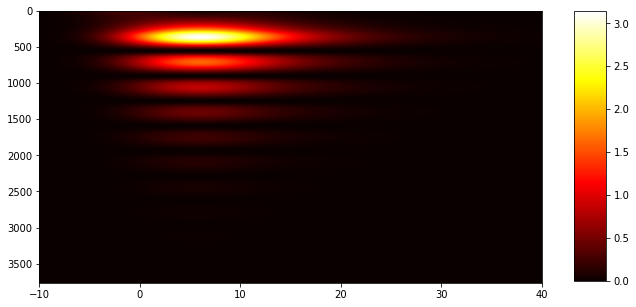

In [20]:

res1 = cut_BSW_intesity_1(46.33, np.arange(-10, 40, 0.1), didic, a=5., L=0, polar='TE', wl=780.)#=wl_Ag)
real_res = np.array(res1)
sum_arr = get_struct_height(didic)
plot_2Dmap(real_res[::-1], [-10, 40, sum_arr, 0], isE=True)

#plt.imshow(real_res[::-1], cmap=plt.cm.inferno, origin='lower', aspect='auto')    

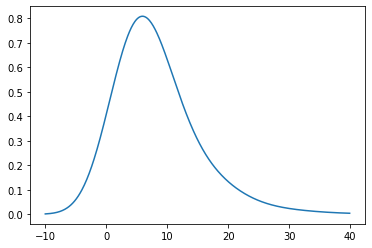

In [46]:
I_x = np.sum(real_res * np.sin(46.33 / 180. * np.pi) / 1000 / np.sqrt(np.pi / 2), axis=0)
X_ = np.arange(-10, 40, 0.1)
plt.plot(X_, I_x)
df10=pd.DataFrame(list(zip(X_, I_x)), columns=['X', 'Efficiensy'])
df10.to_csv("KPD_from_X.csv")


In [39]:
print(np.shape(real_res))

(3765, 500)


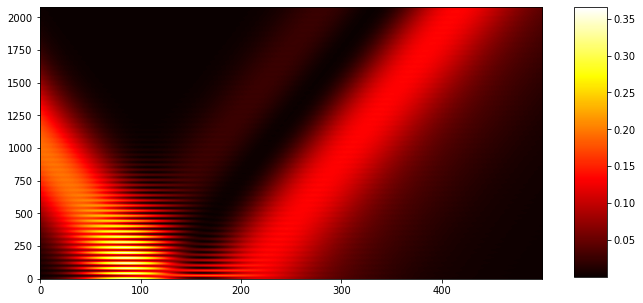

In [27]:
plot_2Dmap(res)


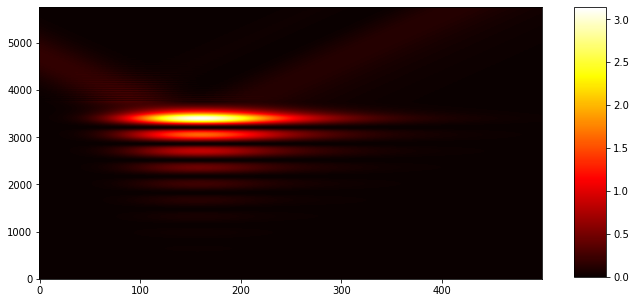

In [33]:
full_data = np.vstack((real_res[::-1], abs(res) ** 2))
plot_2Dmap(full_data, isE=True)


In [34]:
print(np.shape(full_data))

(5765, 500)


In [35]:
df=pd.DataFrame(full_data, columns=np.arange(-10, 40, 0.1), index=np.arange(0, 5765, 1))
df.to_csv("Intens_full_X" + ".csv")

In [36]:
df1=pd.DataFrame(res, columns=np.arange(-10, 40, 0.1), index=np.arange(0, 20, 0.01), dtype=np.complex)
df1.to_csv("E_full_prism" + ".csv")

In [37]:
df2=pd.DataFrame(res_r, columns=np.arange(-10, 40, 0.1), index=np.arange(0, 20, 0.01), dtype=np.complex)
df2.to_csv("E_refl_prism" + ".csv")

In [38]:
df3=pd.DataFrame(res_i, columns=np.arange(-10, 40, 0.1), index=np.arange(0, 20, 0.01), dtype=np.complex)
df3.to_csv("E_input_prism" + ".csv")

In [40]:
df4=pd.DataFrame(real_res, columns=np.arange(-10, 40, 0.1), index=np.arange(0, 3765, 1), dtype=np.complex)
df4.to_csv("Intens_FK" + ".csv")

In [28]:
print(np.shape(np.arange(20 / k * 199, 20 / k * (199 + 1), 0.01)))

(10,)


0
(3, 100, 500)
1
(3, 100, 500)
2
(3, 100, 500)
3
(3, 100, 500)
4
(3, 100, 500)
5
(3, 100, 500)
6
(3, 100, 500)
7
(3, 100, 500)
8
(3, 100, 500)
9
(3, 100, 500)
10
(3, 100, 500)
11
(3, 100, 500)
12
(3, 100, 500)
13
(3, 100, 500)
14
(3, 100, 500)
15
(3, 100, 500)
16
(3, 100, 500)
17
(3, 100, 500)
18
(3, 100, 500)
19
(3, 100, 500)


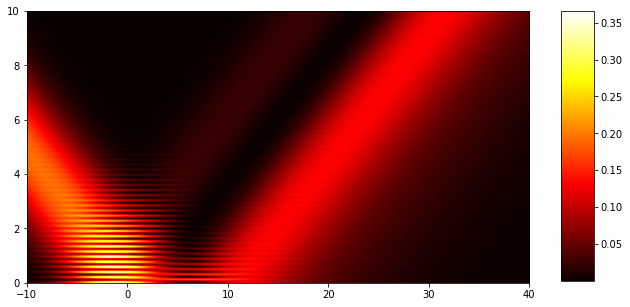

In [32]:
didic ={
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 295},  
    2: {'name': 'ФК', 'N' : 10,
        'n1': 1.45 + 0.00002j, 'd1': 204.,
        'n2': 2.07 + 0.00002j, 'd2': 143.},
    3: {'name': 'Среда', 'n': 1.52 + 0.j }
}

# k = 200
for i in range(20):
    print(i)
    tmp = vizualize_beam(X=np.arange(-10, 40, 0.1), Z=np.arange(i, (i + 1), 0.01), 
                         struct=didic, alpha=46.33, l_0=0, a=5, mode='f')
    print(np.shape(tmp))
    if i > 0:
        res = np.vstack((res, tmp[2]))
        res_r = np.vstack((res_r, tmp[0]))
        res_i = np.vstack((res_i, tmp[1]))
    else:
        res = tmp[2]
        res_r = tmp[0]
        res_i = tmp[1]
# full_beam = res[0] + res[1]
plot_2Dmap(res, [-10, 40, 0, 10])

In [4]:
Otto_struct ={
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 295},  
    2: {'name': 'ФК', 'N' : 10,
        'n1': 1.45 + 0.00002j, 'd1': 204.,
        'n2': 2.07 + 0.00002j, 'd2': 143.},
    3: {'name': 'Среда', 'n': 1.52 + 0.j }
}

k_mkm = 2 * np.pi * 1.0e3 / 780. * Otto_struct[0]['n']
k_x = get_k_x(a=5, N_x=401, decr_times=20)
s = spectral(a=5, k=k_x).reshape((-1, 1))
angles = 180 / np.pi * np.arcsin(k_x / k_mkm) + 46.3
R = vectorize_R(angles, 780., Otto_struct, 'TE').reshape((-1, 1))
TMMs = generate_TMM(Otto_struct[0]['n'], Otto_struct[0]['n'], Otto_struct[1]['n'], angles, 'TE')
E_inc = np.hstack((s, s * R)).T
k_xz = get_K_xz_air(k_mkm, k_mkm / Otto_struct[0]['n'], angles)
E_plus, E_minus = E_air_spectrum(s, R, TMMs)

In [67]:
X = np.arange(-5, 35, 1)
Z = Otto_struct[1]['d'] / 1000.
kek = np.vstack((X, Z * np.ones(np.size(X)))).T
print(np.shape(kek), "\n", kek[:10])
phase = 1.0j * kek @ k_xz
print(np.shape(phase), '\n', phase[:10])
E_forward = np.exp(1.0j * kek @ k_xz, dtype=np.complex) @ E_plus * (k_x[1] - k_x[0])
#E_backward = np.exp(1.0j * kek @ k_xz.conj(), dtype=np.complex) @ E_minus * dk
#E_destr[j] = (E_forward + E_backward).T 

(40, 2) 
 [[-5.     0.295]
 [-4.     0.295]
 [-3.     0.295]
 [-2.     0.295]
 [-1.     0.295]
 [ 0.     0.295]
 [ 1.     0.295]
 [ 2.     0.295]
 [ 3.     0.295]
 [ 4.     0.295]]
(40, 401) 
 [[-0.51409123-41.2085728j  -0.51760794-41.22121727j
  -0.52110099-41.23385815j ..., -1.30600520-45.95880037j
  -1.30737937-45.97002285j -1.30875200-45.98124176j]
 [-0.51409123-32.96685824j -0.51760794-32.97697381j
  -0.52110099-32.98708652j ..., -1.30600520-36.76704029j
  -1.30737937-36.77601828j -1.30875200-36.78499341j]
 [-0.51409123-24.72514368j -0.51760794-24.73273036j
  -0.52110099-24.74031489j ..., -1.30600520-27.57528022j
  -1.30737937-27.58201371j -1.30875200-27.58874505j]
 ..., 
 [-0.51409123+16.48342912j -0.51760794+16.48848691j
  -0.52110099+16.49354326j ..., -1.30600520+18.38352015j
  -1.30737937+18.38800914j -1.30875200+18.3924967j ]
 [-0.51409123+24.72514368j -0.51760794+24.73273036j
  -0.52110099+24.74031489j ..., -1.30600520+27.57528022j
  -1.30737937+27.58201371j -1.30875200+27.5

asin = np.arcsin(1 / 1.5)
eps = 1e-3
print("TIR angle: ", 180 / np.pi * asin)
N_prism = N_calculation(1.5, asin - eps, 1.5)
N_air = N_calculation(1.5, asin - eps, 1)
print("N_prism: ", N_prism, "N_air: ", N_air)
tm_pa = transfer_matrix(N_prism, N_air, polar="TM", n1=1.5, n2=1)
print(tm_pa)

#### R calculation:

In [3]:
wl = 780.
didic = {
    0: {'name': 'Среда', 'n': 1.5 + 0.j}, 
    1: {'name': 'ФК', 'N' : 10,
        'n1': 2.07+0.00001j,   'd1': 143.,
        'n2': 1.45 + 0.00002j, 'd2': 204.},
    2: {'name': 'Среда', 'n': 1. + 0.j}
}

"""
didic ={
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 300},  
    2: {'name': 'ФК', 'N' : 10,
        'n1': 1.45 + 0.00002j, 'd1': 204.,
        'n2': 2.07 + 0.00002j, 'd2': 143.},
    3: {'name': 'Среда', 'n': 1.52 + 0.j }
}
"""

"\ndidic ={\n    0: {'name': 'Среда', 'n': 1.5 + 0.j},\n    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 300},  \n    2: {'name': 'ФК', 'N' : 10,\n        'n1': 1.45 + 0.00002j, 'd1': 204.,\n        'n2': 2.07 + 0.00002j, 'd2': 143.},\n    3: {'name': 'Среда', 'n': 1.52 + 0.j }\n}\n"

Text(0, 0.5, '|R|')

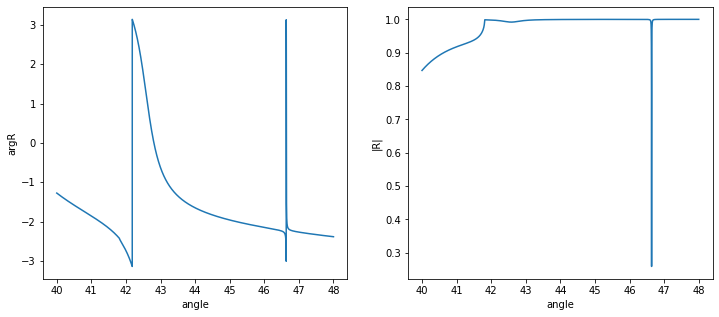

In [4]:
def decors(angles):
    wl = 780.
    return R_func(didic, wl, angles, polar='TE')
vectorize_R1 = np.vectorize(decors)

''' test vectorize R: '''
fig, ax1 = plt.subplots(1, 2, figsize=(12, 5))
angles = np.linspace(40, 48, 10000)
res = vectorize_R1(angles)
ax1[0].plot(angles, np.angle(res))
ax1[0].set_xlabel("angle")
ax1[0].set_ylabel("argR")

ax1[1].plot(angles, abs(res))
ax1[1].set_xlabel("angle")
ax1[1].set_ylabel("|R|")

Text(0, 0.5, '|R|')

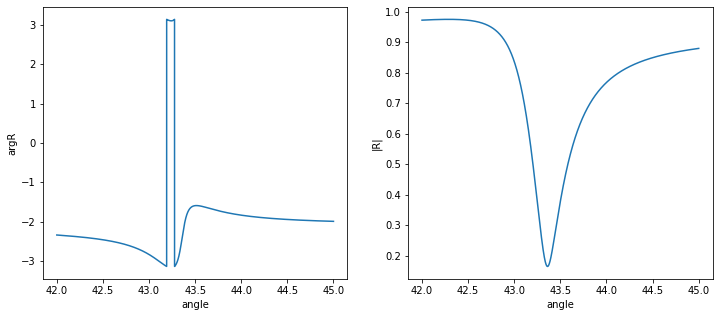

In [5]:
plasmon_struct = {
    0: {
        'name': 'Среда',
        'n': 1.5 + 0.j
    },
    1: {
        'name': 'Слой',
        'n': 1. + 0.j,
        'd': 300
    },  
    2: {
        'name': 'Слой',
        'n': 0.23 + 4.35j,
        'd': 50
    },
    3: {
        'name': 'Среда',
        'n': 1.52 + 0.j
    }
}



plasmon_struct = {
    0: {
        'name': 'Среда',
        'n': 1.5 + 0.j
    },
    1: {
        'name': 'Слой',
        'n': 0.23 + 4.35j,
        'd': 50
    },
    2: {
        'name': 'Среда',
        'n': 1. + 0.j
    }
}

fig, ax1 = plt.subplots(1, 2, figsize=(12, 5))
angles = np.linspace(42, 45, 10000)
res = vectorize_R(angles, wl, plasmon_struct, "TM")
ax1[0].plot(angles, np.angle(res))
ax1[0].set_xlabel("angle")
ax1[0].set_ylabel("argR")

ax1[1].plot(angles, abs(res))
ax1[1].set_xlabel("angle")
ax1[1].set_ylabel("|R|")
#43 - в Отто, 42.6 - в кречмане

In [9]:
def spectral(a, k):
    return np.sqrt(a)/(2 * np.sqrt(np.pi)) * np.exp(-a**2 * k**2 / 4)
vectorize_spectral = np.vectorize(spectral)

a - значение координаты, по уровню амлитуды $\frac{1}{e}$ (в микрометрах). Полная ширина = 2a. 
N_x - число гармоник по k_x, которые будем использовать.
Меньшая гармоника будет по амплитуде составлять не больше 1/20.
(50a - ограничимся таким масштабом по х)

Fix: Мощность в перетяжке гауссовога пучка $P \propto w  \sim \Rightarrow S = \frac{\sqrt{a}}{2 \sqrt{\pi}}e^{-{(\frac{ak_x}{2}})^2}$

In [6]:
a = 5
N_x = 200
wl = 780.

k_min = 2 * np.sqrt(np.log(8)) / a
k = 2 * np.pi * 1000000000 / wl * didic[0]['n']
print("k_min = %f"%k_min)
print(k/1000000)

k_min = 0.576811
(12.08304866765305+0j)


dk: 0.0057681075464
Угол сходимости, град: (-2.73617923547+0j)


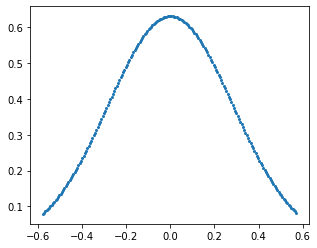

In [7]:
plt.figure(figsize=(5, 4))
dk_x = 2 * k_min / N_x
print("dk: " + str(dk_x))
k_n = np.arange(-N_x // 2, N_x // 2)
k_x = k_n * dk_x
S_k = []

for i in (k_x):
    y = spectral(a, i)
    S_k.append(y)
print("Угол сходимости, град: " + str(np.arcsin(k_x[0] * 1000000 / k) * 180 / np.pi))
S_k = np.array(S_k)
plt.plot(k_x, S_k, 'o', markersize=2)

In [12]:
def get_k_x(a=7, N_x=200, decr_times=20):
    k_min = 2 * np.sqrt(np.log(decr_times)) / a
    dk_x = 2 * k_min / N_x
    return np.arange(-N_x // 2, N_x // 2) * dk_x

def S_k(a, k_x):
    return vectorize_spectral(a, k_x)




#### Прямая прогонка: рассчет прямого поля от падающего луча. Обратная прогонка рассчет отраженного луча. 
#### l - расстояние вдоль оси пучка, на которое мы недоюстировались. + - перефокусировка, -  - недофокусировка (желательно целое число микрон)
#### alpha - угол падения центральной спектральной компоненты 

NameError: name 'k_matrix' is not defined

Angle: 45.000000


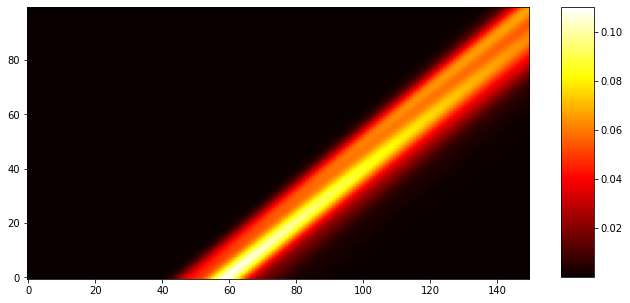

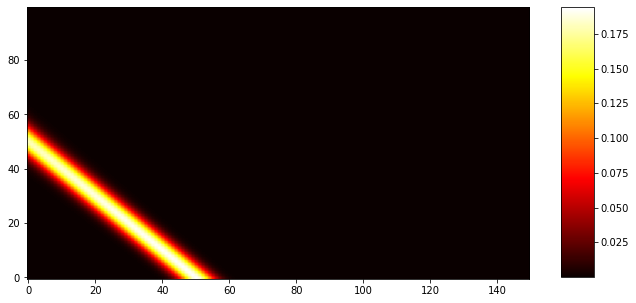

Angle: 45.100000


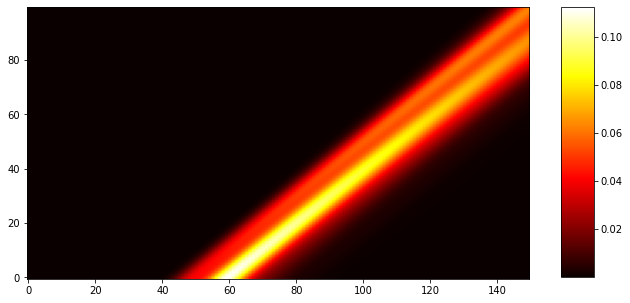

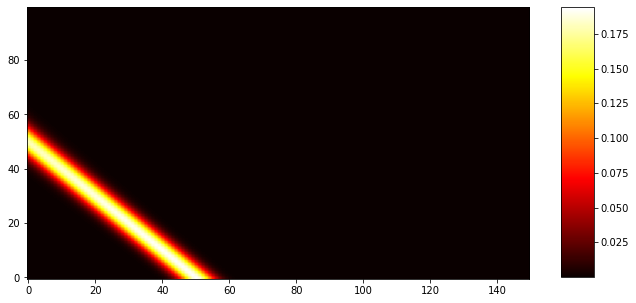

Angle: 45.200000


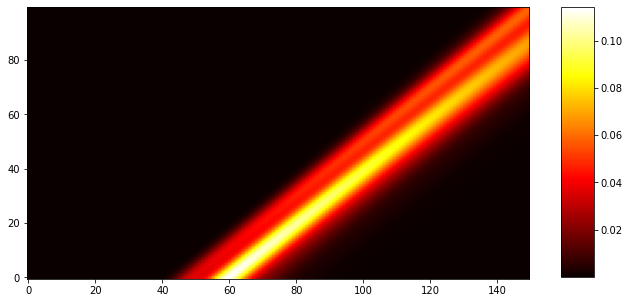

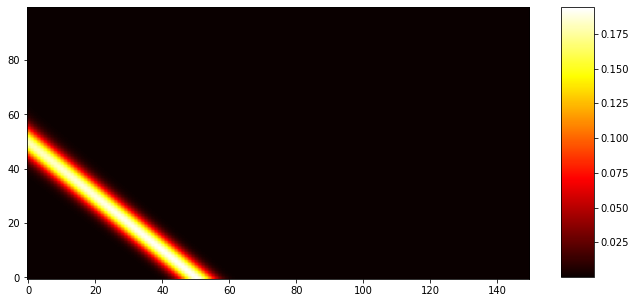

Angle: 45.300000


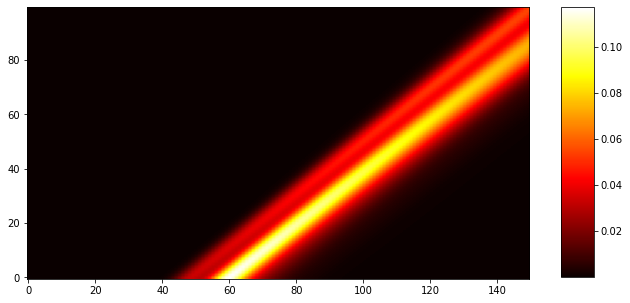

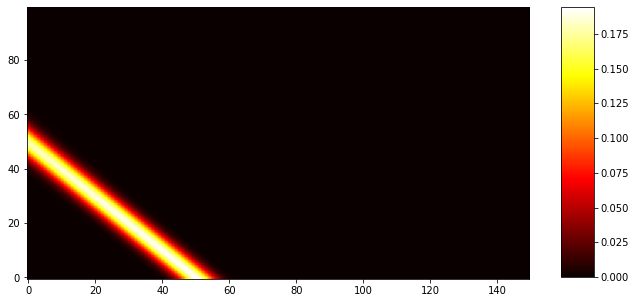

Angle: 45.400000


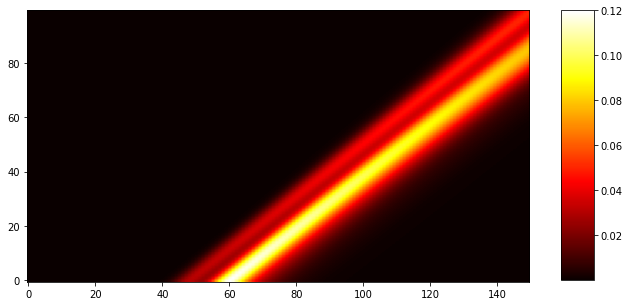

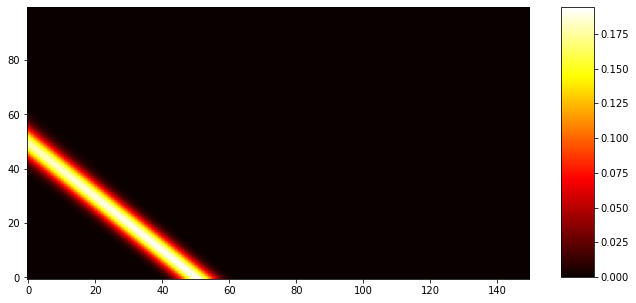

Angle: 45.500000


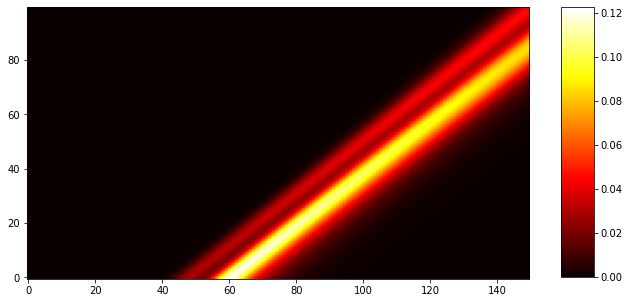

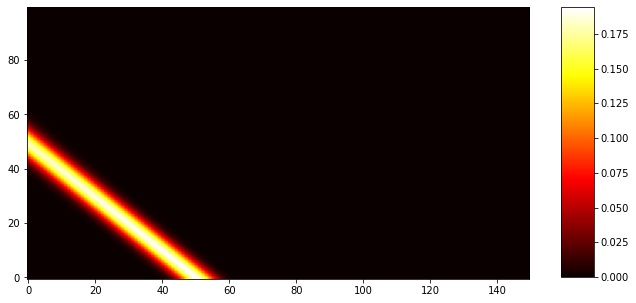

Angle: 45.600000


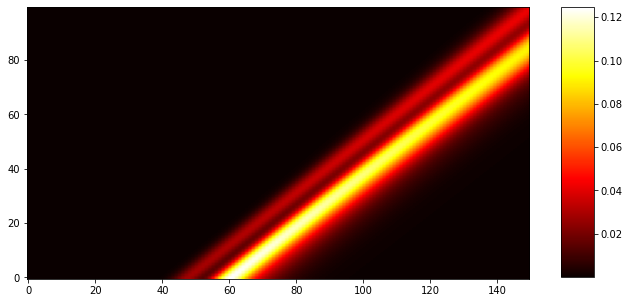

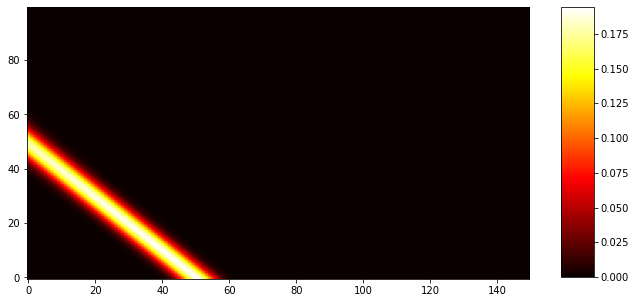

Angle: 45.700000


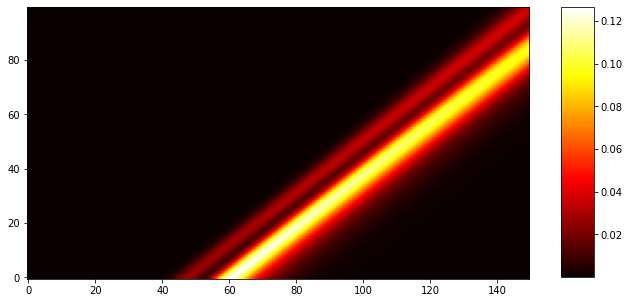

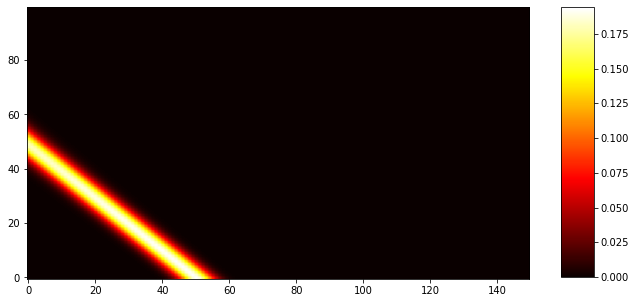

Angle: 45.800000


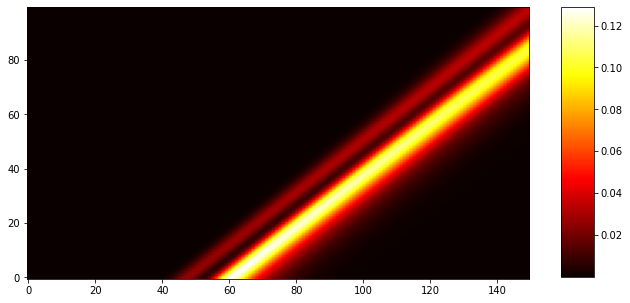

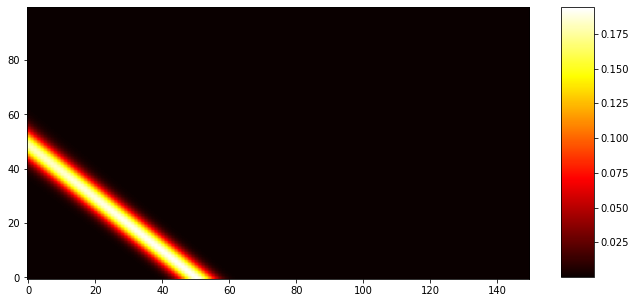

Angle: 45.900000


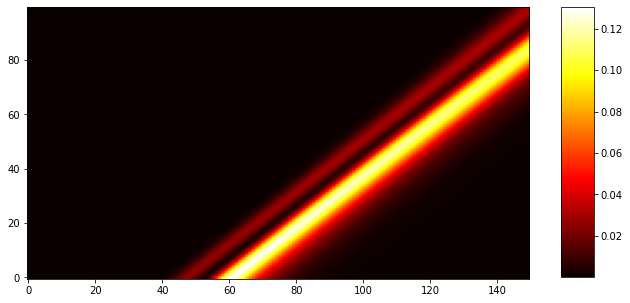

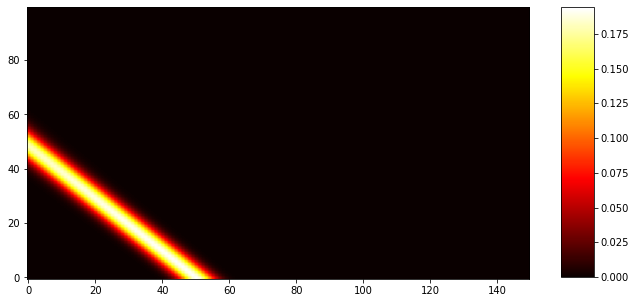

Angle: 46.000000


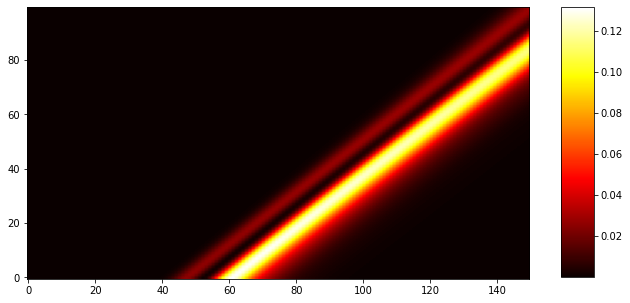

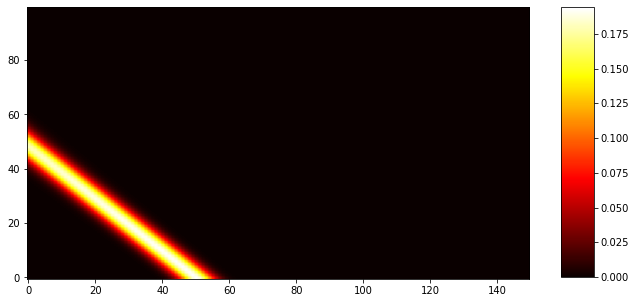

Angle: 46.100000


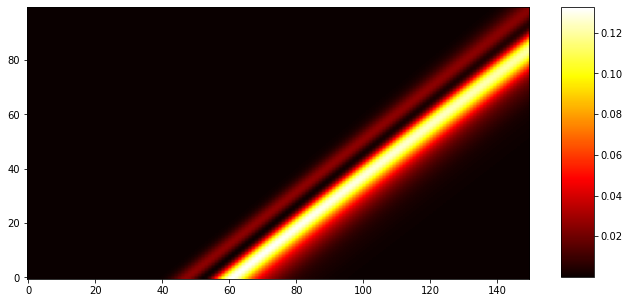

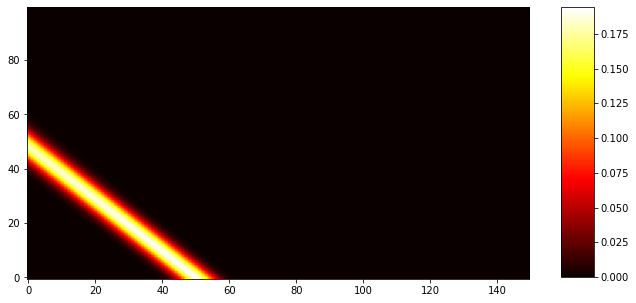

Angle: 46.200000


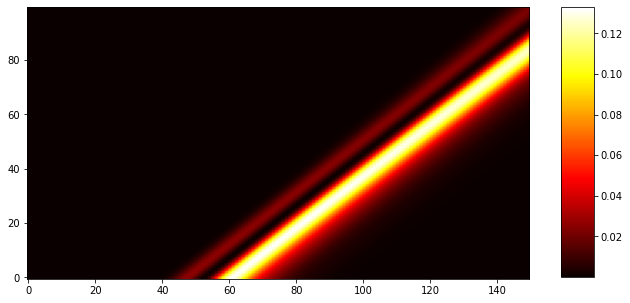

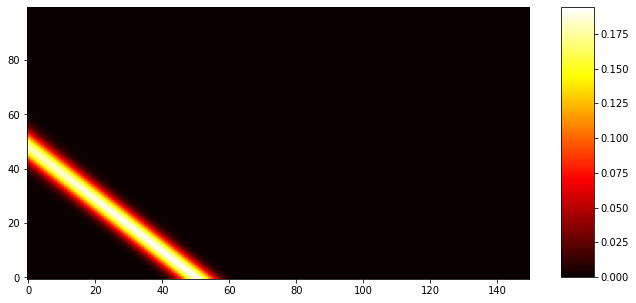

Angle: 46.300000


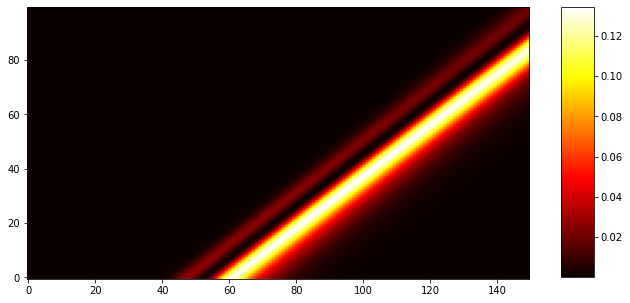

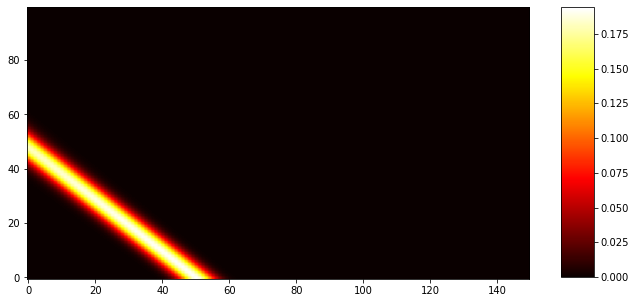

Angle: 46.400000


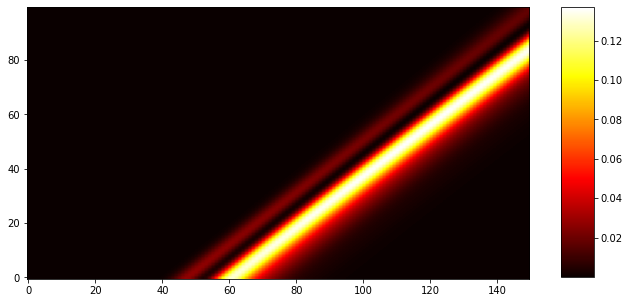

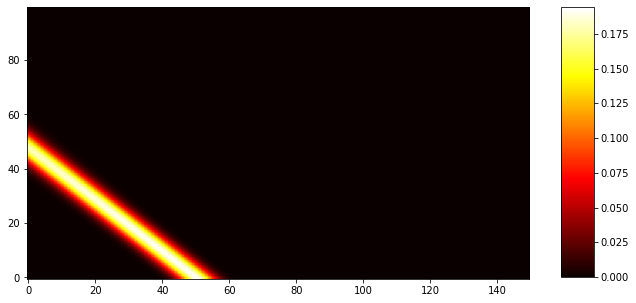

Angle: 46.500000


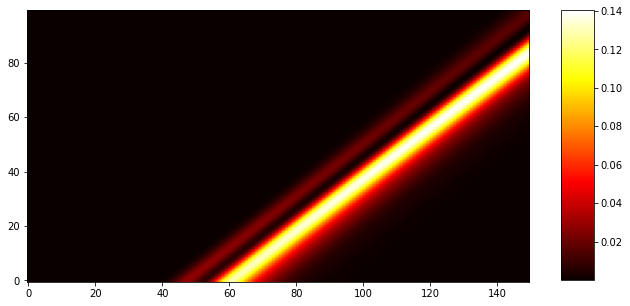

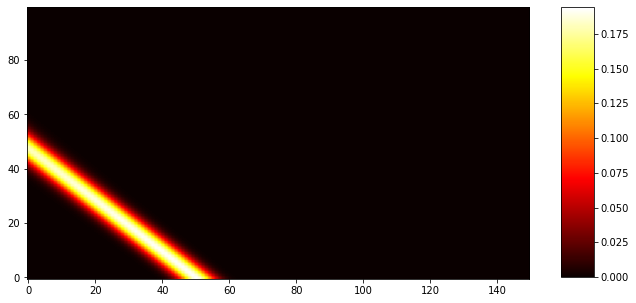

Angle: 46.600000


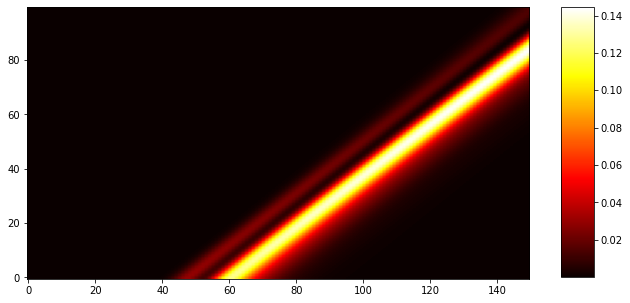

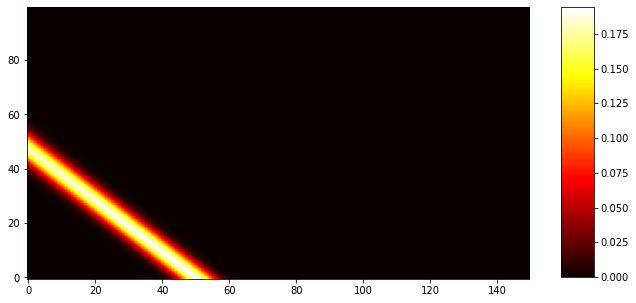

Angle: 46.700000


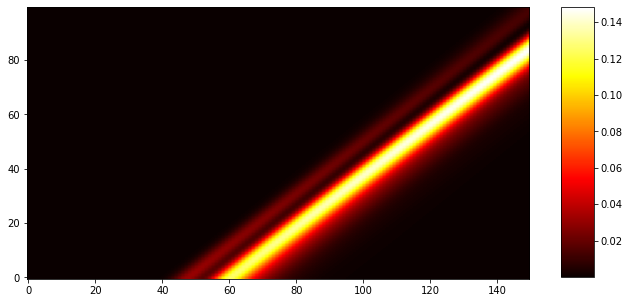

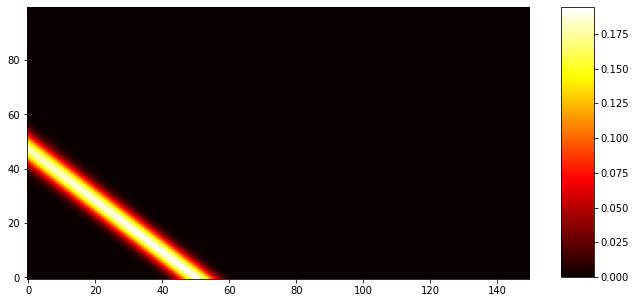

Angle: 46.800000


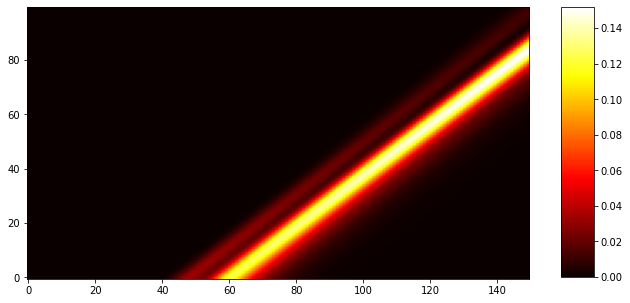

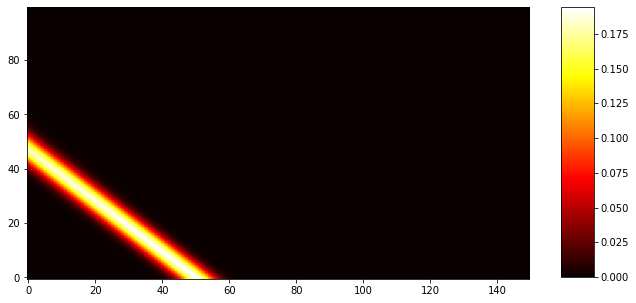

Angle: 46.900000


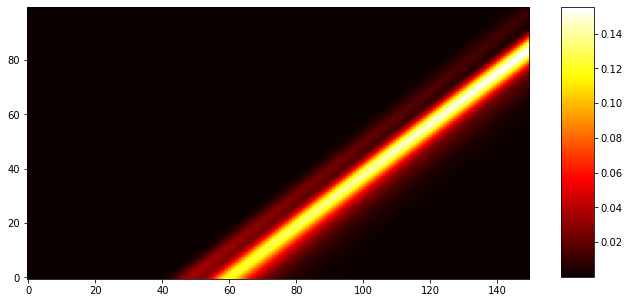

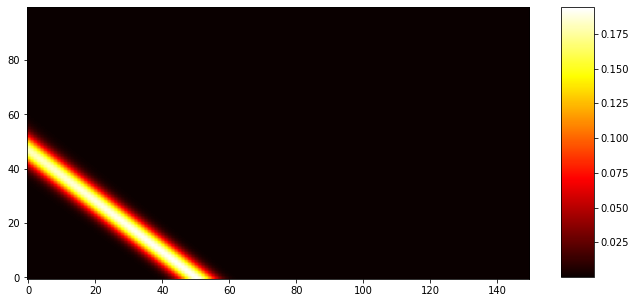

CPU times: user 25.8 s, sys: 2.84 s, total: 28.7 s
Wall time: 28.6 s


In [5]:
%%time

'''
X - x-coordinate in micrometers
Z - z-coordinate in micrometers
E - electroagnetic field
'''

didic ={
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 295},  
    2: {'name': 'ФК', 'N' : 10,
        'n1': 1.45 + 0.00002j, 'd1': 204.,
        'n2': 2.07 + 0.00002j, 'd2': 143.},
    3: {'name': 'Среда', 'n': 1.52 + 0.j }
}


for angle in np.arange(45, 47, 0.1):
    print("Angle: %f" % angle)
    res = vizualize_beam(X=np.arange(-50, 100, 1), Z=np.arange(0, 100, 1), 
                         struct=didic, alpha=angle, l_0=0, a=5, mode='f')

In [97]:
def E_reflected_plane(s_r, init_angle, h=0):
    X = np.arange(-100, 100, 1)
    Z = np.arange(750, 751, 1)
    z0 = h / np.cos(np.pi * init_angle / 180)
    vec = np.empty((1, 2))
    E_r = np.zeros((np.size(Z), np.size(X)), dtype=np.complex)
    for j, z in enumerate(Z):
        for i, x in enumerate(X):
            vec[0, 0] = x
            vec[0, 1] = z + z0
            E_r[j][i] = np.exp(1.0j * vec @ k_matrix, dtype=np.complex) @ s_r
    print("angle: %f"% init_angle)
    plot_2Dmap(E_r)
    return E_r


CPU times: user 9 µs, sys: 0 ns, total: 9 µs
Wall time: 13.1 µs


Просто красивые срезы для 700 нм зазора:

angle: 40.000000


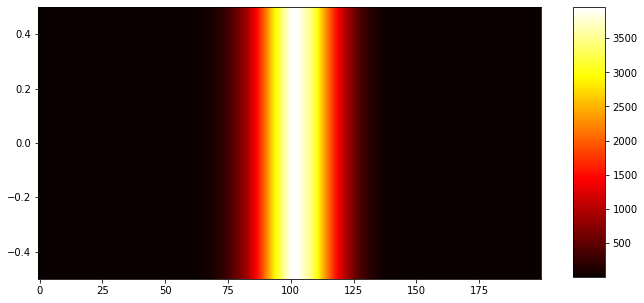

angle: 40.100000


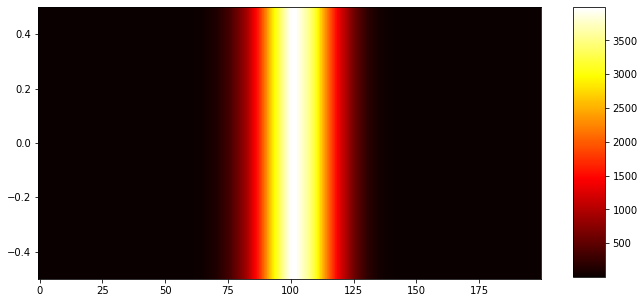

angle: 40.200000


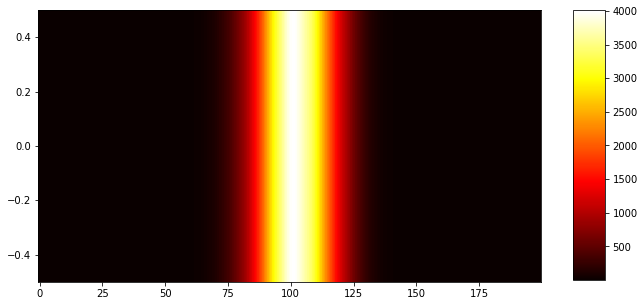

angle: 40.300000


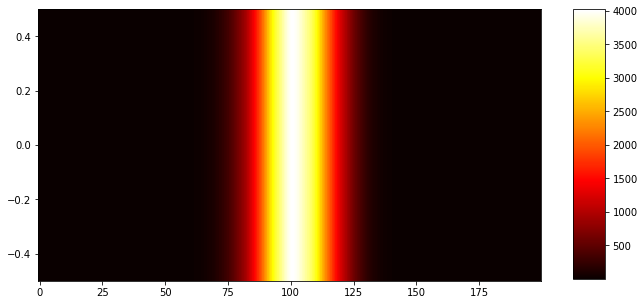

angle: 40.400000


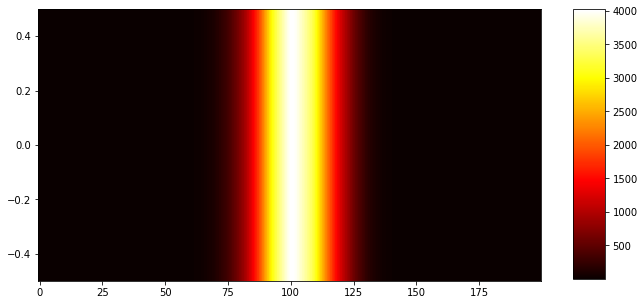

angle: 40.500000


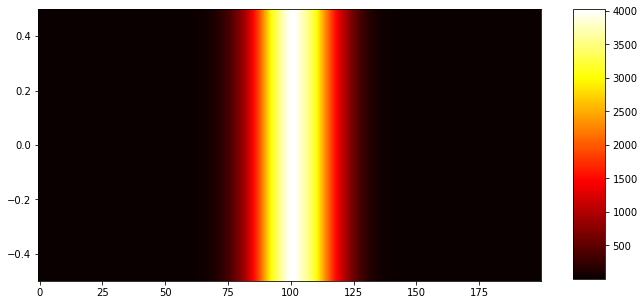

angle: 40.600000


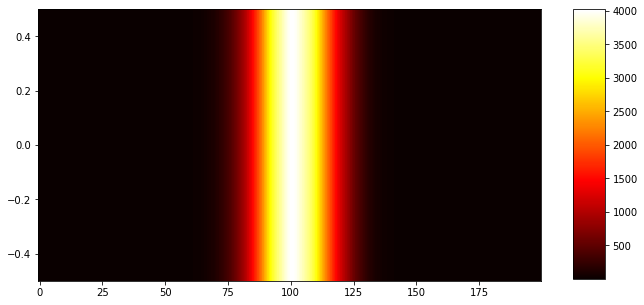

angle: 40.700000


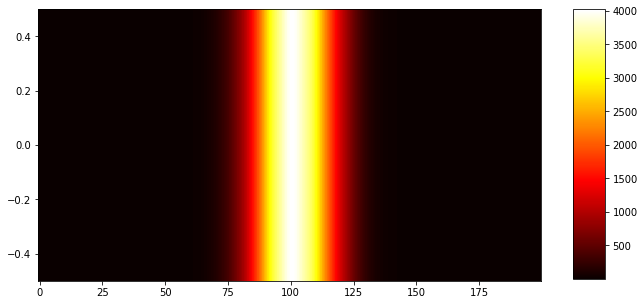

angle: 40.800000


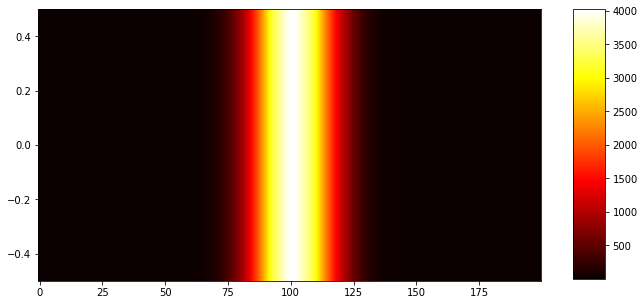

angle: 40.900000


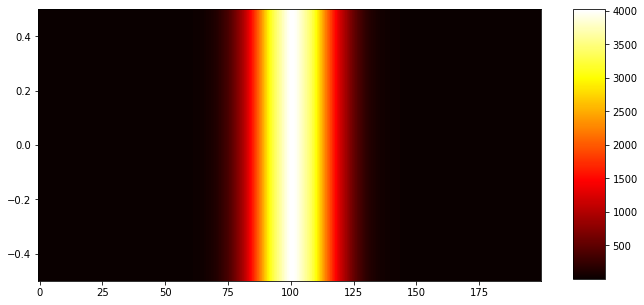

angle: 41.000000


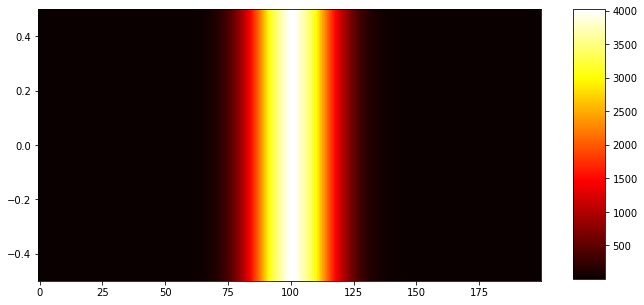

angle: 41.100000


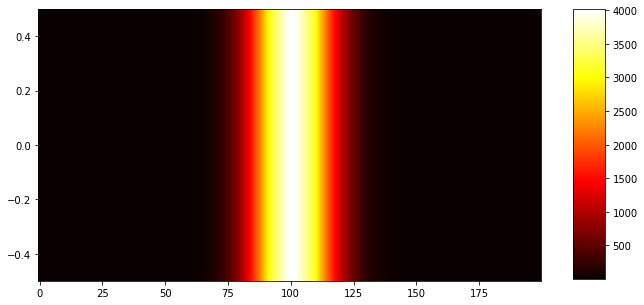

angle: 41.200000


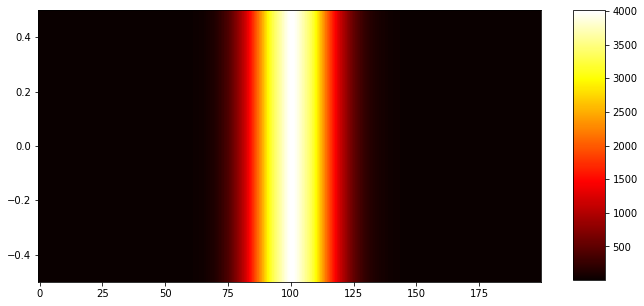

angle: 41.300000


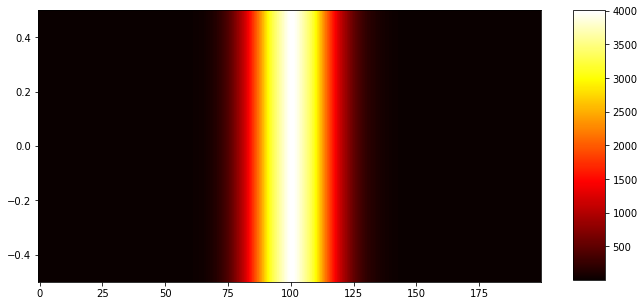

angle: 41.400000


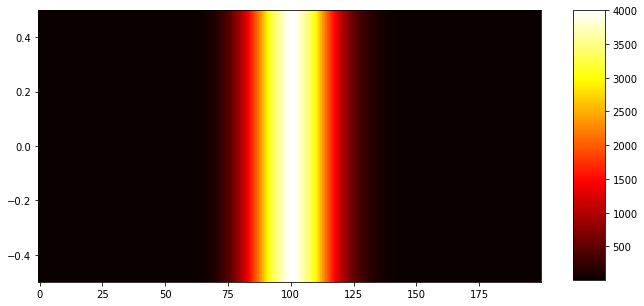

angle: 41.500000


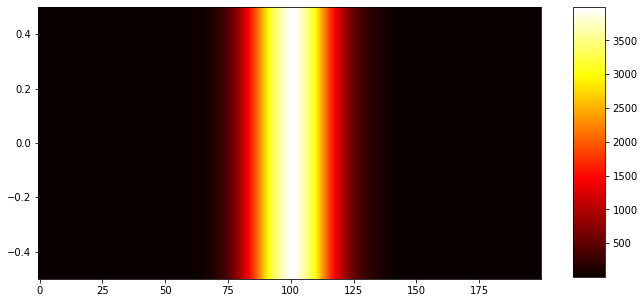

angle: 41.600000


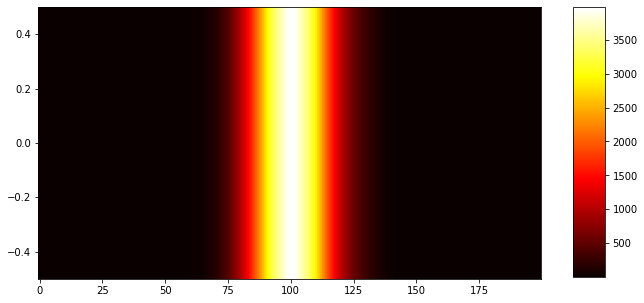

angle: 41.700000


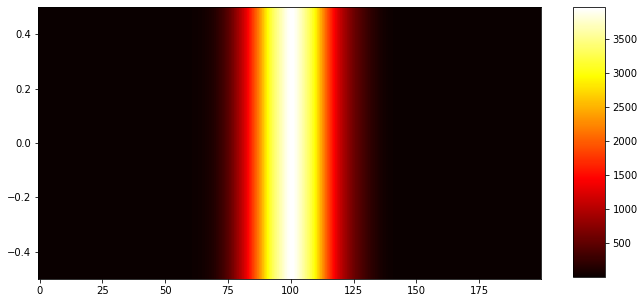

angle: 41.800000


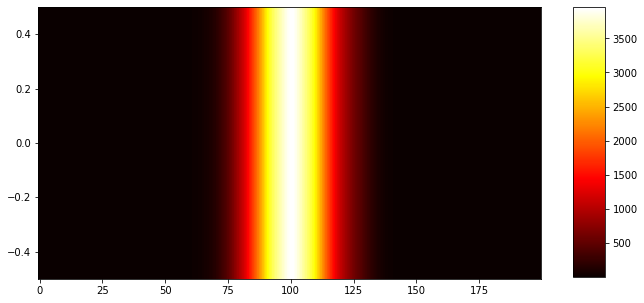

angle: 41.900000


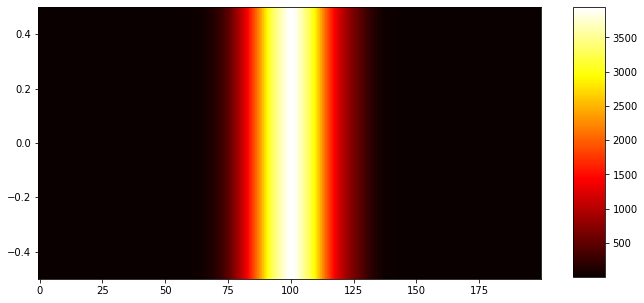

angle: 42.000000


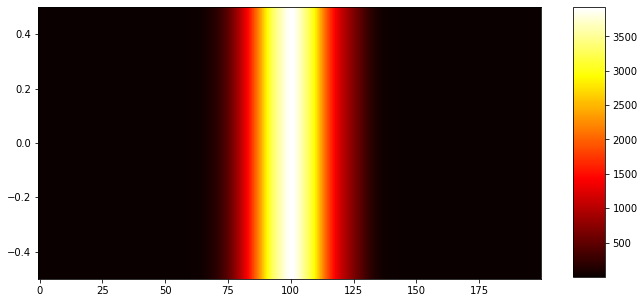

angle: 42.100000


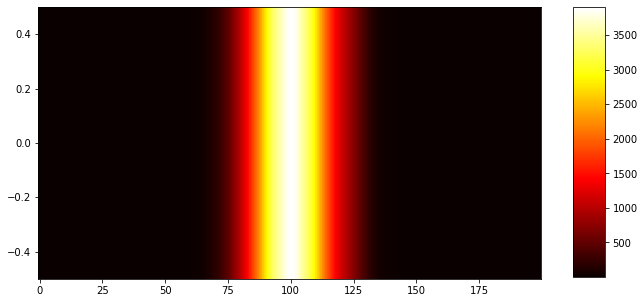

angle: 42.200000


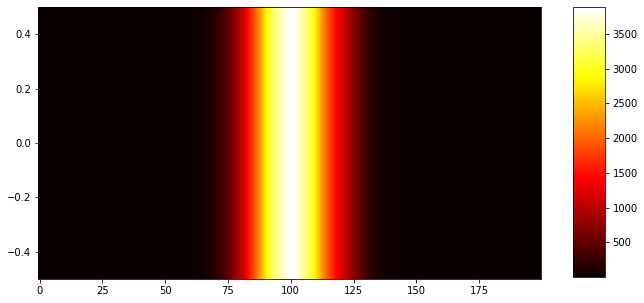

angle: 42.300000


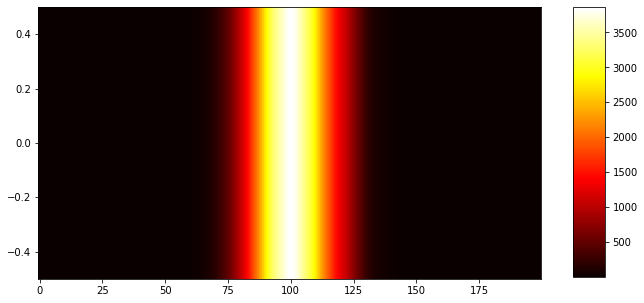

angle: 42.400000


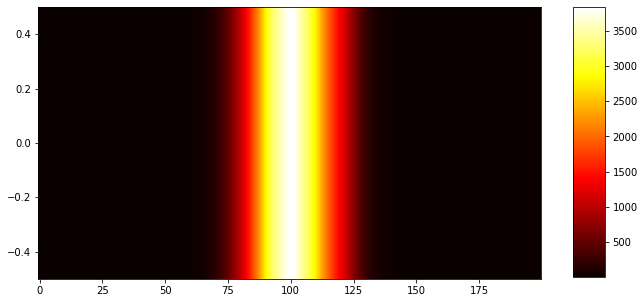

angle: 42.500000


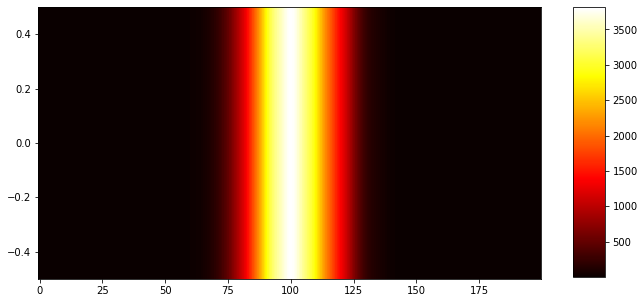

angle: 42.600000


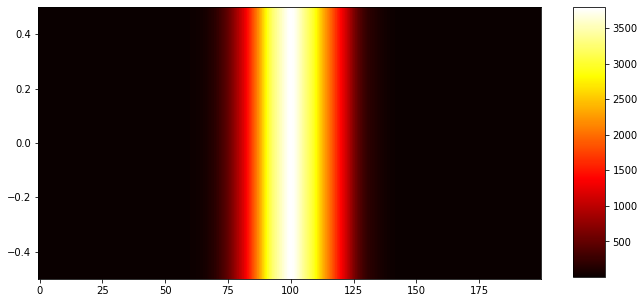

angle: 42.700000


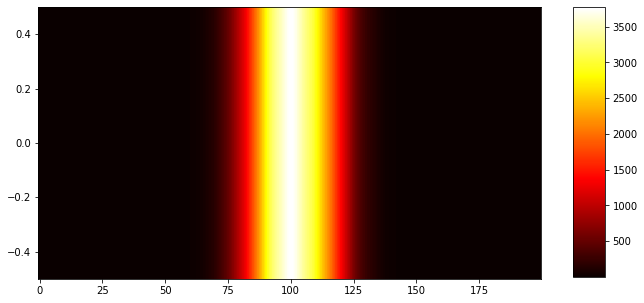

angle: 42.800000


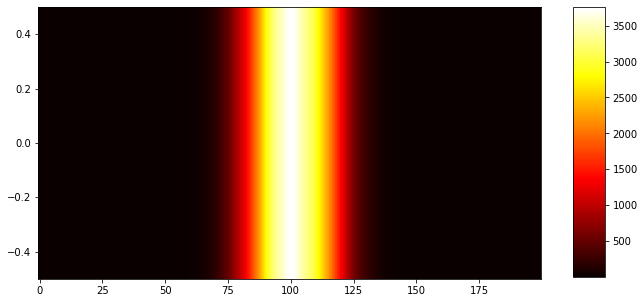

angle: 42.900000


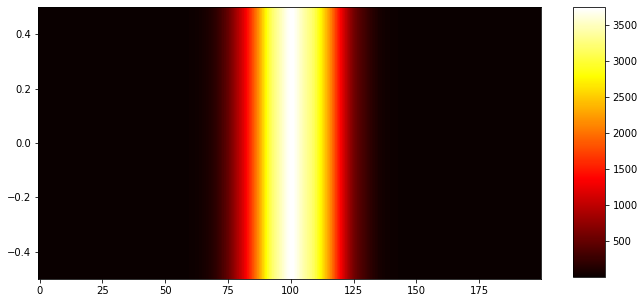

angle: 43.000000


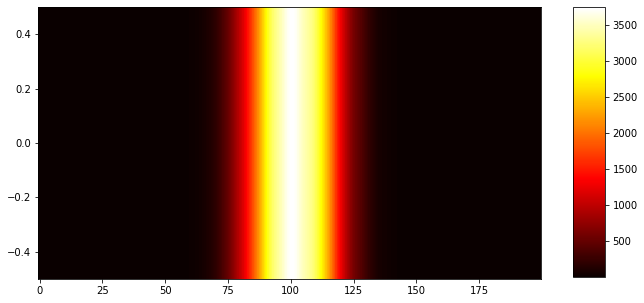

angle: 43.100000


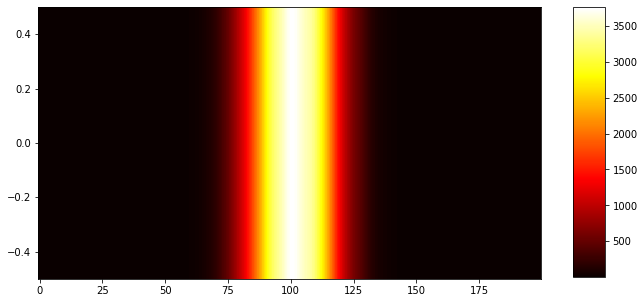

angle: 43.200000


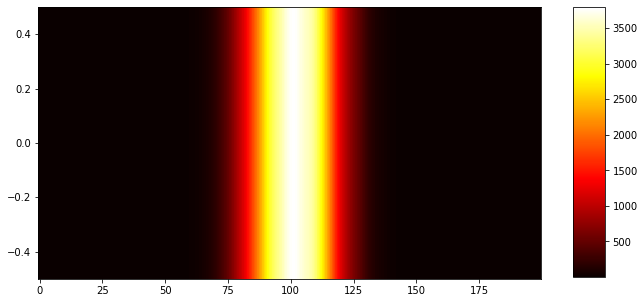

angle: 43.300000


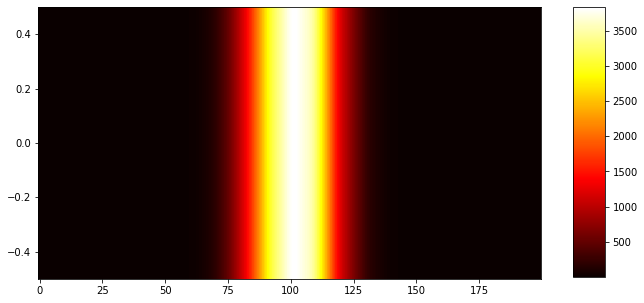

angle: 43.400000


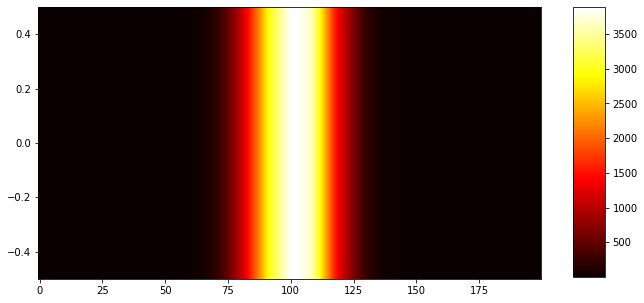

angle: 43.500000


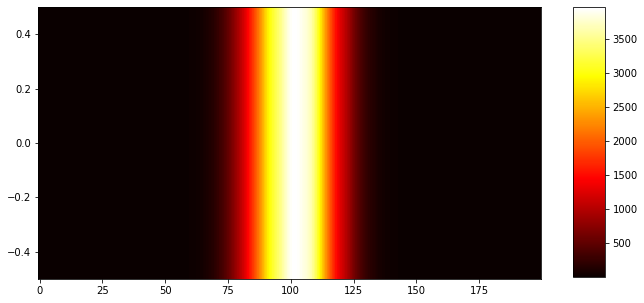

angle: 43.600000


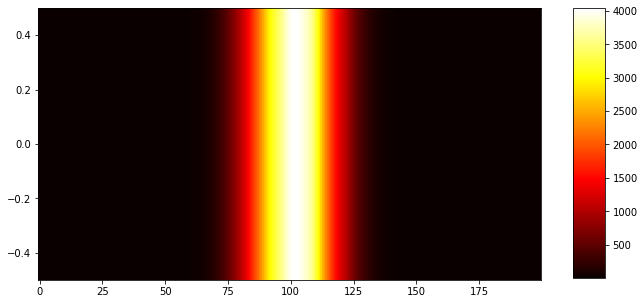

angle: 43.700000


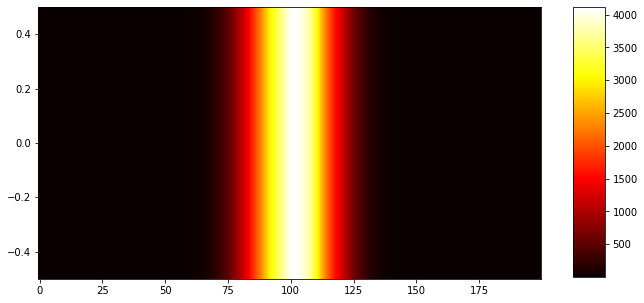

angle: 43.800000


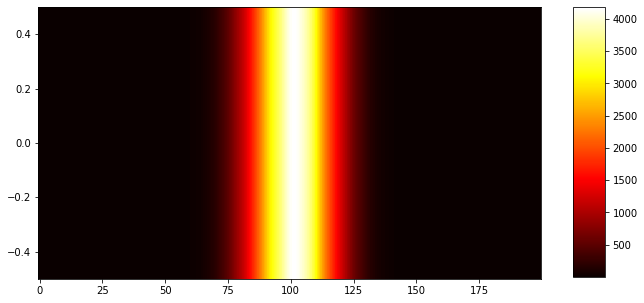

angle: 43.900000


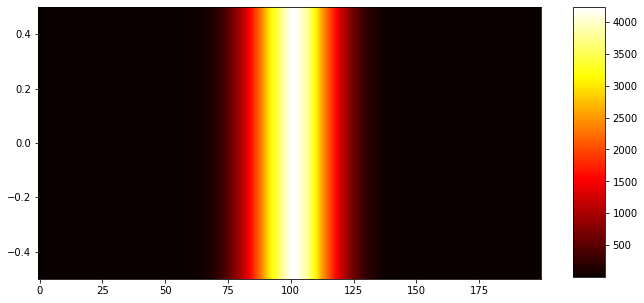

angle: 44.000000


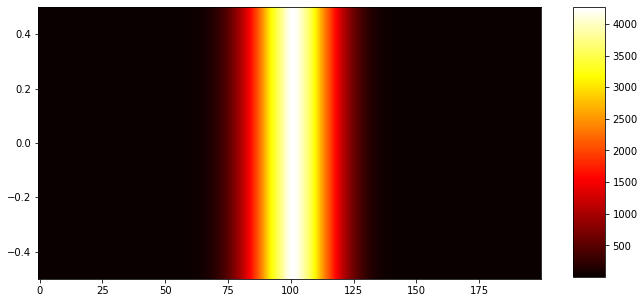

angle: 44.100000


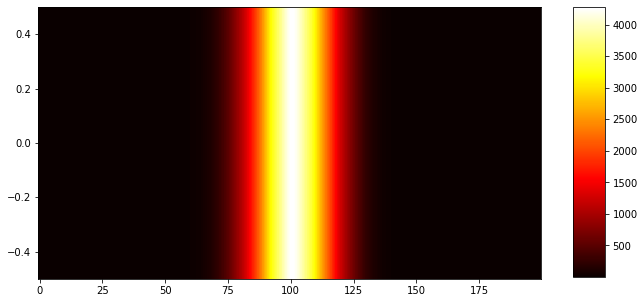

angle: 44.200000


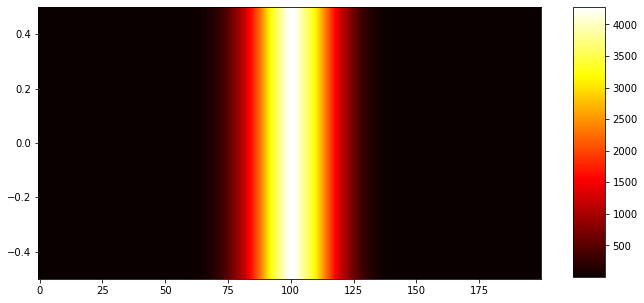

angle: 44.300000


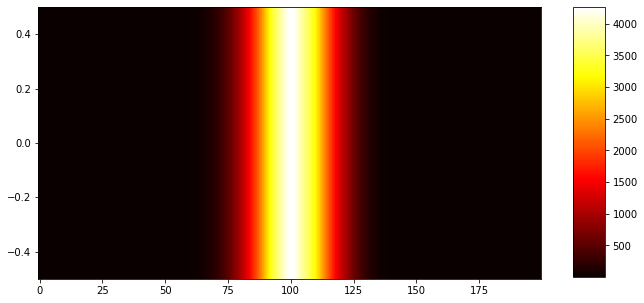

angle: 44.400000


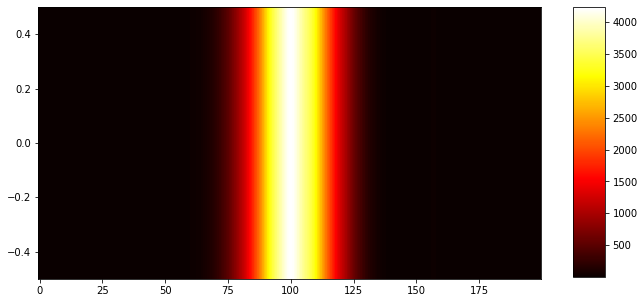

angle: 44.500000


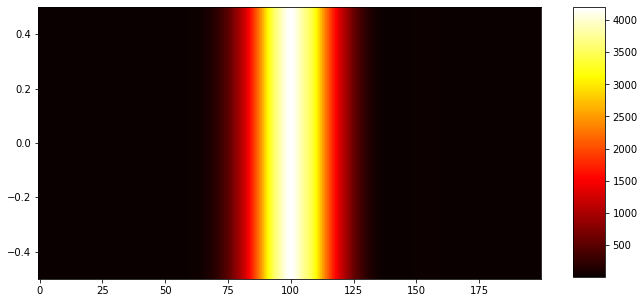

angle: 44.600000


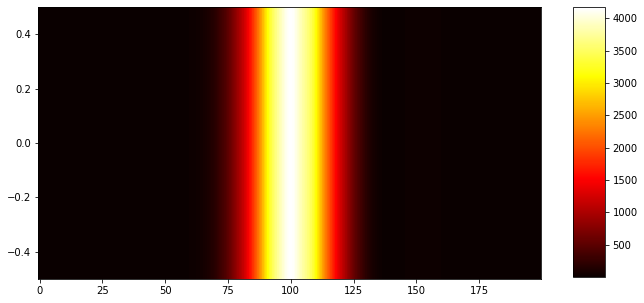

angle: 44.700000


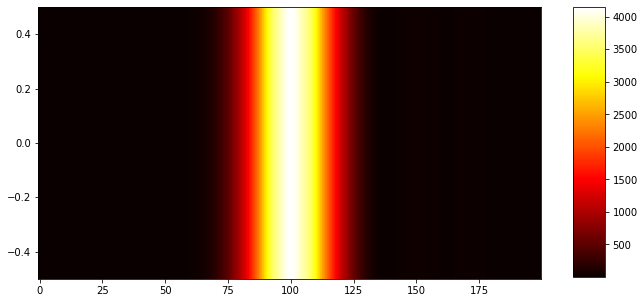

angle: 44.800000


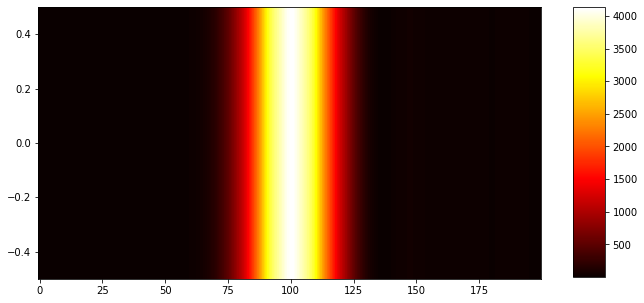

angle: 44.900000


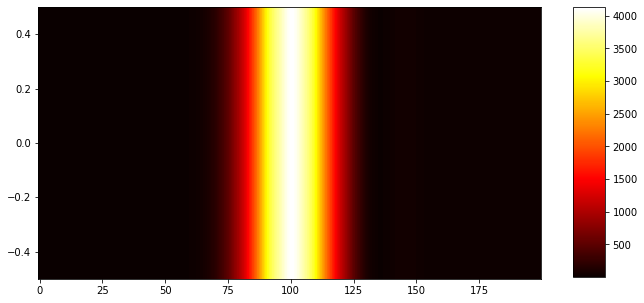

angle: 45.000000


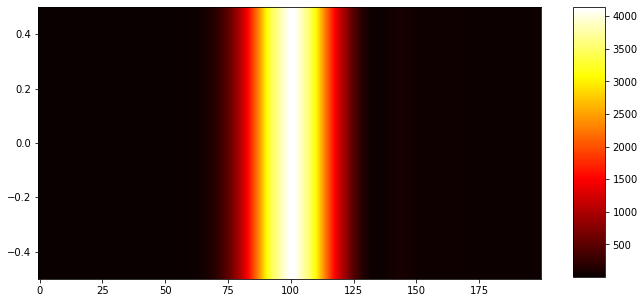

angle: 45.100000


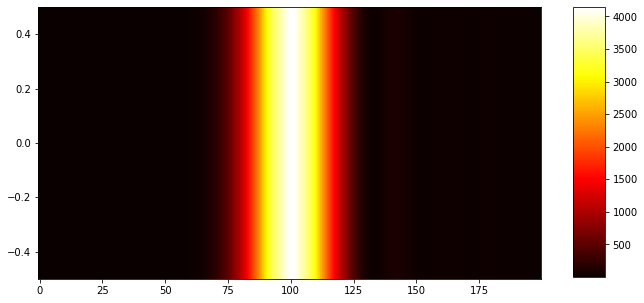

angle: 45.200000


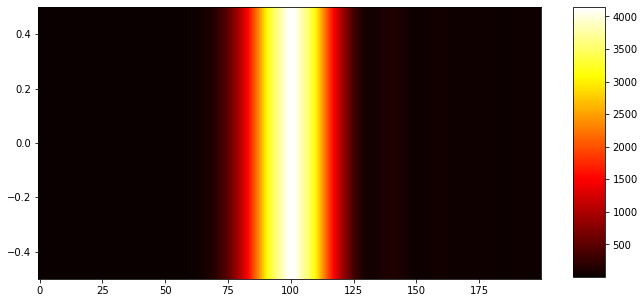

angle: 45.300000


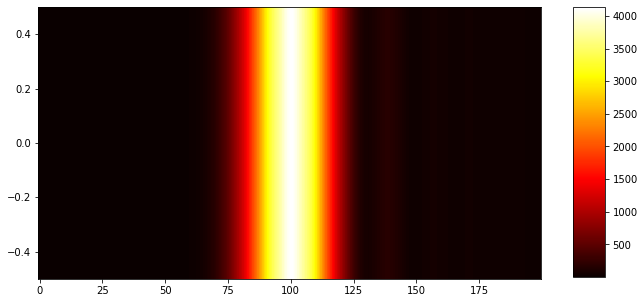

angle: 45.400000


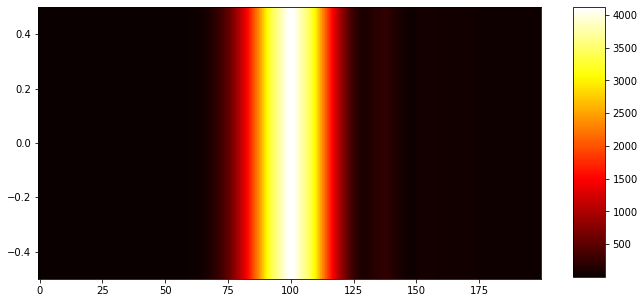

angle: 45.500000


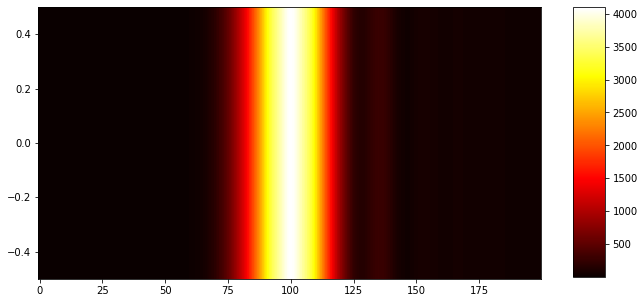

angle: 45.600000


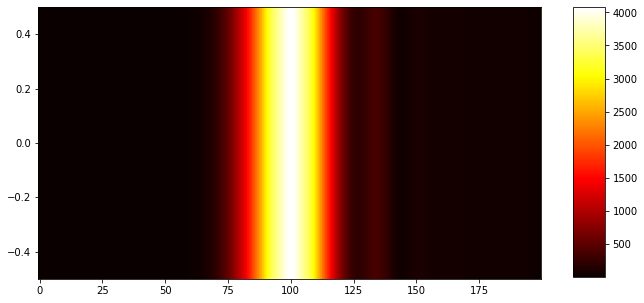

angle: 45.700000


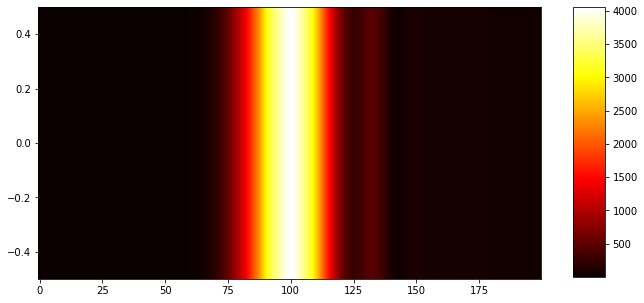

angle: 45.800000


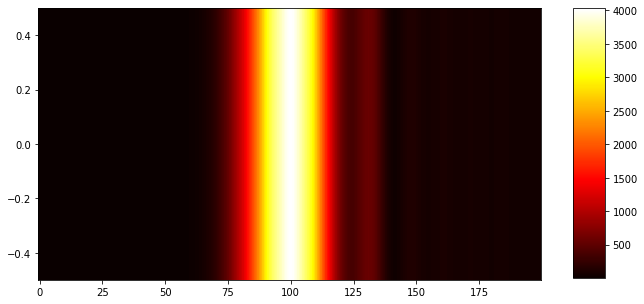

angle: 45.900000


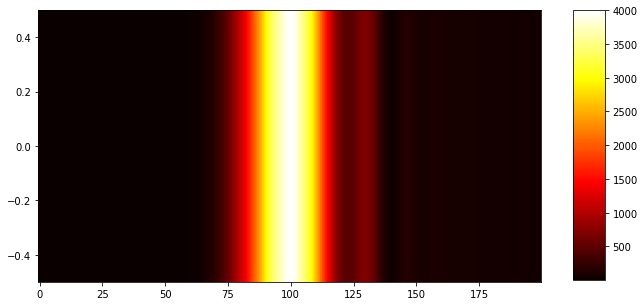

angle: 46.000000


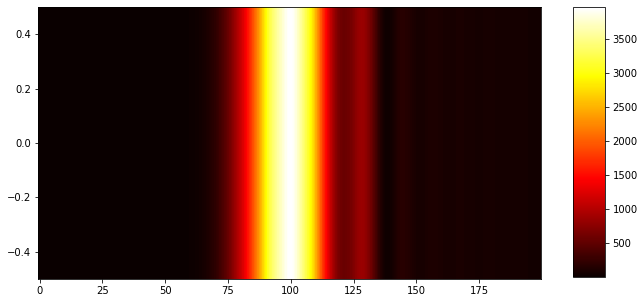

angle: 46.100000


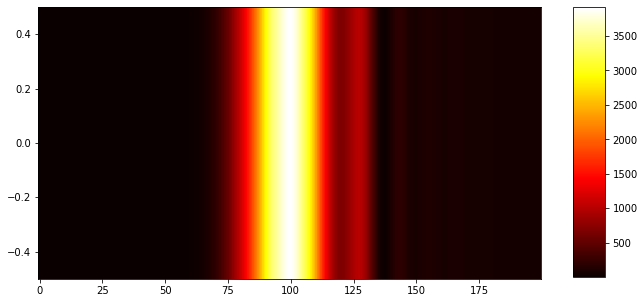

angle: 46.200000


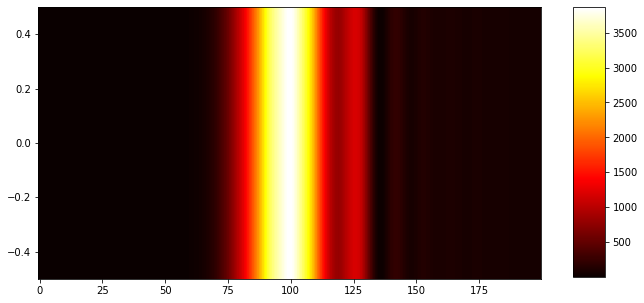

angle: 46.300000


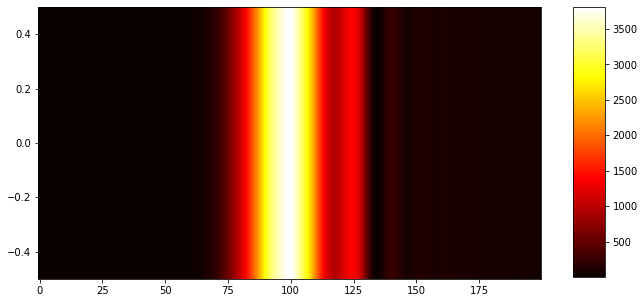

angle: 46.400000


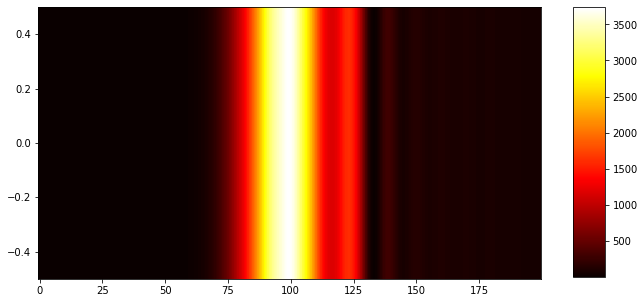

angle: 46.500000


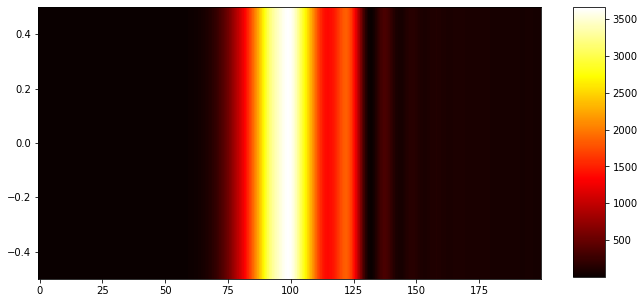

angle: 46.600000


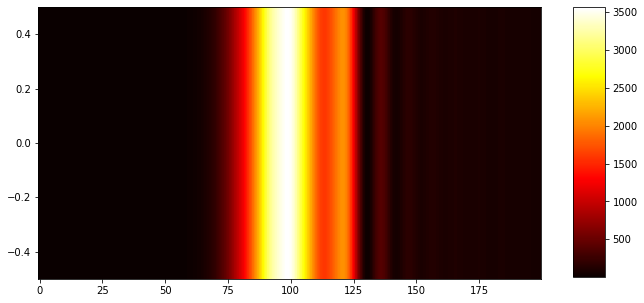

angle: 46.700000


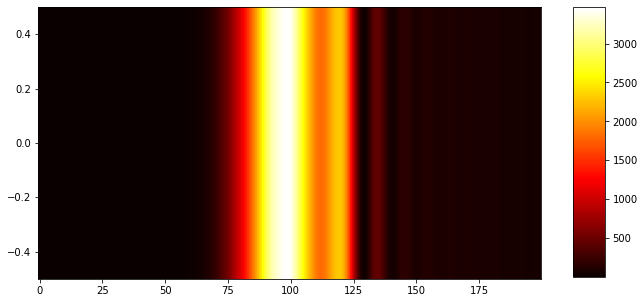

angle: 46.800000


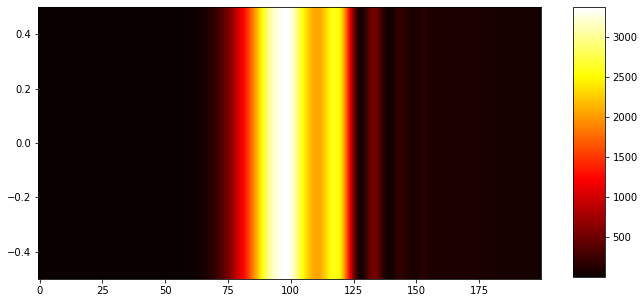

angle: 46.900000


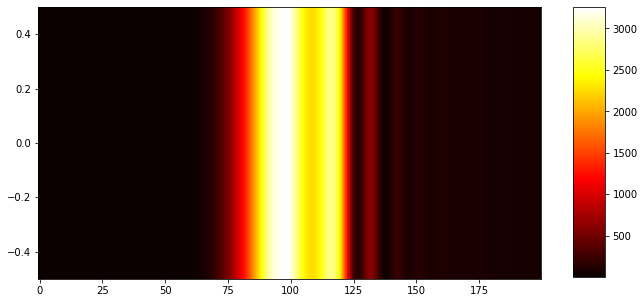

angle: 47.000000


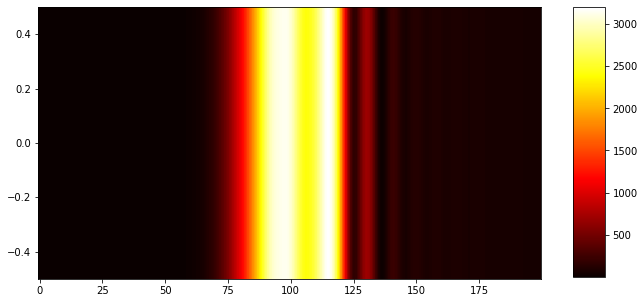

angle: 47.100000


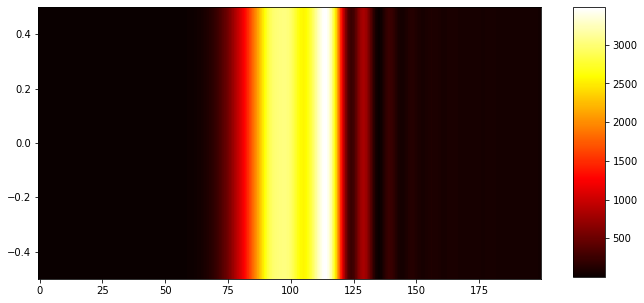

angle: 47.200000


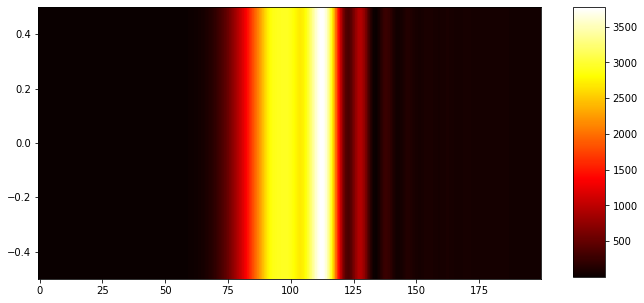

angle: 47.300000


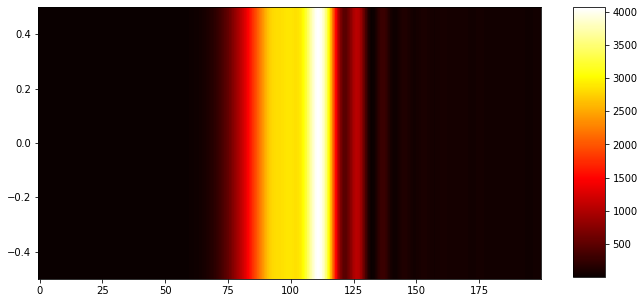

angle: 47.400000


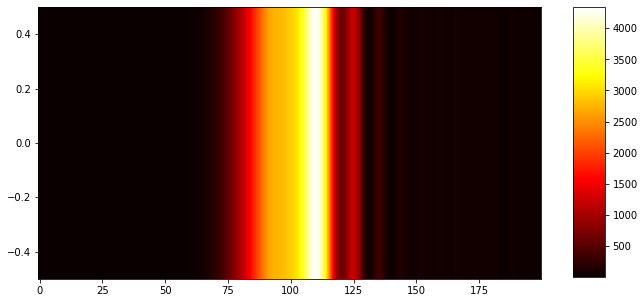

angle: 47.500000


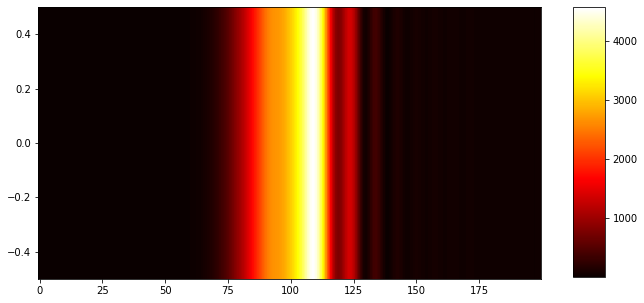

angle: 47.600000


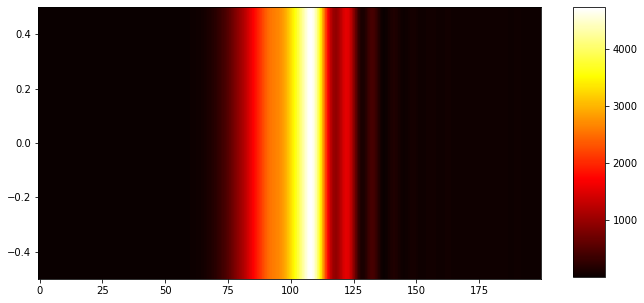

angle: 47.700000


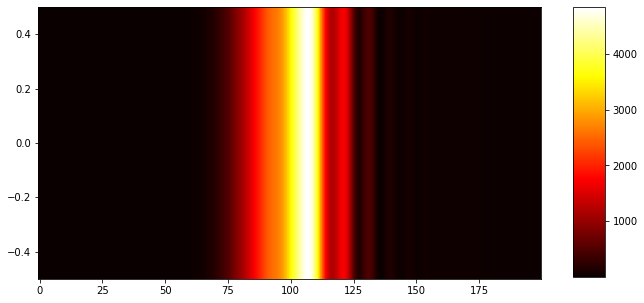

angle: 47.800000


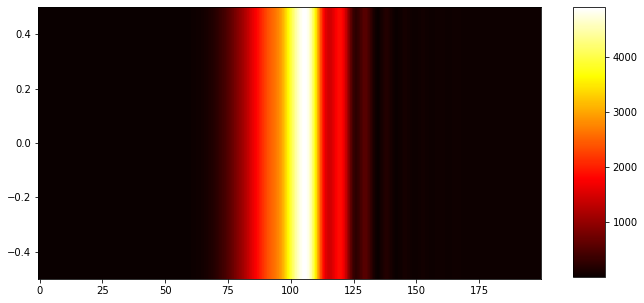

angle: 47.900000


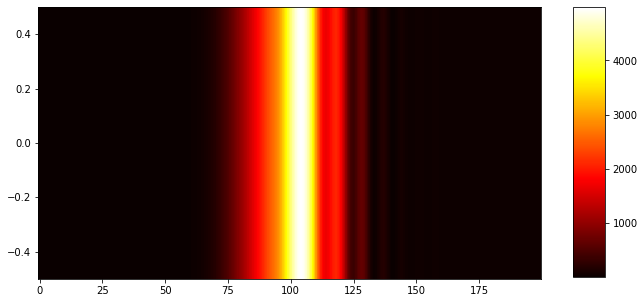

angle: 48.000000


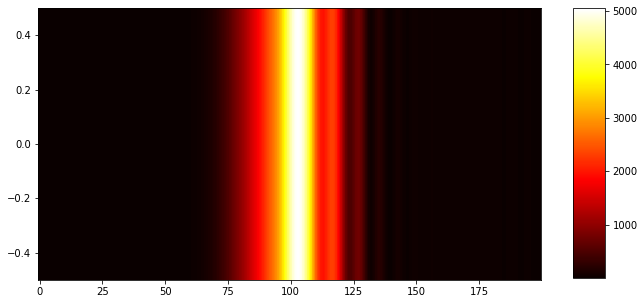

angle: 48.100000


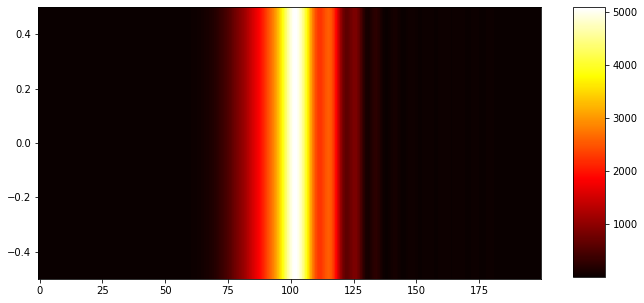

angle: 48.200000


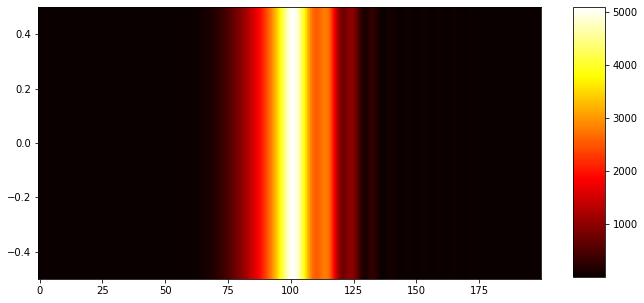

angle: 48.300000


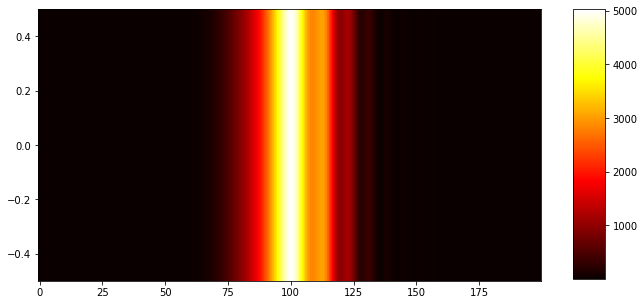

angle: 48.400000


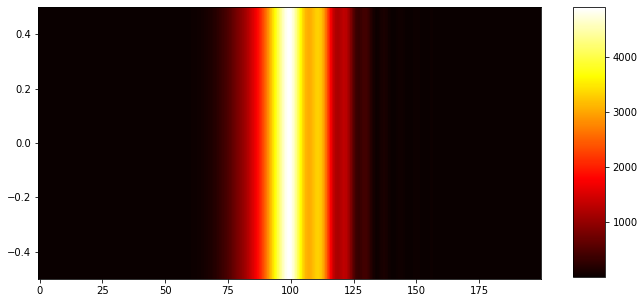

angle: 48.500000


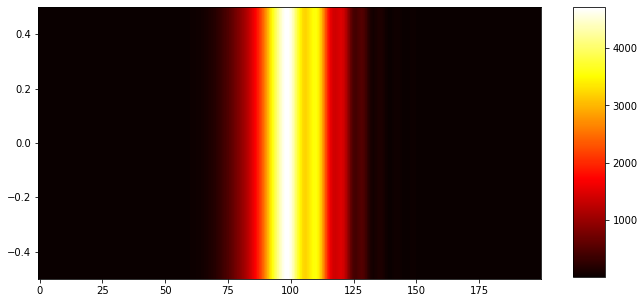

angle: 48.600000


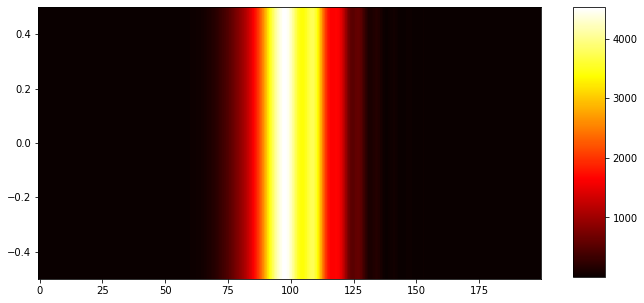

angle: 48.700000


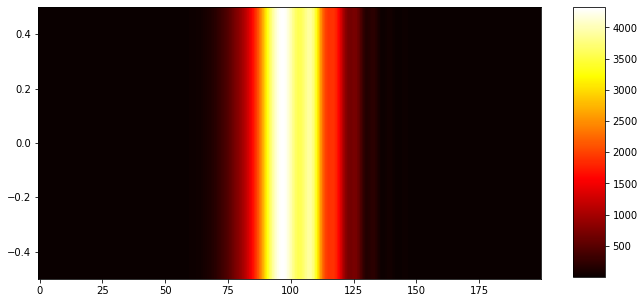

angle: 48.800000


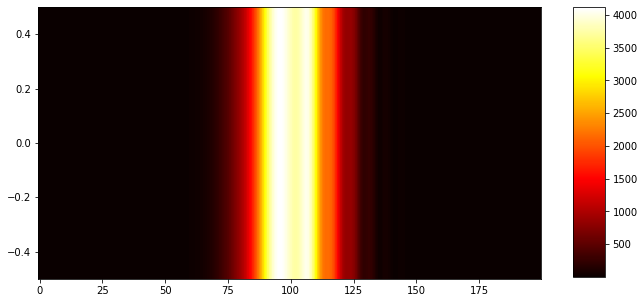

angle: 48.900000


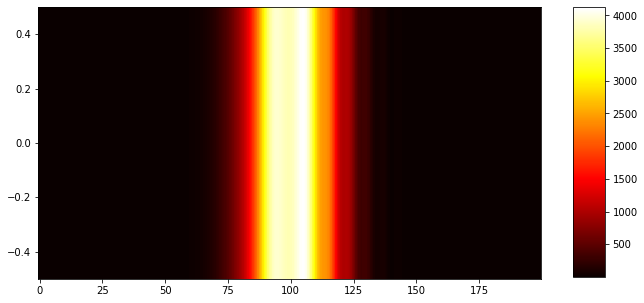

angle: 49.000000


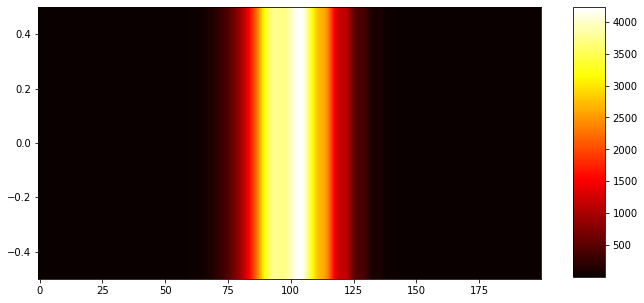

angle: 49.100000


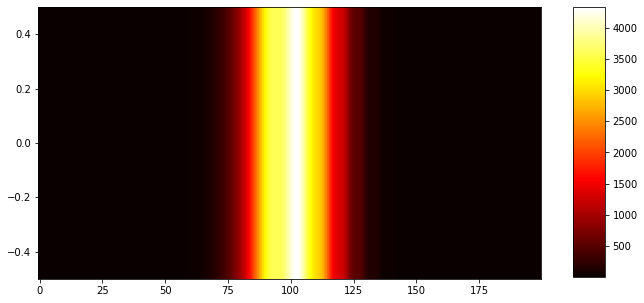

angle: 49.200000


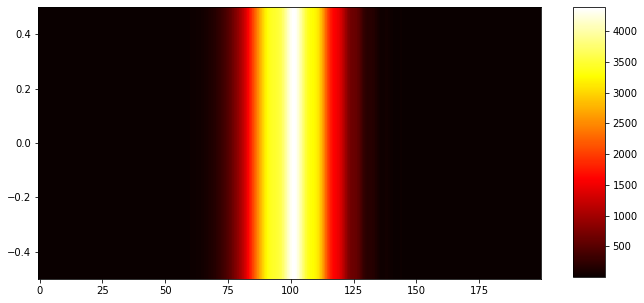

angle: 49.300000


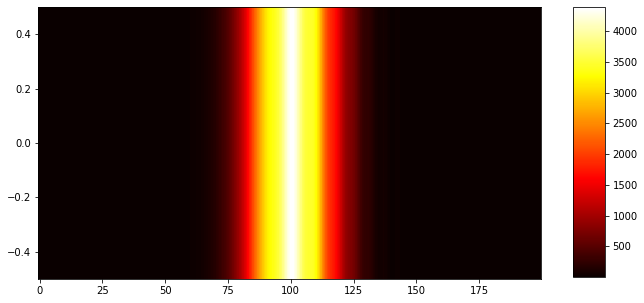

angle: 49.400000


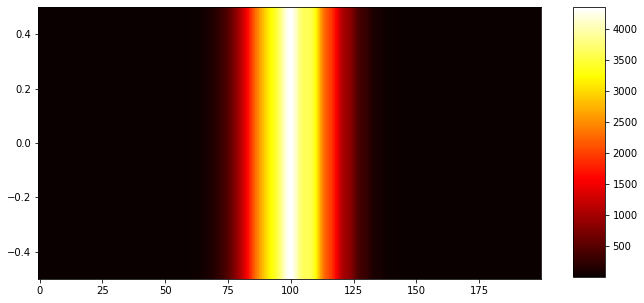

angle: 49.500000


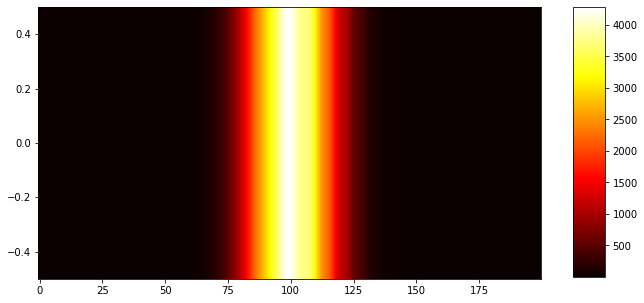

angle: 49.600000


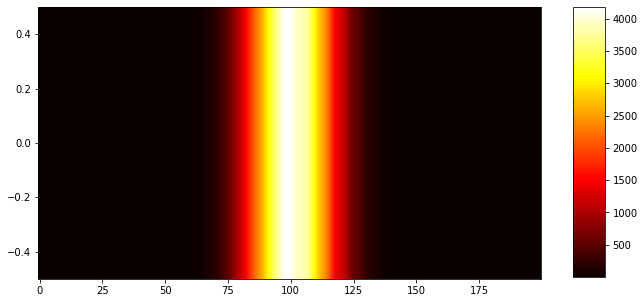

angle: 49.700000


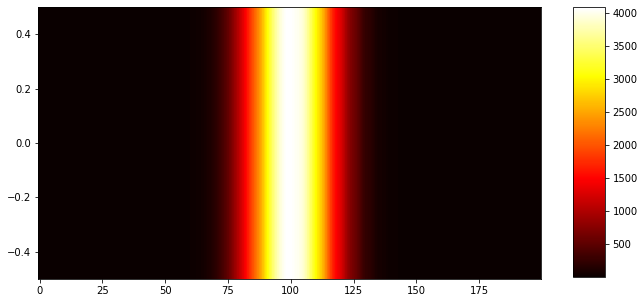

angle: 49.800000


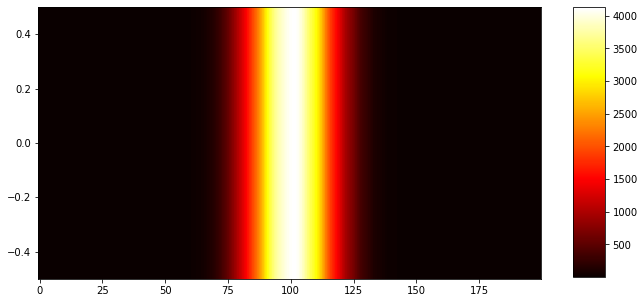

angle: 49.900000


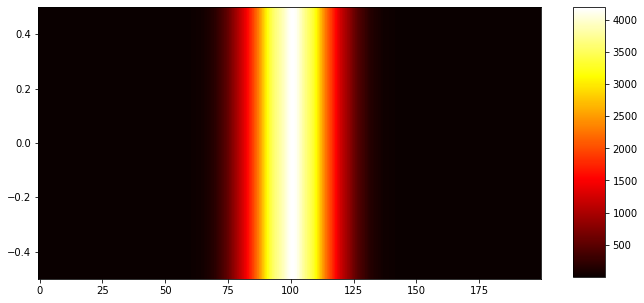

In [194]:
angle_range = np.arange(40, 50, 0.1)
R_gaus = []
for inc_an in angle_range:
    k_x = get_k_x(5)
    k_mkm = k / 1000000.
    k_z = k_mkm * np.cos(np.arcsin(k_x / k_mkm))
    s = S_k(5, k_x).reshape((-1, 1))
    k_matrix = np.vstack((k_x.reshape((1, -1)), k_z.reshape((1, -1))))
    angles = 180 / np.pi * np.arcsin(k_x / k_mkm) + inc_an
    R = vectorize_R(angles).reshape((-1, 1))
    s_r = s * R
    R_gaus.append(np.sum(abs(E_reflected_plane(s_r, inc_an)[0]) ** 2))


Теперь 300 нм:

### Распеределение интенсивности поля вдоль поверхности ФК

In [33]:
def get_rotation(angle):
    rot_matrix = np.empty((2, 2), dtype = np.complex)
    rot_matrix[0, 0] = cos(np.pi * angle / 180)
    rot_matrix[0, 1] = sin(np.pi * angle / 180)
    rot_matrix[1, 0] = sin(np.pi * angle / 180)
    rot_matrix[1, 1] = -cos(np.pi * angle / 180)
    return rot_matrix


In [27]:
%%time

plasmon_struct ={
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 300},  
    2: {'name': 'ФК', 'N' : 10,
        'n1': 1.45 + 0.00002j, 'd1': 204.,
        'n2': 2.07 + 0.00002j, 'd2': 143.},
    3: {'name': 'Среда', 'n': 1.52 + 0.j }
}

"""
plasmon_struct = {
    0: {'name': 'Среда', 'n': 1.5},
    1: {'name': 'Слой', 'n': 1. + 0.j, 'd': 300},  
    2: {'name': 'Слой', 'n': 0.23 + 4.35j, 'd': 50},
    3: {'name': 'Среда','n': 1.52 + 0.j}
}
"""

angles_range = np.arange(44., 48., 0.01)
X_range = np.arange(-5, 30, 1)
spot_range = np.arange(2.5, 9, 0.5)
E_slices = []
for w in spot_range:
    E_slices.append(cut_BSW_intesity(angles_range, X_range, plasmon_struct, w, plasmon_struct[1]['d'] / 1000, 0, polar="TE"))

CPU times: user 2min 48s, sys: 76.8 ms, total: 2min 49s
Wall time: 2min 48s


CPU times: user 11.6 s, sys: 3.87 ms, total: 11.6 s
Wall time: 11.6 s


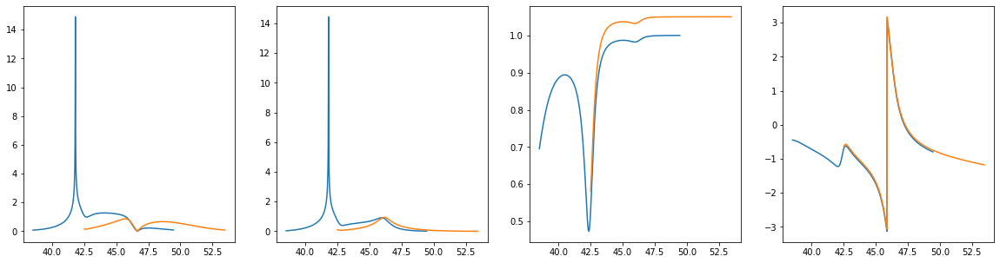

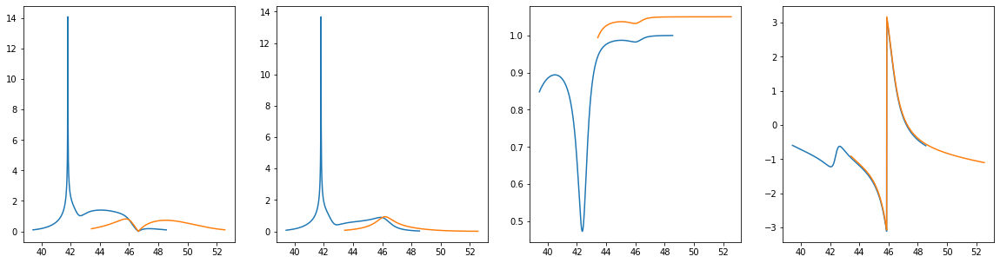

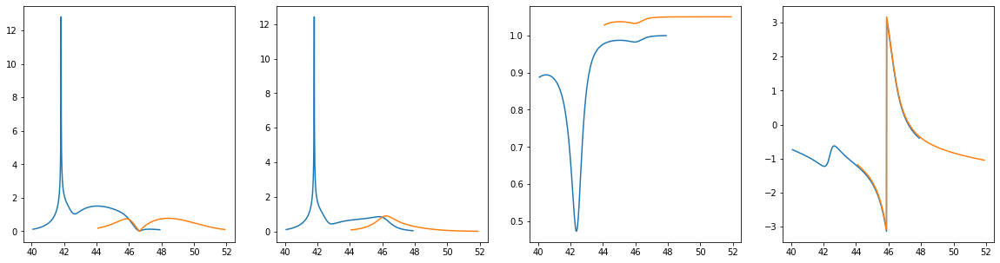

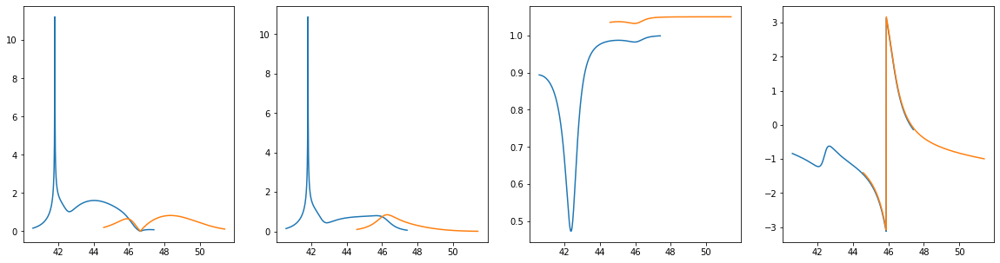

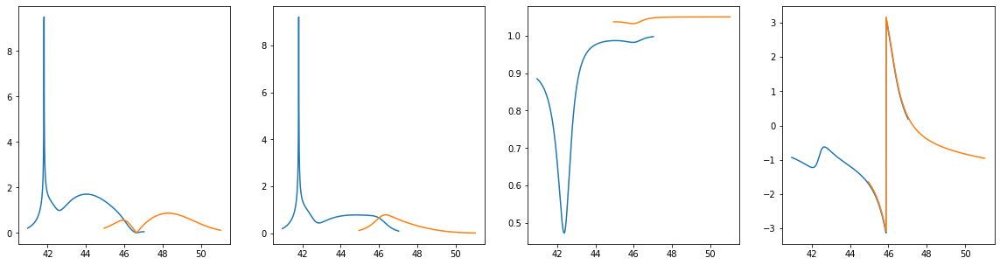

...

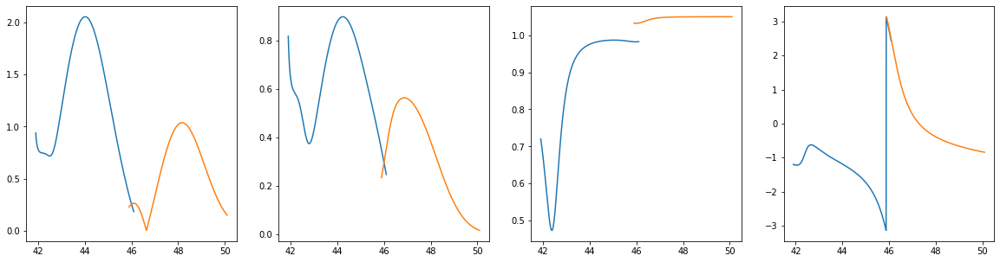

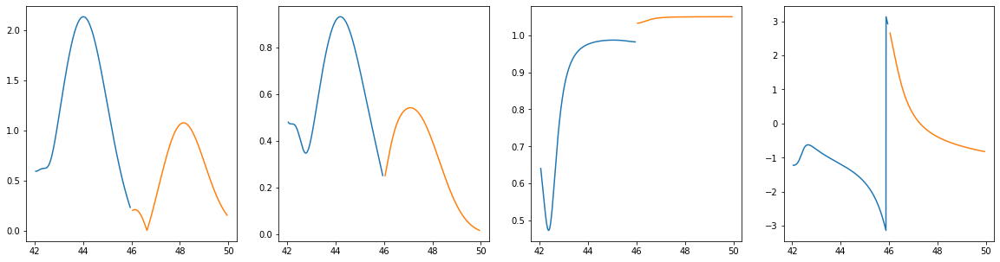

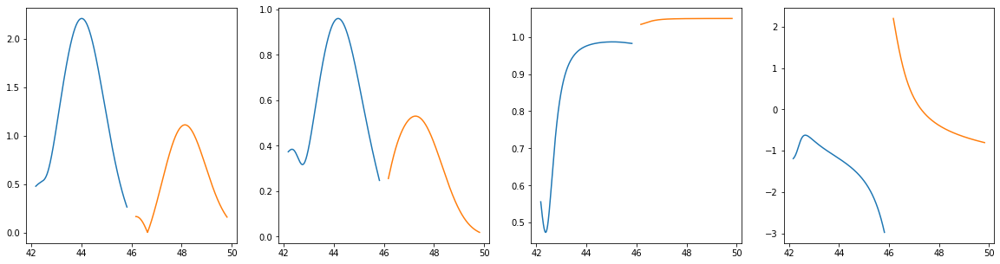

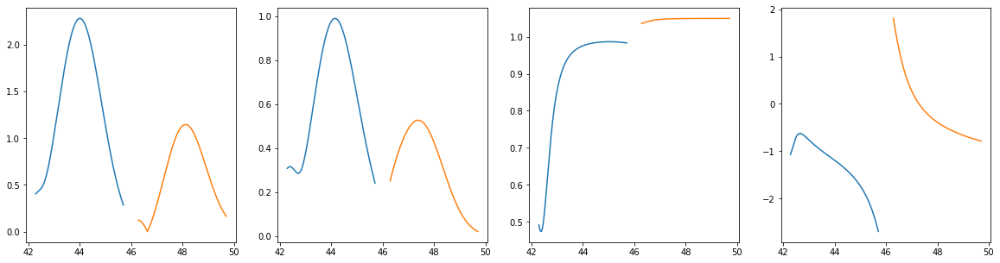

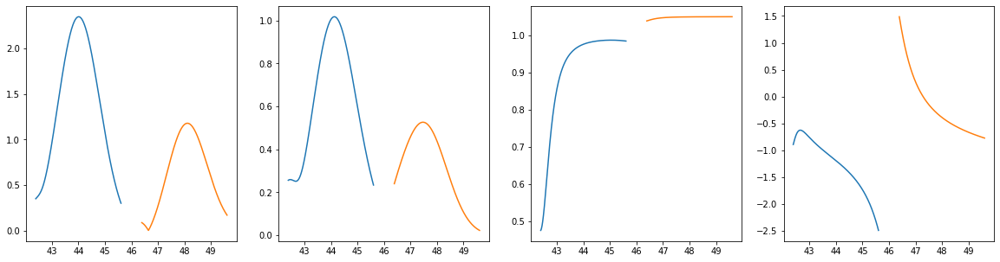

In [12]:
%%time
strus = {
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой',  'n': 1 + 0.j, 'd': 295},  
    2: {'name': 'ФК', 'N' : 10,
        'n1': 1.45 + 0.00002j, 'd1': 204.,
        'n2': 2.07 + 0.00002j, 'd2': 143.},
    3: {'name': 'Среда', 'n': 1.52 + 0.j }
}

angles_range = np.arange(44, 50, 0.5)
X_range = np.arange(-10, 30, 1)
spot_range = np.arange(2.5, 9, 0.5)
E_slices = []
for w in spot_range:
    E_slices.append(cut_BSW_intesity(angles_range, X_range, strus, w, strus[1]['d'] / 1000, 0,  "TE", 780., False))
#plot_2Dmap(E_bsw, [X_range.min(), X_range.max(), angles_range.min(), angles_range.max()])

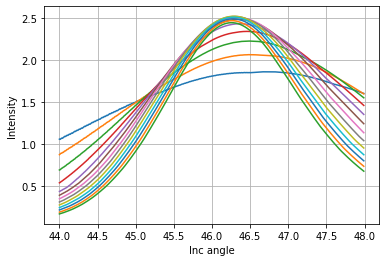

In [28]:
max_angles = []
x_max = []
max_int = []
for i in range(len(spot_range)):
    E_bsw = E_slices[i]
    res = get_max_angle(E_bsw, True, True)
    max_angles.append(res[0])
    x_max.append(res[1])
    max_int.append(res[2])

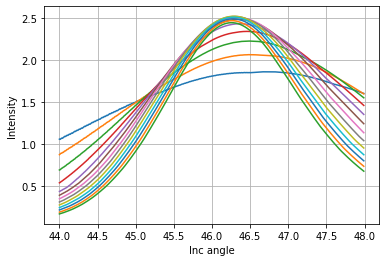

In [29]:
max_angles = []
x_max = []
max_int = []
for i in range(len(spot_range)):
    E_bsw = E_slices[i]
    res = get_max_angle(E_bsw, True, True)
    max_angles.append(res[0])
    x_max.append(res[1])
    max_int.append(res[2])

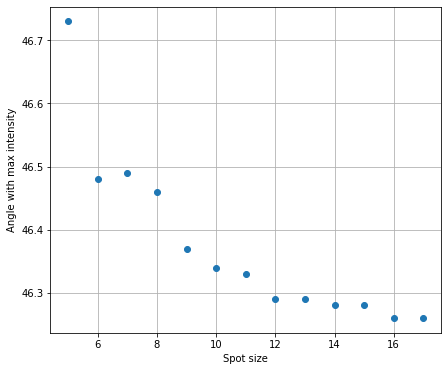

In [30]:
plt.figure(figsize=(7, 6))
plt.plot(2 * spot_range, max_angles, 'o')
plt.xlabel("Spot size")
plt.ylabel("Angle with max intensity")
plt.grid()

In [31]:
# Save angle(spot size) 
df=pd.DataFrame(list(zip(2 * spot_range, max_angles)), columns=['Spot size, mkm', 'Angle'])
df.info()
df.to_csv("angle_spot_300nm.csv")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Spot size, mkm  13 non-null     float64
 1   Angle           13 non-null     float64
dtypes: float64(2)
memory usage: 336.0 bytes


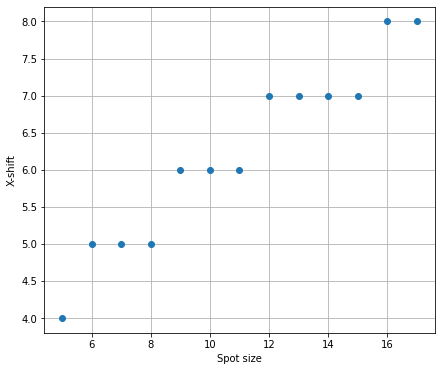

In [32]:
plt.figure(figsize=(7, 6))
plt.plot(2 * spot_range, x_max, 'o')
plt.xlabel("Spot size")
plt.ylabel("X-shift")
plt.grid()

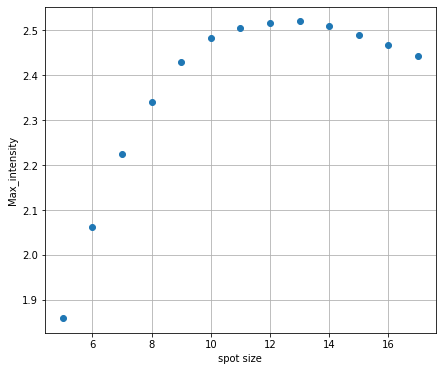

In [33]:
plt.figure(figsize=(7, 6))
plt.plot(2 * spot_range, max_int, 'o')
plt.ylabel("Max_intensity")
plt.xlabel("spot size")
plt.grid()

In [22]:
for i, E in enumerate(E_slices):
    max_params = get_max_angle(E, True)
    print("Spot size: ", 2 * spot_range[i], "angle: ", max_params[0], "shift: ", max_params[1])
    plot_2Dmap(E, [X_range.min(), X_range.max(), angles_range.min(), angles_range.max()])

NameError: name 'angles_range' is not defined

In [170]:
180 / np.pi * np.arcsin(1/ 1.5)

41.810314895778596

Spot size:  26.0 angle:  41.68 shift:  -5


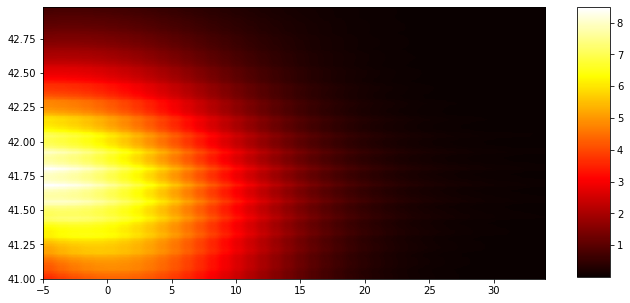

Spot size:  27.0 angle:  41.72 shift:  -5


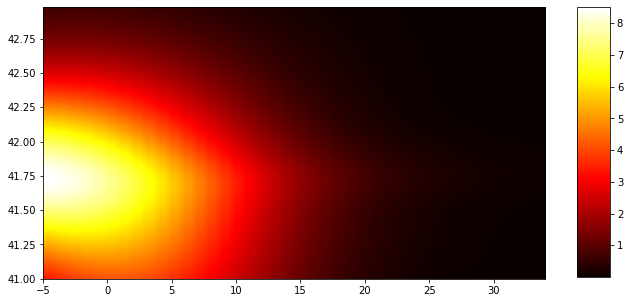

Spot size:  28.0 angle:  41.82 shift:  -5


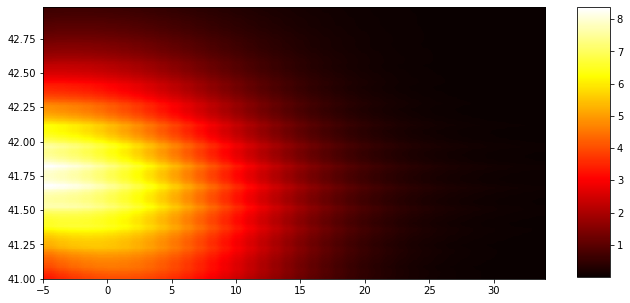

Spot size:  29.0 angle:  41.74 shift:  -5


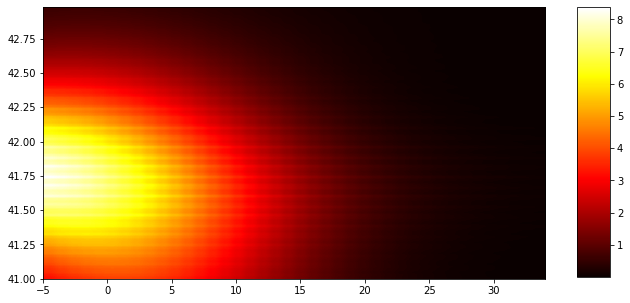

In [400]:
for i, E in enumerate(E_slices):
    max_params = get_max_angle(E, True)
    print("Spot size: ", 2 * spot_range[i], "angle: ", max_params[0], "shift: ", max_params[1])
    plot_2Dmap(E, [X_range.min(), X_range.max(), angles_range.min(), angles_range.max()])

## Интенсивность от d, $\alpha$, x

In [35]:
%%time
didic = {
    0: {
        'name': 'Среда',
        'n': 1.5 + 0.j
    },
    1: {
        'name': 'Слой',
        'n': 1 + 0.j,
        'd': 300
    },  
    2: {
        'name': 'ФК',
        'n1': 1.45 + 0.00002j,
        'd1': 204.,
        'n2': 2.07+0.00002j,
        'd2': 143.,
        'N' : 10
    },
    3: {
        'name': 'Среда',
        'n': 1.52 + 0.j
    }
}

angles_range = np.arange(45, 49.1, 0.1)
X_range = np.arange(-10, 60, 1)
gap_range = np.arange(200, 520, 20)

def I_x_a_d(angles_range, gap_range, didic, X_range, a, defocus, polar, wl):
    E_xad = []
    for air_gap in gap_range:
        didic[1]['d'] = air_gap
        E_xad.append(cut_BSW_intesity(angles_range, X_range, didic, a, didic[1]['d'] / 1000, defocus, polar, wl))
    return E_xad
#E_slice2 = I_x_a_d(angles_range, gap_range, didic, X_range, 5, -100)

CPU times: user 96 µs, sys: 0 ns, total: 96 µs
Wall time: 74.4 µs


$\alpha \in [45, 49]$ шаг 0.1,   
x $\in$ [-10, 60] мкм,  
d $\in$ [200, 500] нм, шаг  20 нм


In [36]:
def get_I_alpha_d(data, angles_range, gap_range):
    I_angle_gap_x = np.abs(data) ** 2
    I_max_gap_angle = np.empty((np.size(gap_range), np.size(angles_range)))
    for i, I_gap_slice in enumerate(I_angle_gap_x):
        I_max_gap_angle[i] = np.max(I_gap_slice, axis=1)
    info = "Gap_max: " + str(gap_range[np.argmax(I_max_gap_angle) // np.size(angles_range)]) + \
          " Angle_max: " + str(angles_range[np.argmax(I_max_gap_angle) % np.size(angles_range)])[0:6]
    return I_max_gap_angle, info

#### w = 7 мкм

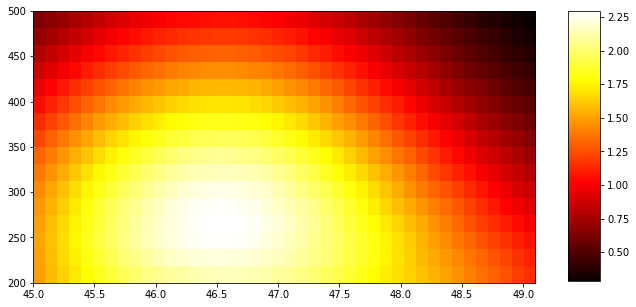

Gap_max:  260 Angle_max:  46.5


In [229]:
get_I_alpha_d()

#####  7 мкм с перефокусом 100 мкм

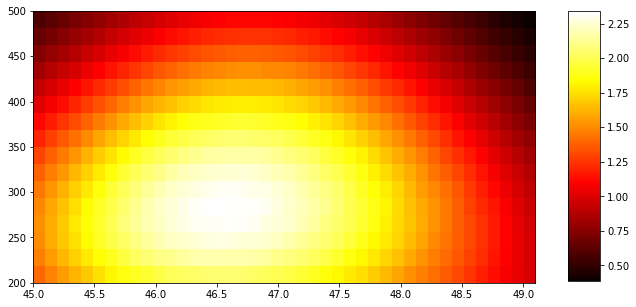

Gap_max:  280 Angle_max:  46.5


In [226]:
get_I_alpha_d()

#### w = 10 мкм

In [238]:
''' можно посмотреть как изменяется поле в волны при изменении зазора'''
#for i, E in enumerate(E_slice2):
#    print("gap: ", gap_range[i])
#    plot_2Dmap(E, [X_range.min(), X_range.max(), angles_range.min(), angles_range.max()])

' можно посмотреть как изменяется поле в волны при изменении зазора'

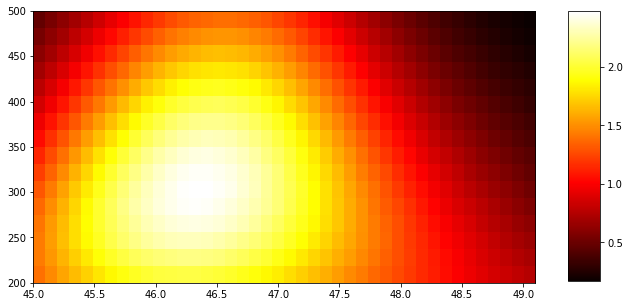

Gap_max:  300 Angle_max:  46.3


In [232]:
get_I_alpha_d()

##### 10 мкм с перефокусом 100 мкм

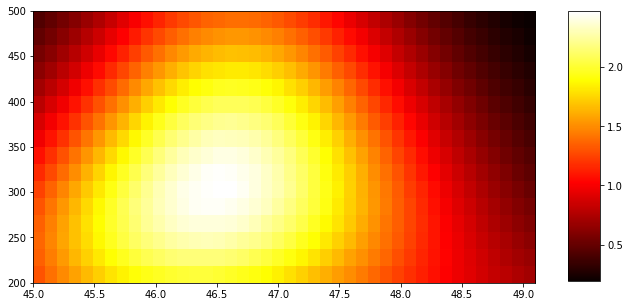

Gap_max:  300 Angle_max:  46.5


In [236]:
get_I_alpha_d()

##### 10 мкм с недофокусом 100 мкм 

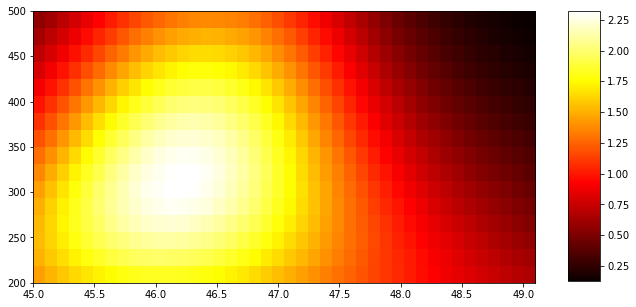

Gap_max:  300 Angle_max:  46.2


In [239]:
get_I_alpha_d()

##### w = 12 мкм

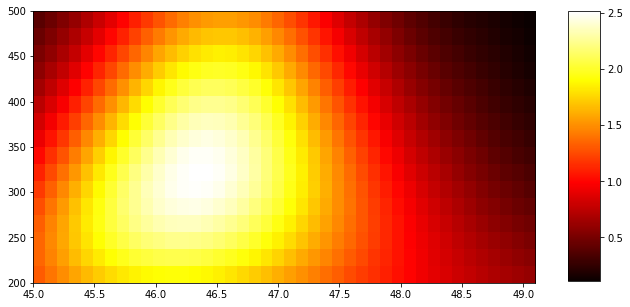

Gap_max:  320 Angle_max:  46.3


In [234]:
get_I_alpha_d()

[5.]
AA
AA


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

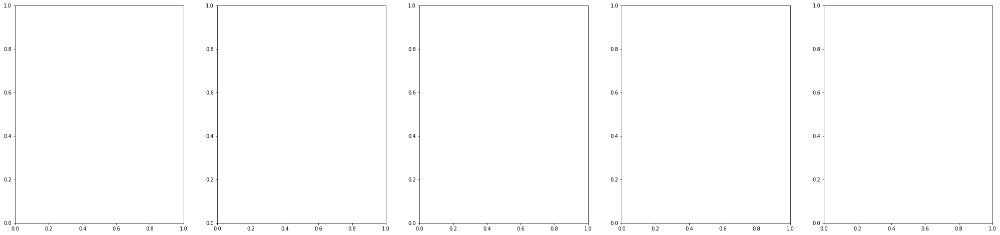

In [78]:
didic = {
    0: {
        'name': 'Среда',
        'n': 1.5 + 0.j
    },
    1: {
        'name': 'Слой',
        'n': 1 + 0.j,
        'd': 300
    },  
    2: {
        'name': 'ФК',
        'n1': 1.45 + 0.00002j,
        'd1': 204.,
        'n2': 2.07+0.00002j,  
        'd2': 143.,
        'N' : 10
    },
    3: {
        'name': 'Среда',
        'n': 1.52 + 0.j
    }
}

angles_range = np.arange(45, 49.1, 0.05)
X_range = np.arange(-5, 20, 1)
gap_range = np.arange(0, 1000, 10)
spots_range = np.arange(5, 5.1, 0.5)
print(spots_range)
defocus_range = np.array([0.])#np.arange(-100, 150, 50)
extent_h=[angles_range.min(), angles_range.max(), gap_range.min(), gap_range.max()]
fig, axs = plt.subplots(np.size(spots_range) // 5 + 1, 5, figsize=(7 * 5, 7 * np.size(spots_range) // 5 + 7))

dataset = []
print("AA")
for j, defoc in enumerate(defocus_range):
    for i, spt in enumerate(spots_range):
        print("AA")
        data = I_x_a_d(angles_range, gap_range, didic, X_range, spt, defoc, polar="TE", wl=780.)
        graph, label = get_I_alpha_d(data, angles_range, gap_range)
        label = label + " Defoc: " + str(defoc) + " w: " + str(2 * spt)[0:5]
        tmp = axs[i // 5, i % 5].imshow(graph, cmap=plt.cm.hot, origin='lower', aspect='auto', extent=extent_h)    
        dataset.append(graph)
        axs[i // 5, i % 5].set_title(label)
        plt.colorbar(tmp, ax=axs[i // 5, i % 5])
        print(j * np.size(spots_range) + i, "/", np.size(defocus_range) * np.size(spots_range))
fig.savefig("/home/arkhem/E_dist_gap_invest.png")

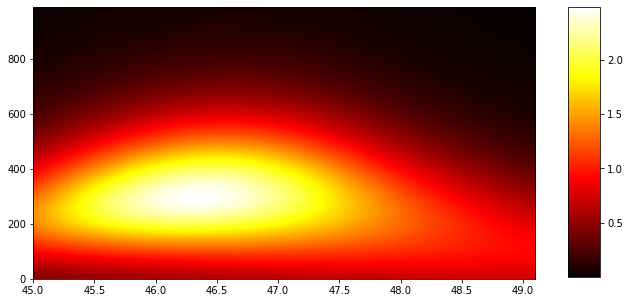

In [83]:
plot_2Dmap(graph, extent_h, isE=True)
df=pd.DataFrame(graph, columns=angles_range, index=gap_range)
df.to_csv("10mkm_gap_invest" + ".csv")

## Спектры E_f,b в воздушном зазоре:

In [ ]:
for k, dset in enumerate(dataset):
    df=pd.DataFrame(dset, columns=angles_range, index=gap_range)
    lblb = "w=" + str(2 * spots_range[k])
    df.to_csv(lblb + "gap_invest" + ".csv")

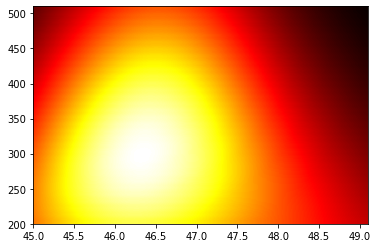

In [30]:
plt.imshow(dataset[5], cmap=plt.cm.hot, origin='lower', aspect='auto', extent=extent_h)


46.33999999999973 300


/home/arkhem/.conda/envs/python_env/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 7 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/arkhem/.conda/envs/python_env/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 7 missing from current font.
  font.set_text(s, 0, flags=flags)


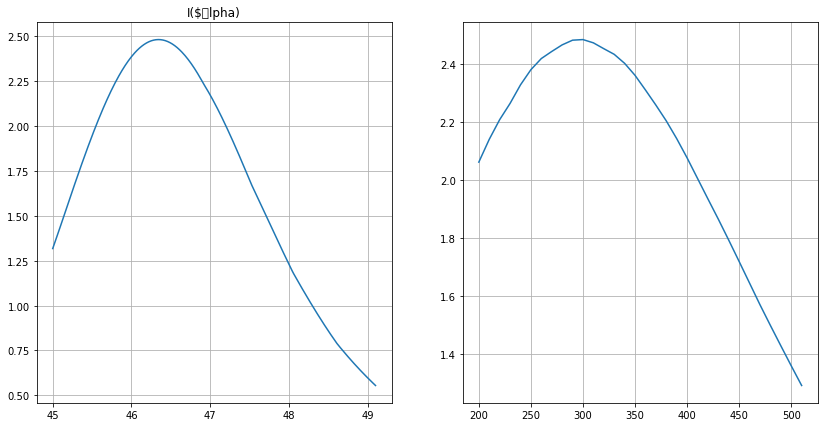

In [31]:
angle_index = np.argmax(dataset[5]) % np.size(angles_range)
gap_index = np.argmax(dataset[5]) // np.size(angles_range)
print(angles_range[angle_index], gap_range[gap_index])
fig, ax = plt.subplots(1, 2, figsize=(14, 7))
ax[0].plot(angles_range, dataset[5][gap_index])
ax[0].grid()
ax[0].set_title("I($\alpha)")
ax[1].plot(gap_range, dataset[5][:, angle_index])
ax[1].grid()


In [351]:
def decor(angles, wl, didic):
    return R_func(didic, wl, angles)
vectorize_R = np.vectorize(decor)

def get_air_E_fb(struct, k_x, a=5, alpha=45, gap=0.3, L=0):
    '''
    set default parameters range
    '''
    wl = 780.

    '''
    get comon variables
    '''
    k = 2 * np.pi * 1000000000 / wl * struct[0]['n'].real
    k_mkm = k / 1000000.
    k_mkm_gap = k_mkm / struct[0]['n'].real * struct[1]['n'].real
    s = S_k(a, k_x).reshape((-1, 1))

    angles = 180 / np.pi * np.arcsin(k_x / k_mkm) + alpha
    R = vectorize_R(angles, wl, struct).reshape((-1, 1))
    TMMs = generate_TMM(struct, angles)
    k_xz = get_K_xz_air(k_mkm, k_mkm_gap, angles)
    defocus_phase = get_defocus_phase(k_mkm, angles, L)
    E_plus, E_minus = E_air_spectrum(s, R, TMMs)
    E_plus = E_plus * defocus_phase
    E_minus = E_minus * defocus_phase
    return E_plus, E_minus, angles

In [352]:
def get_descr(x, y):
    return "min: " + str(x[np.argmin(y)])[:5] + " max: " + str(x[np.argmax(y)])[:5]

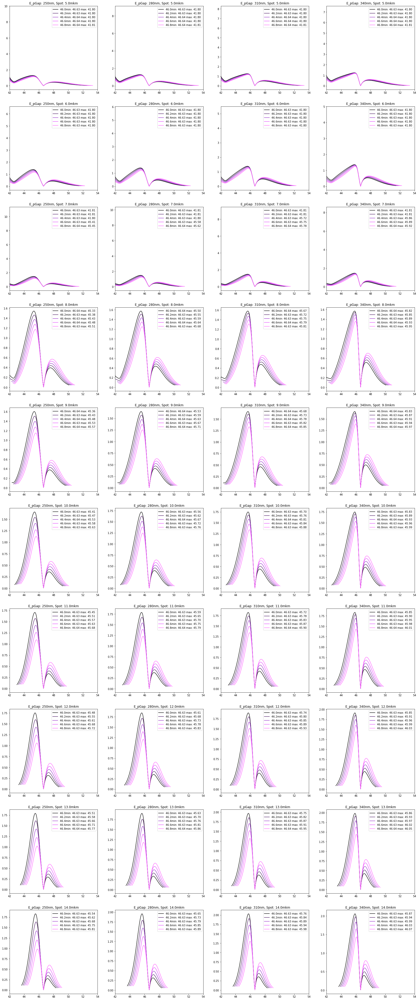

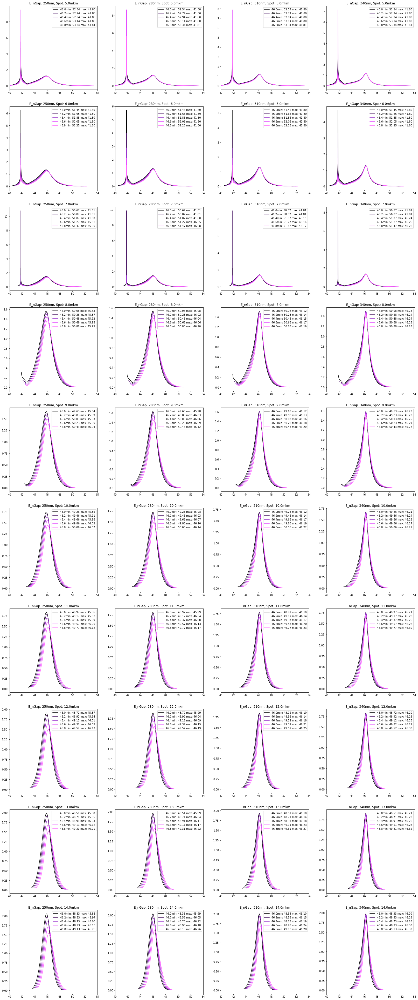

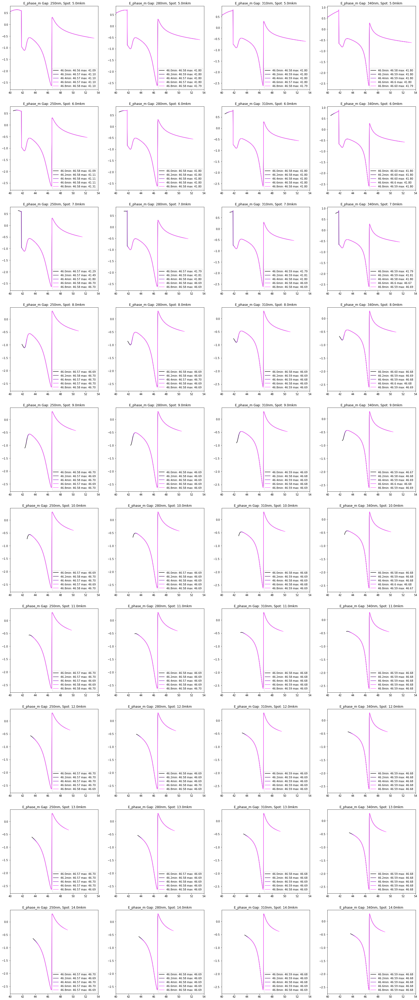

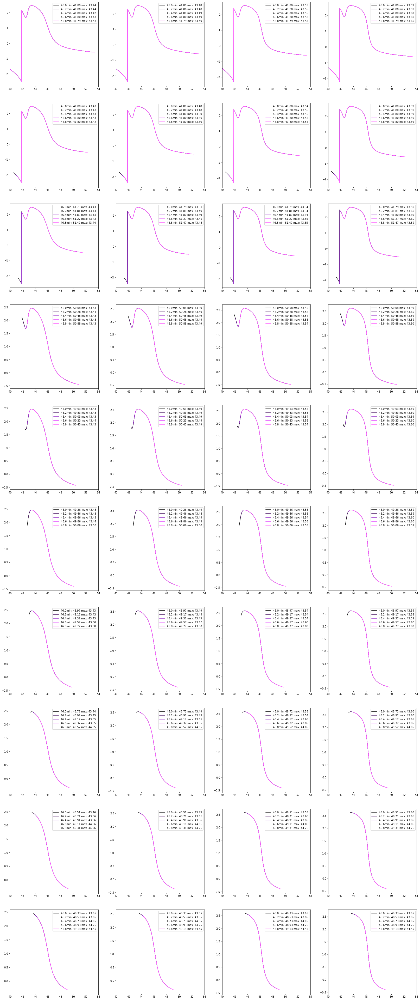

In [360]:
didic = {
    0: {
        'name': 'Среда',
        'n': 1.5 + 0.j
    },
    1: {
        'name': 'Слой',
        'n': 1 + 0.j,
        'd': 300
    },  
    2: {
        'name': 'ФК',
        'n1': 1.45 + 0.00002j,
        'd1': 204.,
        'n2': 2.07+0.00002j,
        'd2': 143.,
        'N' : 10
    },
    3: {
        'name': 'Среда',
        'n': 1.52 + 0.j
    }
}

thetas = np.arange(46, 47, 0.2)
air_gaps = np.arange(250, 350, 30)
spots = np.arange(2.5, 7.5, 0.5)
fig, axs = plt.subplots(np.size(spots), np.size(air_gaps), figsize=(7 * np.size(air_gaps), 7 * np.size(spots)))
fig1, axs1 = plt.subplots(np.size(spots), np.size(air_gaps), figsize=(7 * np.size(air_gaps), 7 * np.size(spots)))
fig2, axs2 = plt.subplots(np.size(spots), np.size(air_gaps), figsize=(7 * np.size(air_gaps), 7 * np.size(spots)))
fig3, axs3 = plt.subplots(np.size(spots), np.size(air_gaps), figsize=(7 * np.size(air_gaps), 7 * np.size(spots)))


for v, a in enumerate(spots):
    k_x = get_k_x(a=a, N_x=601, decr_times=20)
    for i, ag in enumerate(air_gaps):
        didic[1]['d'] = ag
        for j, th in enumerate(thetas):
            axs1[v, i].set_xlim([40, 54])
            axs2[v, i].set_xlim([40, 54])
            axs3[v, i].set_xlim([40, 54])
            axs[v, i].set_xlim([42, 54])
            E_p, E_m, a_x = get_air_E_fb(didic, k_x, a, th, didic[1]['d'])
            axs[v, i].plot(a_x, abs(E_p), c=[np.min([0.3 * j, 1]), 0.1 * j, np.min([0.4 * j, 1])],
                           label=str(th) + get_descr(a_x, abs(E_p)))
            axs1[v, i].plot(a_x, abs(E_m), c=[np.min([0.3 * j, 1]), 0.1 * j, np.min([0.4 * j, 1])],
                            label=str(th) + get_descr(a_x, abs(E_m)))
            
            axs2[v, i].plot(a_x, np.angle(E_p), c=[np.min([0.3 * j, 1]), 0.1 * j, np.min([0.4 * j, 1])],
                              label=str(th) + get_descr(a_x, np.angle(E_p)))
            axs3[v, i].plot(a_x, np.angle(E_m), c=[np.min([0.3 * j, 1]), 0.1 * j, np.min([0.4 * j, 1])],
                              label=str(th) + get_descr(a_x, np.angle(E_m)))
            
            make_title = "Gap: " + str(ag) + "nm, Spot: " + str(2 * a) + "mkm"
            axs[v, i].set_title("E_p" + make_title)
            axs1[v, i].set_title("E_n" + make_title)
            axs2[v, i].set_title("E_phase_p " + make_title)
            axs2[v, i].set_title("E_phase_m " + make_title)

            axs[v, i].legend()
            axs1[v, i].legend()
            axs2[v, i].legend()
            axs3[v, i].legend()

fig.savefig("/home/kwillum/E_plus_gap_spot.png")
fig1.savefig("/home/kwillum/E_minus_gap_spot.png")
fig2.savefig("/home/kwillum/E_phase_p_gap_spot.png")
fig3.savefig("/home/kwillum/E_phase_m_gap_spot.png")

#плюс  значит, что движется от призмы к фк

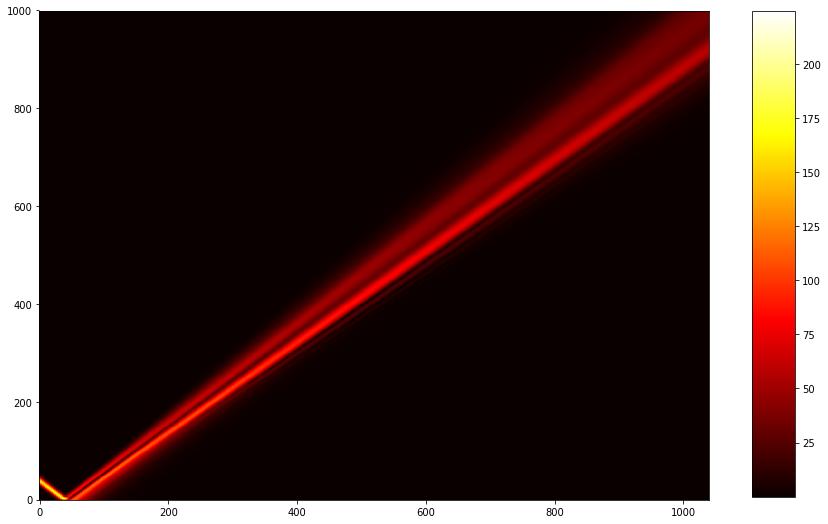

In [173]:
plt.figure(figsize=(12, 9))
plt.imshow(abs(E), cmap=plt.cm.hot, origin='lower', aspect='auto')    
#plt.xlim(46.6, 46.9)
cax = plt.axes([0.95, 0.13, 0.05, 0.75])
plt.colorbar(cax=cax)
plt.show()

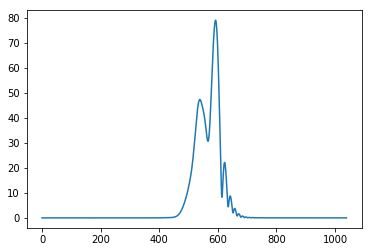

In [183]:
plt.plot(abs(E[500]))


In [176]:
fram = pd.DataFrame(data=abs(E))
fram.to_csv(r'c:\data\Gauss_5mcm_45.9_1040x1000.txt', header=None, index=None)

In [204]:
data = pd.read_csv("c:\data\Gauss_10mcm_45.9_1040x1000.txt", header=None)
plt.figure(figsize=(12, 9))
plt.imshow(data, cmap=plt.cm.hot, origin='lower', aspect='auto')    
#plt.xlim(46.6, 46.9)
cax = plt.axes([0.95, 0.13, 0.05, 0.75])
plt.colorbar(cax=cax)
plt.show()

#### Плазмоны

Золото 100 nm: 0.12 + 4.92 j\
Серебро: 0.14 + 4.88 j\
Никель:  2.17 + 4.82 j

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import itertools
from tmm_utils import *
from numba import njit

Gold:

In [2]:
n_arr = np.array(
    [1.33 + 1.25j,     1.3075 + 1.4517j, 1.3300 + 1.6403j, 1.4224 + 1.8403j, 1.5258 + 1.8878j, 1.5151 + 1.8918j,
     1.4928 + 1.8678j, 1.4696 + 1.9148j, 1.4684 + 1.9530j, 1.4532 + 1.9512j, 1.3831 + 1.9155j, 1.2703 + 1.8466j,
     0.9711 + 1.8737j, 0.5919 + 2.1364j, 0.4242 + 2.4721j, 0.3197 + 2.7765j, 0.2487 + 3.0740j, 0.1966 + 3.3536j,
     0.1556 + 3.6024j, 0.1366 + 3.8368j, 0.1310 + 4.0624j, 0.23 + 6.47j],
            dtype=np.complex)
l_arr = np.array(
    [200., 225., 250., 275., 300., 325.,
     350., 375., 400., 425., 450., 475.,
     500., 525., 550., 575., 600., 625.,
     650., 675., 700., 1000.]
)


Silver:

In [3]:
l_ag_arr = np.array(
    [342.5,   354.2,   367.9,   381.5,   397.4,   413.3,   430.5,   450.9,   471.4,
     495.9,   520.9,   548.6,   582.1,   616.8,   659.5,   704.5,   756.,    821.1,
     892.,    984.,   1088.,   1216.,   1393.,   1610.,   1937. ])
n_ag_arr= np.array(
         [0.14 +1.142j,  0.10 +1.419j,  0.07 +1.657j,  0.05 +1.864j,  0.05 +2.07j  ,
          0.05 +2.275j,  0.04 +2.462j,  0.04 +2.657j,  0.05 +2.869j,  0.05 +3.093j ,
          0.05 +3.324j,  0.06 +3.586j,  0.05 +3.858j,  0.06 +4.152j,  0.05 +4.483j ,
          0.04 +4.838j,  0.03 +5.242j,  0.04 +5.727j,  0.04 +6.312j,  0.04 +6.992j ,
          0.04 +7.795j,  0.09 +8.828j,  0.13 +10.1j ,  0.15 +11.85j,  0.24 +14.08j],  dtype=np.complex)

def decor1(angles, wl, struct, polar):\
return R_func(struct, wl, angles, polar)

In [4]:
min_pos = np.empty(np.size(np.arange(0, 10, 1)))
min_pos.size

10

In [149]:
def modern_struct(n, d=50, d_diel=100.):
    plasmon_struct = {
#         0: {'name': 'Среда', 'n': 1.5 + 0.j},
#         1: {'name': 'Слой',  'n': n, 'd': d},
#         2: {'name': 'Слой',  'n': 1.41 + 0.j, 'd': d_diel},
#         3: {'name': 'Среда', 'n': 1. + 0.j}
          0: {'name': 'Среда', 'n': 1.6 + 0.j},
          1: {'name': 'Слой',  'n': n, 'd': d},
          2: {'name': 'Слой',  'n': 1.535 + 0.00001j, 'd': d_diel},
          3: {'name': 'Среда', 'n': 1. + 0.j}
                        }
    return plasmon_struct

In [154]:
def plasmon_Kretchman(n_arr, l_arr, angles, d_diel=180., d_met=50):
    min_pos = np.empty(l_arr.size)
    for i in range(l_arr.size):
        n_Au = n_arr[i]
        plasmon_struct = modern_struct(n_Au, d=d_met, d_diel=d_diel)
        vectorize_R = np.vectorize(decor1)
        res = vectorize_R(angles, l_arr[i], plasmon_struct, 'TM')
        min_pos[i] = angles[np.argmin(np.abs(res))]
    n_eff = plasmon_struct[0]['n'].real * np.sin(min_pos * np.pi / 180.)
    return [angles, abs(res)], [angles, np.angle(res)], [l_arr, n_eff]

def draw_figs(*args):
    fig, ax1 = plt.subplots(1, len(args[0]), figsize=(5 * len(args[0]), 5))
   
    ax1[0].plot(args[0][0][0], args[0][0][1])
    ax1[0].set_xlabel("angle")
    ax1[0].set_ylabel("argR")
    #ax1[0].legend()

    ax1[1].plot(args[0][1][0], args[0][1][1])
    ax1[1].set_xlabel("angle")
    ax1[1].set_ylabel("|R|")
    ax1[1].set_title(" Кречман")
    #ax1[1].legend()
    ax1[2].plot(args[0][2][0], args[0][2][1], 'o')
    print(args[0][0][0][np.argmin(args[0][0][1])])
    

plasmon_Kretchman(n_arr, l_arr)

81.9383876775355
81.9383876775355
81.9383876775355
81.9383876775355
81.9383876775355
81.92838567713542
81.92838567713542


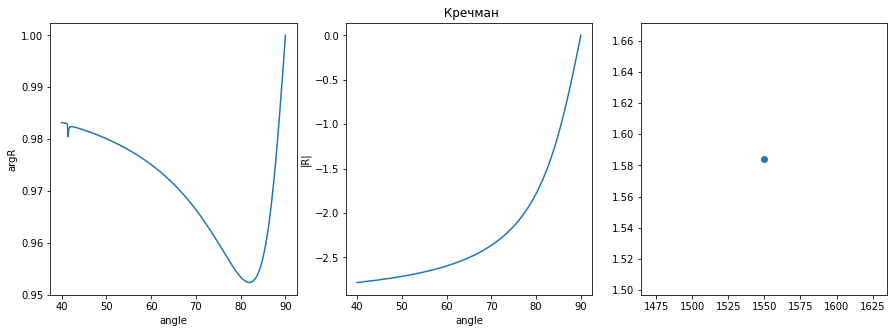

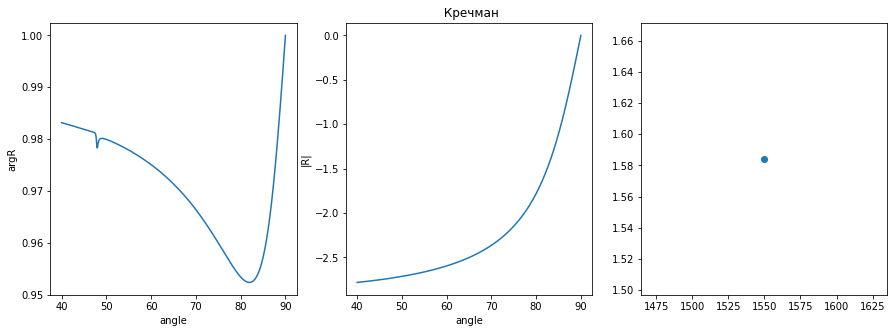

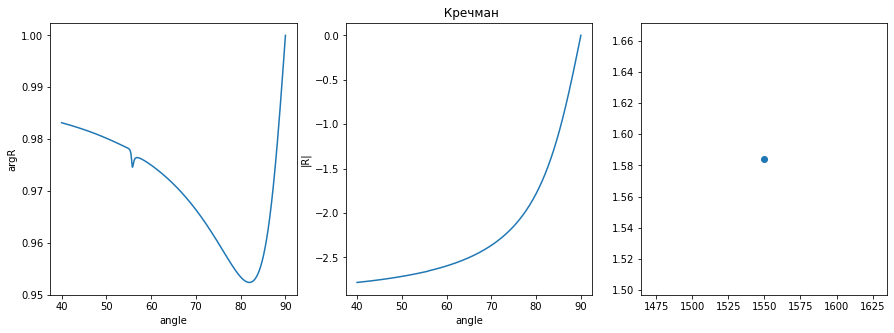

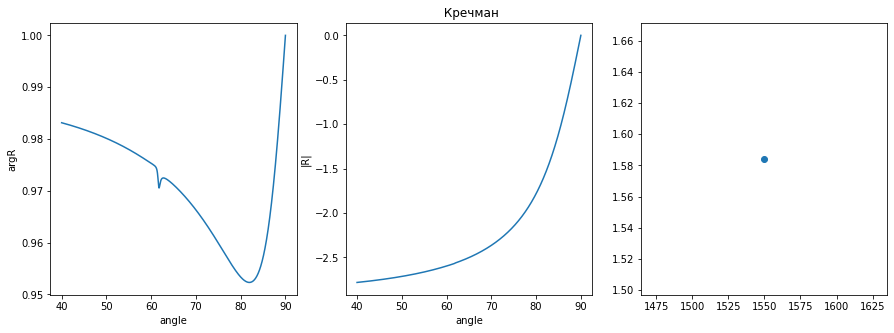

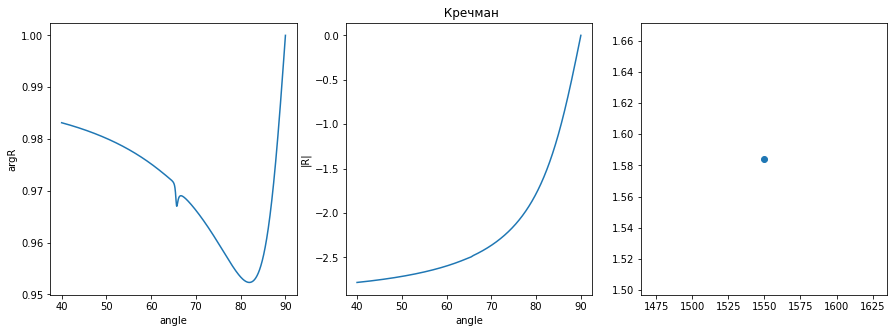

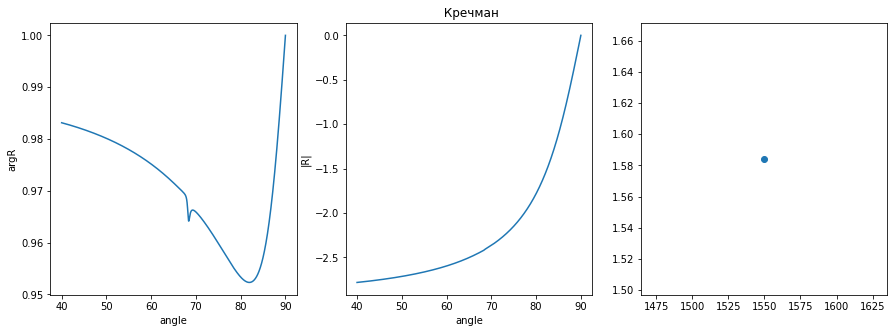

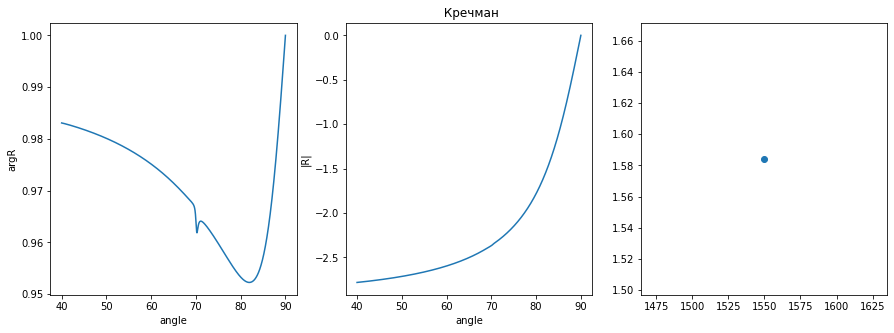

In [155]:
wg_height = np.arange(100, 800, 100)
angles = np.linspace(40, 90, 5000)
for i, wg_h in enumerate(wg_height):
    draw_figs(plasmon_Kretchman(np.array([0.55 + 11.5j], dtype=np.complex), np.array([1550.], dtype=np.float), angles, d_diel=wg_h, d_met=100.))

In [ ]:
wg_height = np.arange(40, 70, 10)
cut_l = 16
cut_r = 17
data_arr = np.empty((np.size(wg_height), np.size(l_ag_arr[cut_l:cut_r:])))
angles = np.linspace(40, 90, 50000)
for i, wg_h in enumerate(wg_height):
    draw_figs(plasmon_Kretchman(n_ag_arr[cut_l:cut_r:], l_ag_arr[cut_l:cut_r:], angles, d_diel=wg_h, d_met=50.))

60нм - волновод, выбрана, чтобы примерно соответствовать 1,1 по n_eff. При n_wg < n_prism существует второй угол полного внутреннего. Оптимальные параметры: провал до нуля в отто при 560. По полю на поверхности волновода оптимальное 400 нм зазора угол примерно 48,1



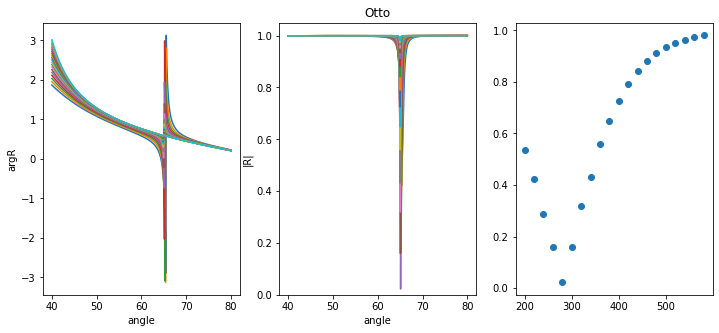

In [55]:
wl_Ag = 548.6
n_Ag  = 0.06 +3.586j

wl_Ag=756
n_Ag=0.03 +5.242j


# wl_Ag=616.8
# n_Ag=0.06 +4.152j



plasmon_struct = {
    0: {'name': 'Среда', 'n': 1.5},
    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 500.},
    2: {'name': 'Слой',  'n': 1.41 + 0.j, 'd': 180.},
    3: {'name': 'Среда',  'n': n_Ag}
}

fig, ax1 = plt.subplots(1, 3, figsize=(12, 5))
res_min = []
gaps_ranges = np.arange(200, 600, 20)
for gap in gaps_ranges:
    angles = np.linspace(40, 80, 1000)
    plasmon_struct[1]['d'] = gap
    res = vectorize_R(angles, wl_Ag, plasmon_struct, "TM")
    ax1[0].plot(angles, np.angle(res))
    minind = np.argmin(abs(res))
#     minl = np.max(abs(res)[:minind]) - (1 - np.min(abs(res))) / np.e
#     print(minl, angles[angles < minl][0])
    ax1[1].plot(angles, abs(res), label=str(gap) + "  " + str(angles[np.argmin(abs(res))]))
    res_min.append(np.min(np.abs(res)))
    
ax1[1].set_ylim(bottom=0)
ax1[0].set_xlabel("angle")
ax1[0].set_ylabel("argR")
ax1[1].set_xlabel("angle")
ax1[1].set_ylabel("|R|")
ax1[1].set_title("Otto")
#ax1[1].legend()

ax1[2].plot(gaps_ranges, res_min, 'o')

### Плазмоны по полю на поверхности металла.

In [15]:
%%time
# plasmon_struct = {
#     0: {'name': 'Среда', 'n': 1.5},
#     1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 280.},  
#     2: {'name': 'Слой',  'n': n_Ag,     'd': 50.},
#     3: {'name': 'Среда', 'n': 1.52 + 0.j}
# }

# plasmon_struct = {
#     0: {'name': 'Среда', 'n': 1.5},
#     1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 390.},
#     2: {'name': 'Слой',  'n': 1.41 + 0.j, 'd': 60.},
#     3: {'name': 'Слой',  'n': n_Ag,     'd': 50.},
#     4: {'name': 'Среда', 'n': 1.52 + 0.j}
# }

plasmon_struct = {
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 295},  
    2: {'name': 'ФК', 'N' : 10,
        'n1': 1.45 + 0.00002j, 'd1': 204.,
        'n2': 2.07 + 0.00002j, 'd2': 143.},
    3: {'name': 'Среда', 'n': 1.52 + 0.j }
}


angles_range = np.arange(44, 45., 0.1)
X_range = np.arange(-5, 40, 0.5)
spot_range = np.arange(1.5, 6.5, 0.25)
E_slices = []
gap_range = np.arange(0, 600, 20)
for i, gap in enumerate(gap_range):
    plasmon_struct[1]['d'] = gap
    tmps = cut_BSW_intesity(angles_range, X_range, plasmon_struct, 5., 
                                     plasmon_struct[1]['d'] / 1000, 0, polar="TE", wl=780., plasmon=False)
    all_tmp = np.empty(np.shape(tmps))
    for i in range(np.shape(tmps)[0]):
        all_tmp[i] = np.sqrt(np.sin(angles_range[i] * np.pi / 180.)) * tmps[i]
    E_slices.append(all_tmp)

/home/kwillum/.local/lib/python3.6/site-packages/ipykernel_launcher.py:37: ComplexWarning: Casting complex values to real discards the imaginary part


CPU times: user 16 s, sys: 4.13 ms, total: 16 s
Wall time: 16 s


0


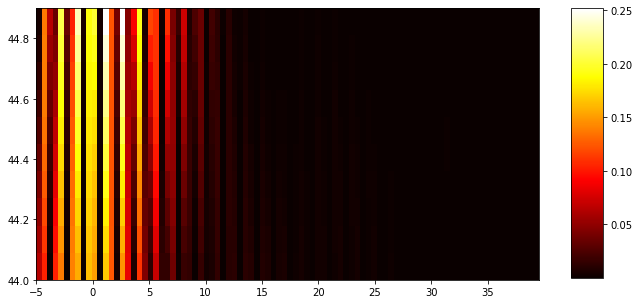

20


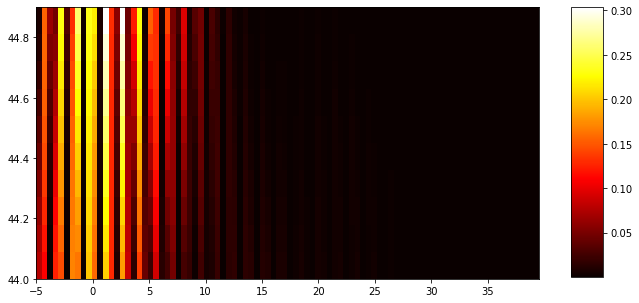

40


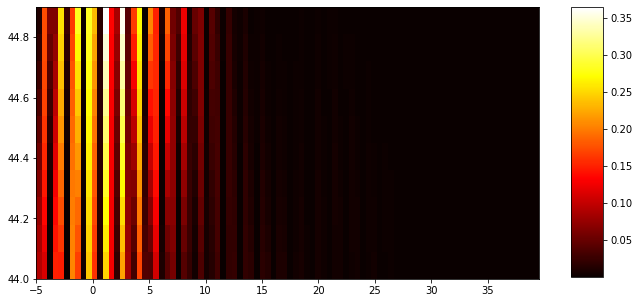

60


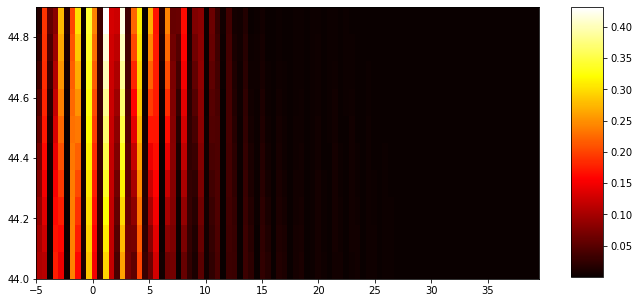

80


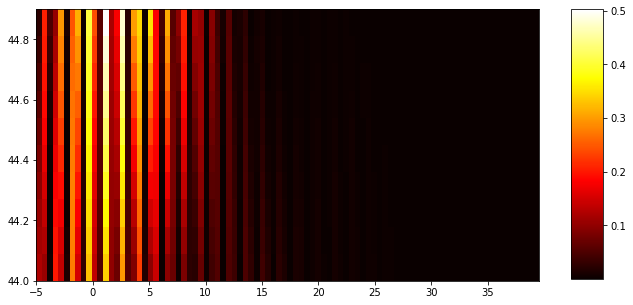

100


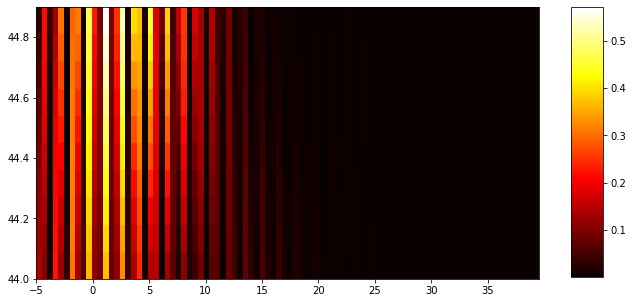

120


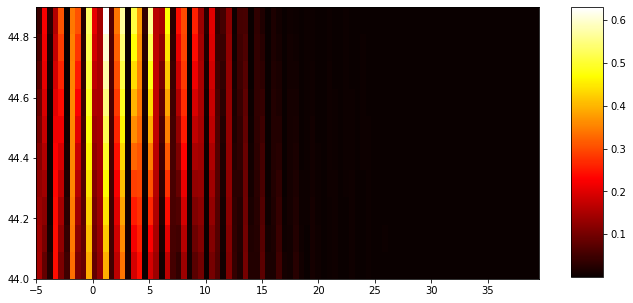

140


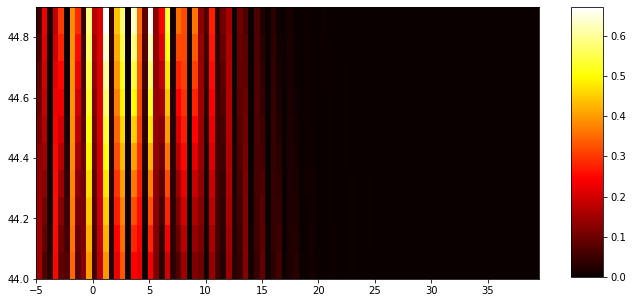

160


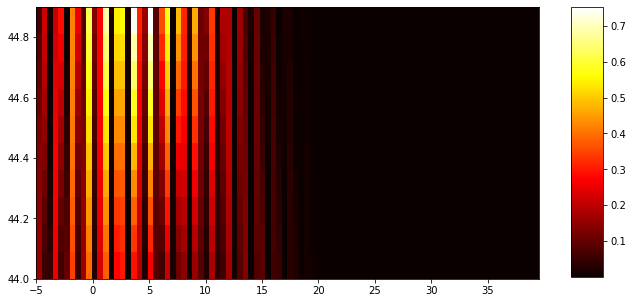

180


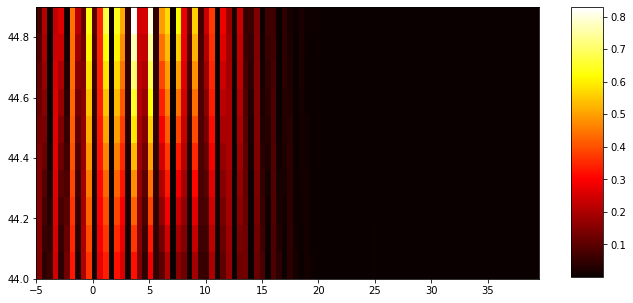

200


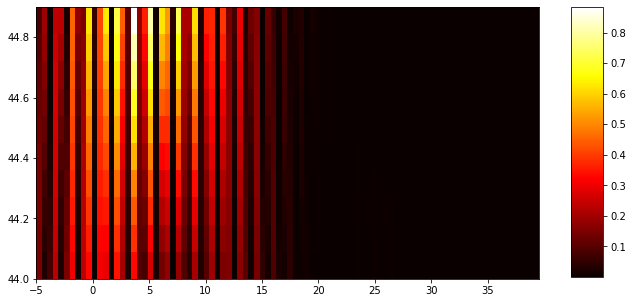

220


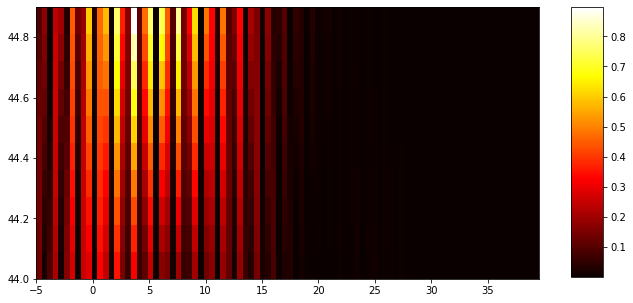

240


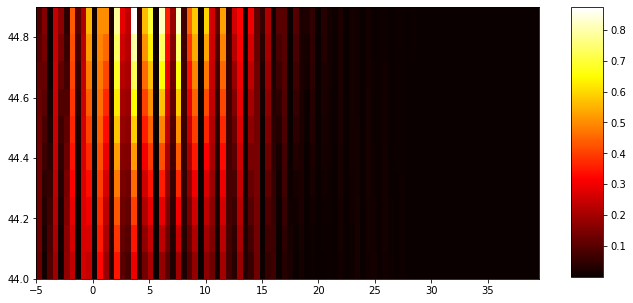

260


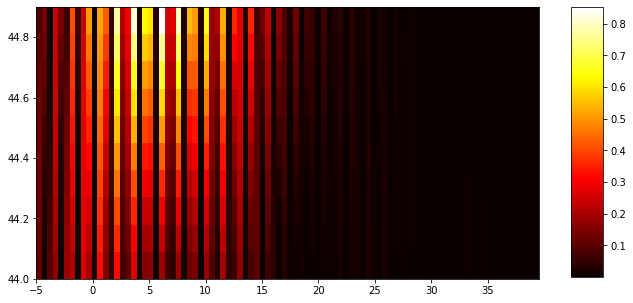

280


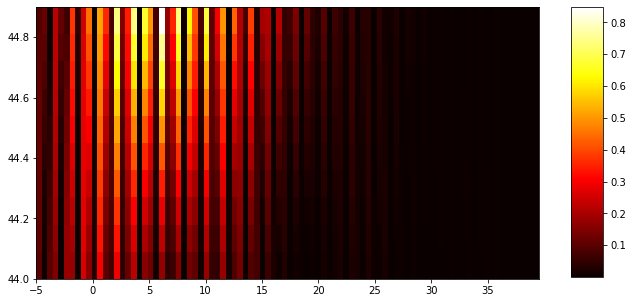

300


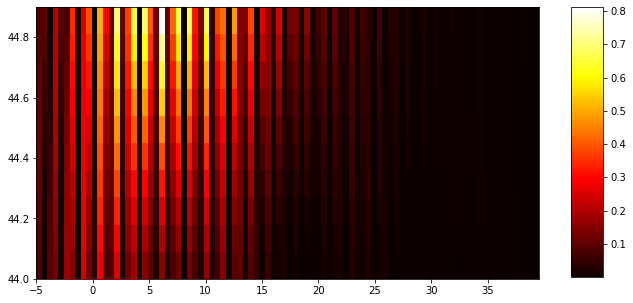

320


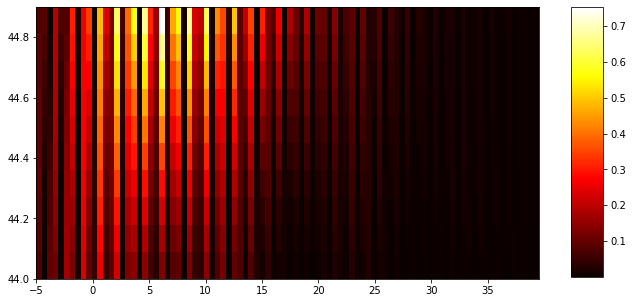

340


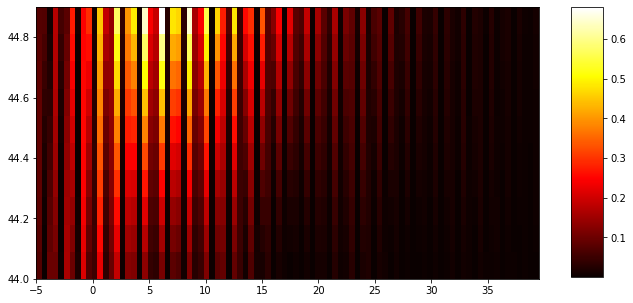

360


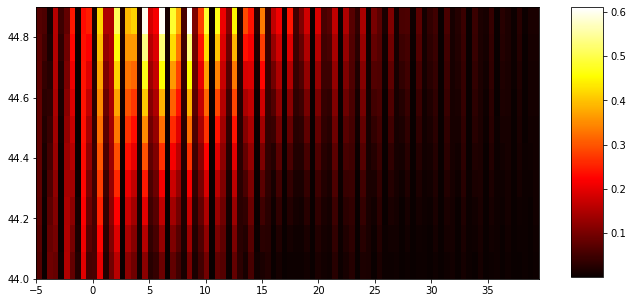

380


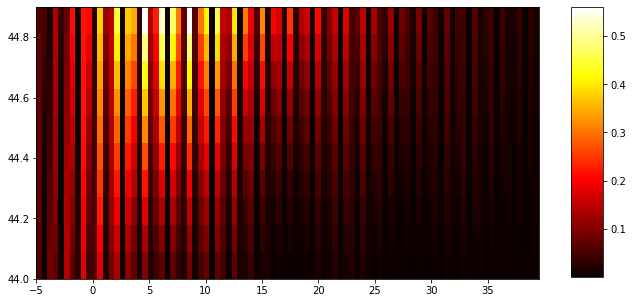

400


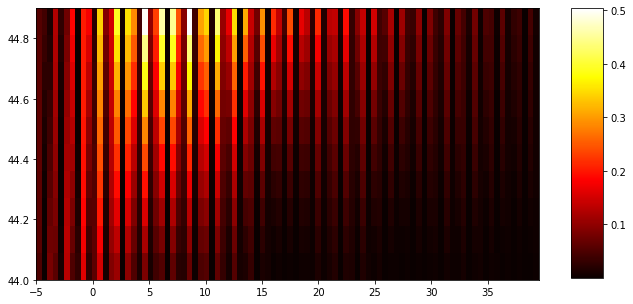

420


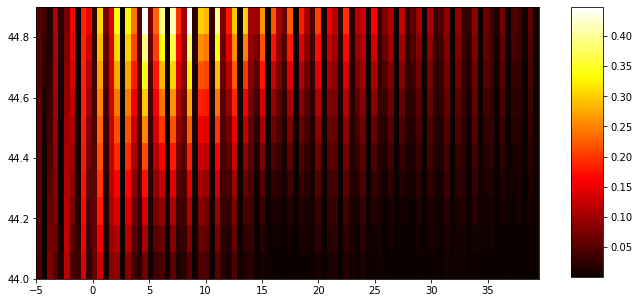

440


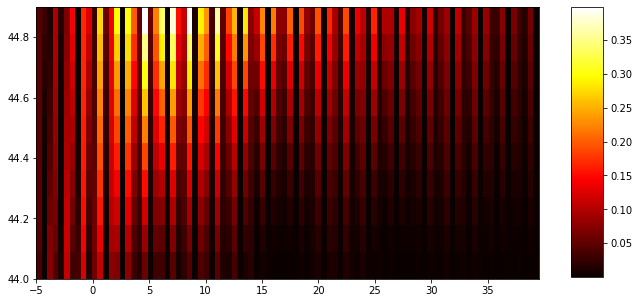

460


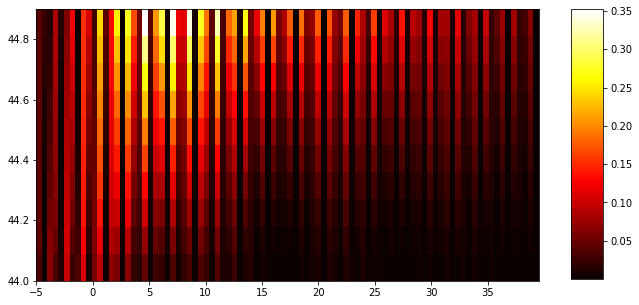

480


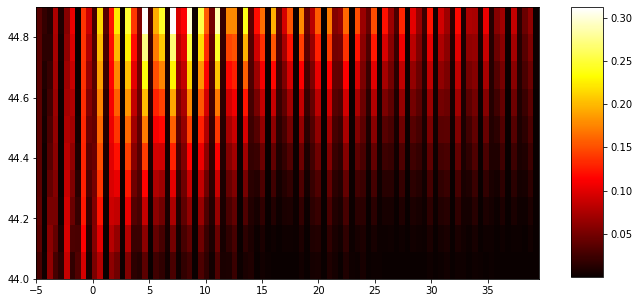

500


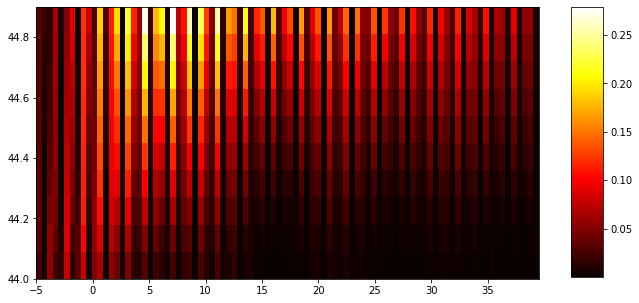

520


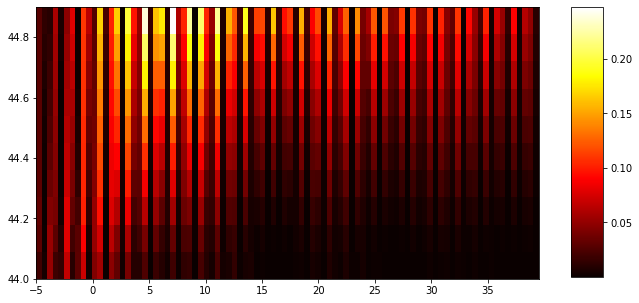

540


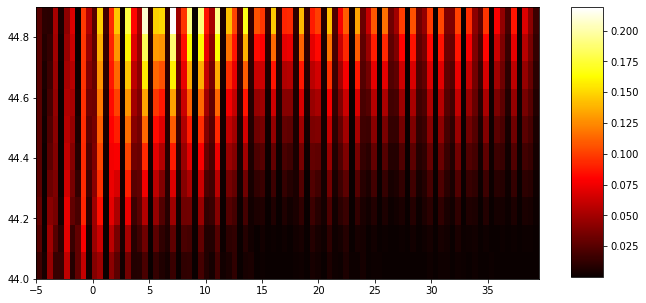

560


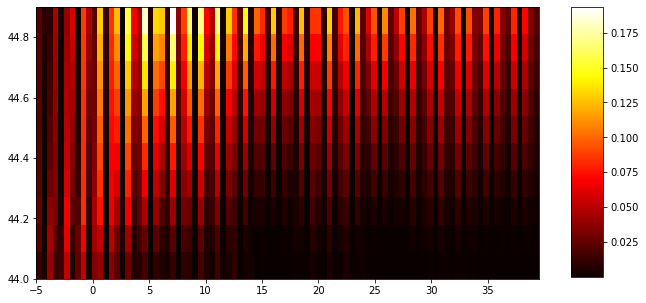

580


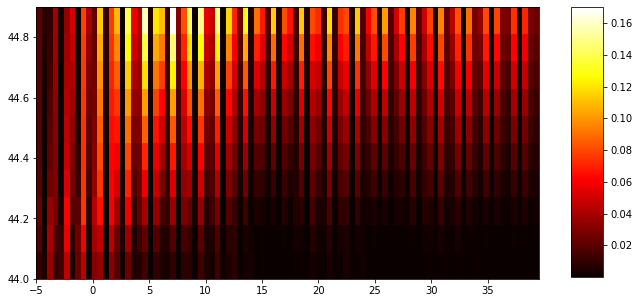

In [16]:

for i, E in enumerate(E_slices):
    #max_params = get_max_angle(E, True)
    #print("Spot size: ", 2 * spot_range[i], "angle: ", max_params[0], "shift: ", max_params[1])
    print(gap_range[i])
    plot_2Dmap(E, [X_range.min(), X_range.max(), angles_range.min(), angles_range.max()])

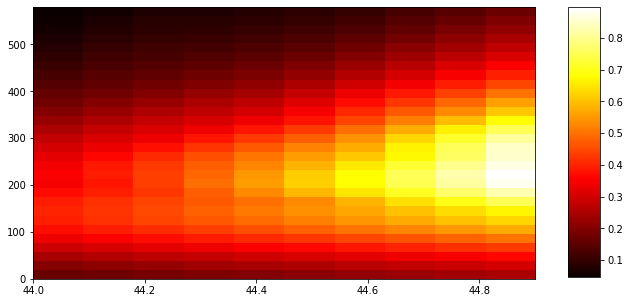

In [17]:
destr = np.empty((np.size(gap_range), np.size(angles_range)))
for i, E in enumerate(E_slices):
    I = np.abs(E) ** 2
    destr[i] = np.max(I, axis=1)
plot_2Dmap(destr, [angles_range.min(), angles_range.max(), gap_range.min(), gap_range.max()], isE=True)


### Плазмоны по полю в воздухе, над металлом.

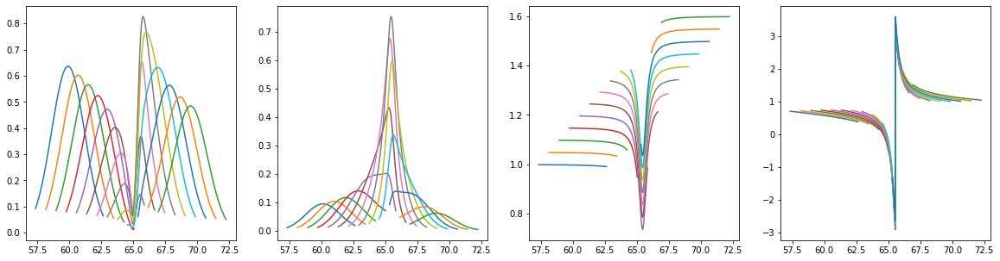

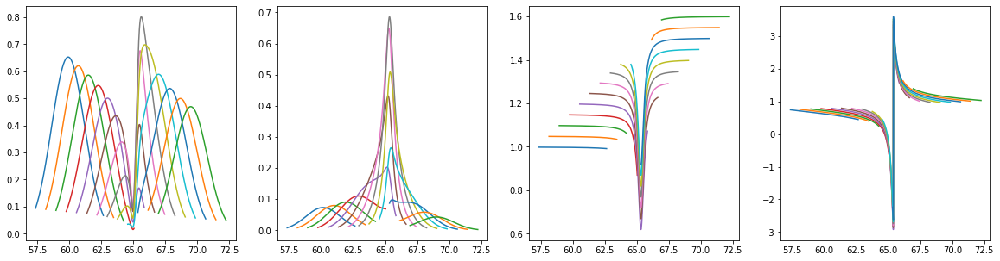

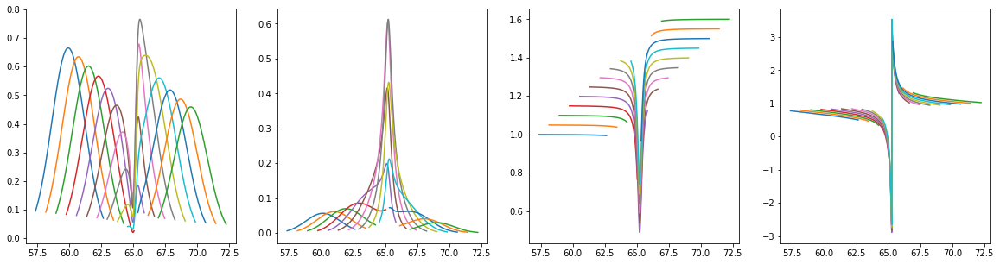

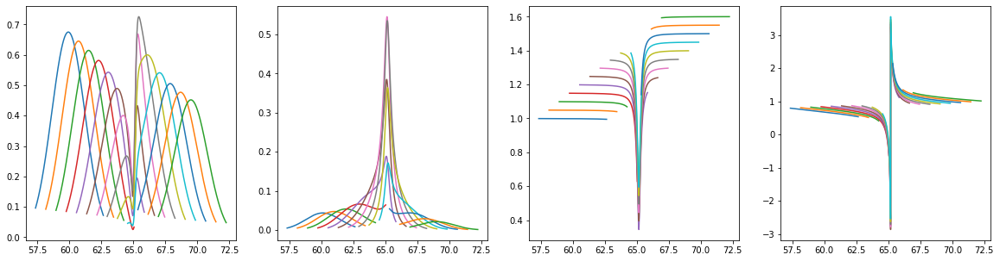

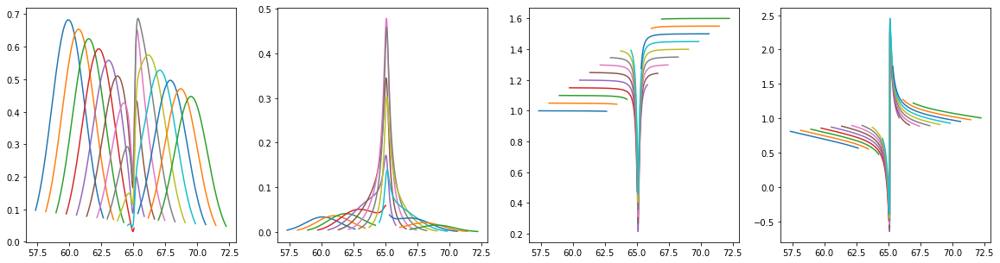

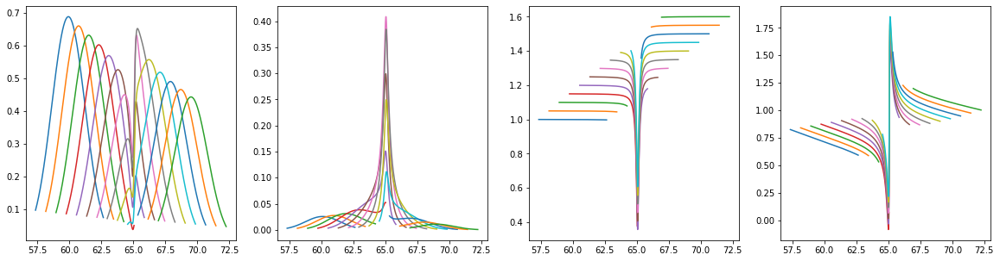

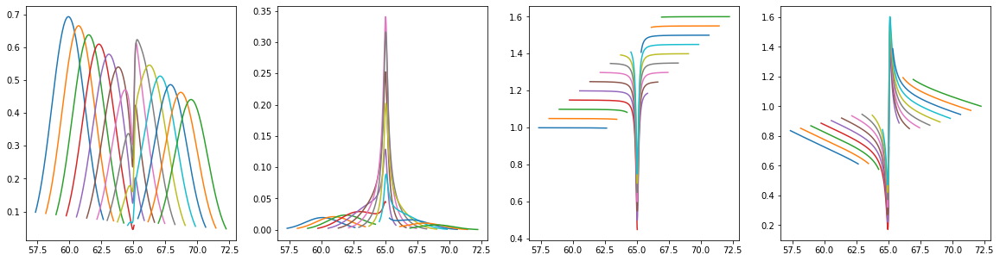

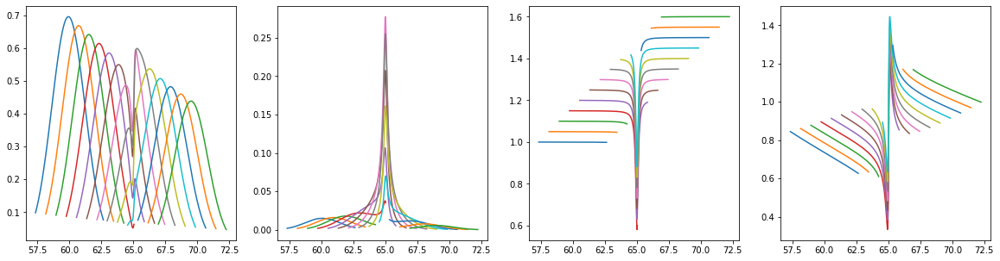

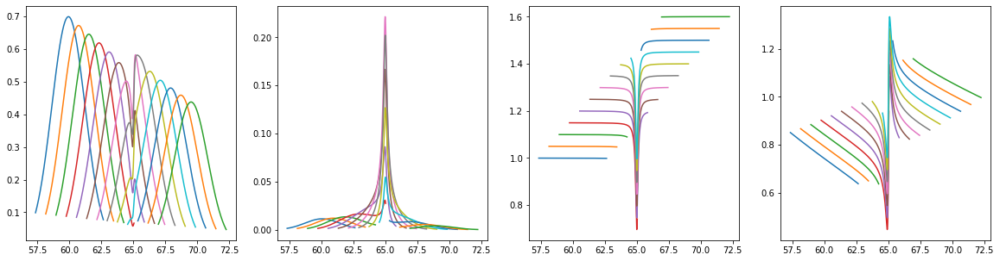

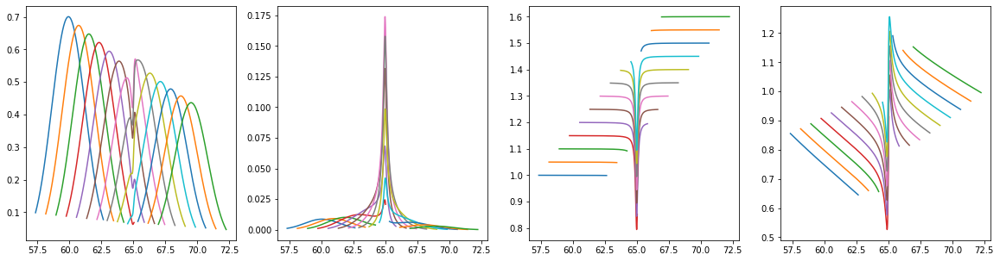

In [61]:
E_slices = []
for i, gap in enumerate(gap_range):
    plasmon_struct[1]['d'] = gap
    E_slices.append(cut_BSW_intesity(angles_range, X_range, plasmon_struct, 5., 
                                     plasmon_struct[1]['d'] / 1000, 0, polar="TM", wl=wl_Ag, plasmon=False))

200


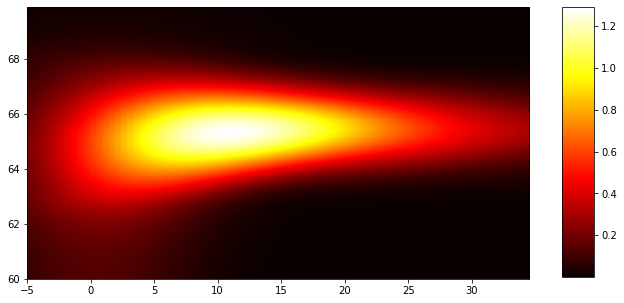

220


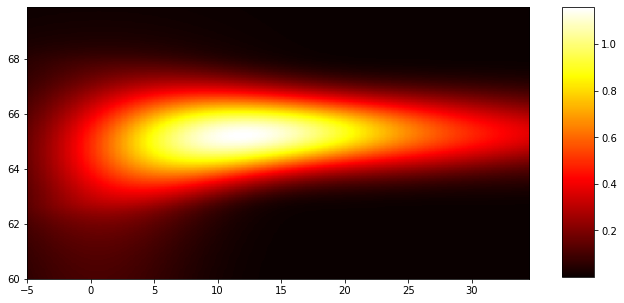

240


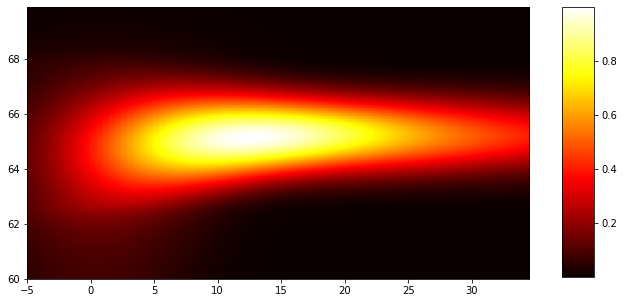

260


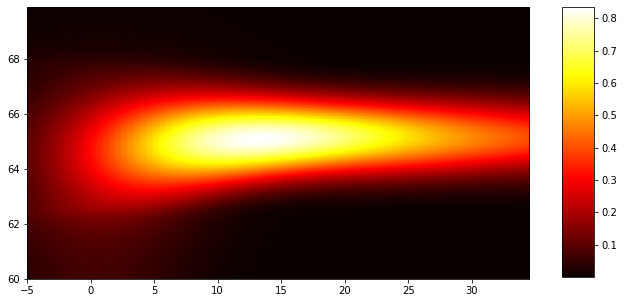

280


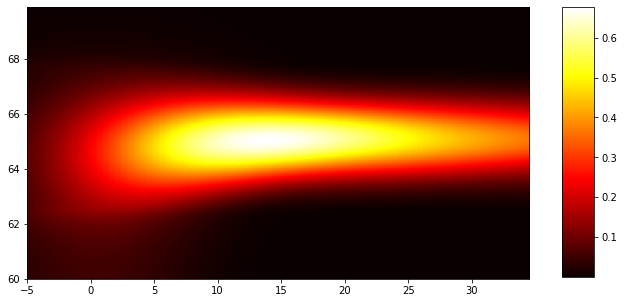

300


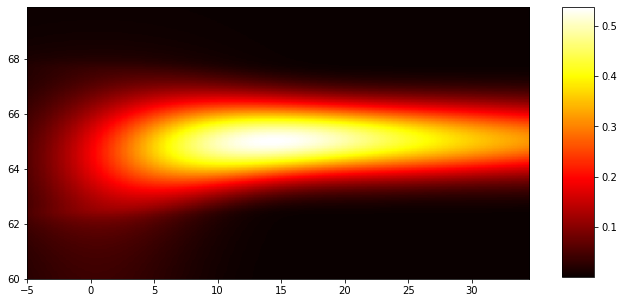

320


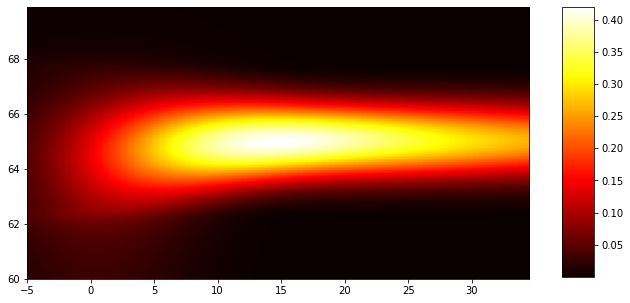

340


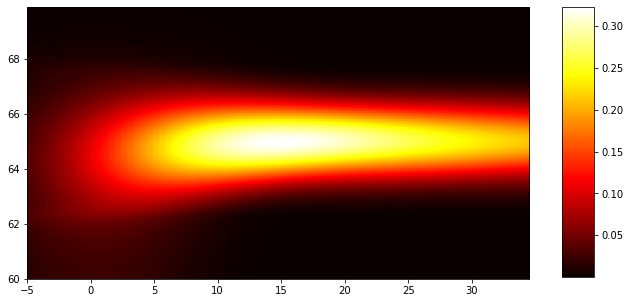

360


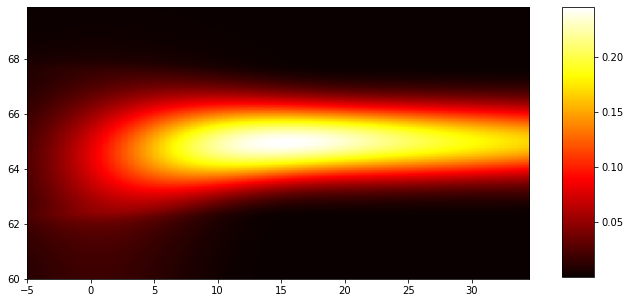

380


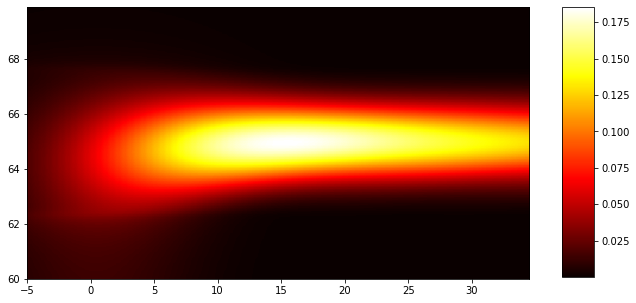

In [62]:
for i, E in enumerate(E_slices):
    #max_params = get_max_angle(E, True)
    #print("Spot size: ", 2 * spot_range[i], "angle: ", max_params[0], "shift: ", max_params[1])
    print(gap_range[i])
    plot_2Dmap(E, [X_range.min(), X_range.max(), angles_range.min(), angles_range.max()])

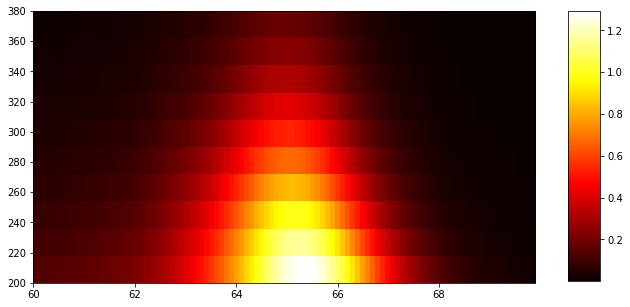

In [63]:
destr = np.empty((np.size(gap_range), np.size(angles_range)))
for i, E in enumerate(E_slices):
    I = np.abs(E) ** 2
    destr[i] = np.max(I, axis=1)
plot_2Dmap(destr, [angles_range.min(), angles_range.max(), gap_range.min(), gap_range.max()], isE=True)


In [ ]:

# def cut_BSW_intesity_1(alpha, X, struct, a=5, L=0, polar='TE', wl=780.):
#     '''
#     set default parameters range
#     '''
#     resq = []
#     k = 2 * np.pi * 1000000000 / wl * struct[0]['n']
#     k_mkm = k / 1000000.
#     k_x = get_k_x(a=a, N_x=501, decr_times=20)
#     dk = k_x[1] - k_x[0]
#     s = spectral(a, k_x).reshape((-1, 1))
#     r_pos = np.empty((1, 2))
    
#     angles = 180 / np.pi * np.arcsin(k_x / k_mkm) + alpha
#     R = vectorize_R(angles, wl, struct, polar).reshape((-1, 1))
    
#     n_arr, d_arr = dict_to_arr(struct)
    
#     res = []
#     for i, n_cur in enumerate(n_arr):
#        # print("SoS")
#         if i == np.size(n_arr) - 2:
#             break
#         TMMs = generate_TMM(n_arr[0], n_arr[i], n_arr[i + 1], angles, polar)
#         if i == 0:
#             TMM_res = TMMs
#         else:
#             TMM_res = TMMs @ tmp
#         k_mkm_gap = k_mkm / n_arr[0] * n_arr[i + 1]
#         k_xz = get_K_xz_air(k_mkm, k_mkm_gap, angles) #k_mkm_gap - волновой вектор в текущей среде
#         defocus_phase = 1. #get_defocus_phase(k_mkm, angles, L)
#         E_plus, E_minus = E_air_spectrum(s, R, TMM_res)
#         Z_range = np.arange(0, d_arr[i], 1)
#        # print(i, "/",  np.size(n_arr) - 1, d_arr[i], n_arr[i + 1])
#         N_tmp = vectorize_N(n_arr[0], np.pi / 180 * angles, n_arr[i + 1])

#         for z_cur in Z_range:
#             r_pos[0, 1] = z_cur / 1000.
#             E_destr = np.empty(np.shape(X), dtype=np.complex)
#             E_destr1 = np.empty(np.shape(X), dtype=np.complex)
#             for j, x in enumerate(X):
#                 r_pos[0, 0] = x
# #                 if i == 0:
# #                     E_forward = np.exp(1.0j * r_pos @ k_xz, dtype=np.complex) @ (E_plus * defocus_phase) * dk
# #                     E_backward = np.exp(1.0j * r_pos @ k_xz.conj(), dtype=np.complex) @(E_minus * defocus_phase) * dk
# #                 else:
#                 tmp_val = np.exp(1.0j * r_pos @ k_xz, dtype=np.complex)
#                 E_forward =  tmp_val @ (E_plus * defocus_phase) * dk
#                 r_pos[0, 1] *= -1
#                 tmp_val1 = np.exp(1.0j * r_pos @ k_xz, dtype=np.complex)
#                 E_backward = tmp_val1 @(E_minus * defocus_phase) * dk
#                 r_pos[0, 1] *= -1
#                 E_destr[j] = E_forward + E_backward
#                 #print(np.shape(tmp_val), np.shape(E_plus))
#                 E_destr1[j] = np.sum((tmp_val.T * E_plus + tmp_val1.T * E_minus) * np.sqrt(np.sin(angles / 180 * np.pi)))
                
#             resq.append(abs(E_destr1) ** 2 / 1000 / 1.28)
#             res.append(abs(E_destr) ** 2)
#         tmp = phase_shift_vec(d_arr[i] / 1000., N_tmp, k_mkm / n_arr[0]) @ TMM_res
#     return res, resq

In [3]:

def cut_BSW_intesity_1(alpha, X, struct, a=5, L=0, polar='TE', wl=780.):
    '''
    set default parameters range
    '''
    k = 2 * np.pi * 1000000000 / wl * struct[0]['n']
    k_mkm = k / 1000000.
    k_x = get_k_x(a=a, N_x=501, decr_times=20)
    dk = k_x[1] - k_x[0]
    s = spectral(a, k_x).reshape((-1, 1))
    r_pos = np.empty((1, 2))
    
    angles = 180 / np.pi * np.arcsin(k_x / k_mkm) + alpha
    R = vectorize_R(angles, wl, struct, polar).reshape((-1, 1))
    
    n_arr, d_arr = dict_to_arr(struct)
    
    res = []
    for i, n_cur in enumerate(n_arr):
       # print("SoS")
        if i == np.size(n_arr) - 2:
            break
        TMMs = generate_TMM(n_arr[0], n_arr[i], n_arr[i + 1], angles, polar)
        if i == 0:
            TMM_res = TMMs
        else:
            TMM_res = TMMs @ tmp
        k_mkm_gap = k_mkm / n_arr[0] * n_arr[i + 1]
        k_xz = get_K_xz_air(k_mkm, k_mkm_gap, angles) #k_mkm_gap - волновой вектор в текущей среде
        defocus_phase = 1. #get_defocus_phase(k_mkm, angles, L)
        E_plus, E_minus = E_air_spectrum(s, R, TMM_res)
        Z_range = np.arange(0, d_arr[i], 1)
       # print(i, "/",  np.size(n_arr) - 1, d_arr[i], n_arr[i + 1])
        N_tmp = vectorize_N(n_arr[0], np.pi / 180 * angles, n_arr[i + 1])

        for z_cur in Z_range:
            r_pos[0, 1] = z_cur / 1000.
            E_destr = np.empty(np.shape(X), dtype=np.complex)
            for j, x in enumerate(X):
                r_pos[0, 0] = x
#                 if i == 0:
#                     E_forward = np.exp(1.0j * r_pos @ k_xz, dtype=np.complex) @ (E_plus * defocus_phase) * dk
#                     E_backward = np.exp(1.0j * r_pos @ k_xz.conj(), dtype=np.complex) @(E_minus * defocus_phase) * dk
#                 else:
                E_forward = np.exp(1.0j * r_pos @ k_xz, dtype=np.complex) @ (E_plus * defocus_phase) * dk
                r_pos[0, 1] *= -1
                E_backward = np.exp(1.0j * r_pos @ k_xz, dtype=np.complex) @(E_minus * defocus_phase) * dk
                r_pos[0, 1] *= -1
                E_destr[j] = E_forward + E_backward
            res.append(abs(E_destr) ** 2)
        tmp = phase_shift_vec(d_arr[i] / 1000., N_tmp, k_mkm / n_arr[0]) @ TMM_res
    return res

In [2]:
def dict_to_arr(struct={}):
    n_array = []
    d_array = []
    for i in range(len(struct)):
        if struct[i]['name'] == 'Среда':
            n_array.append(struct[i]['n'])
        elif struct[i]['name'] == 'Слой':
            d_array.append(struct[i]['d'])
            n_array.append(struct[i]['n'])
        elif struct[i]['name'] == 'ФК':
            for j in range(int(struct[i]['N'])):
                d_array.append(struct[i]['d1'])
                d_array.append(struct[i]['d2'])
                n_array.append(struct[i]['n1'])
                n_array.append(struct[i]['n2'])
#         if i == len(struct) - 1:
#             n_array.append(struct[i]['n'])
#             d_array.append(200.)
    return np.array(n_array, dtype=np.complex), np.array(d_array, dtype=np.float)


In [30]:
dict_to_arr(didic)

NameError: name 'didic' is not defined

In [63]:
strus = {
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 295},  
    2: {'name': 'ФК', 'N' : 10,
        'n1': 1.45 + 0.00002j, 'd1': 204.,
        'n2': 2.07 + 0.00002j, 'd2': 143.},
    3: {'name': 'Среда', 'n': 1.52 + 0.j }
}

X_range = np.arange(-5, 35, 1)
KPD = np.empty((np.size(np.arange(200, 500, 20)), np.size(np.arange(44, 45, 0.1))))

# plasmon_struct[2]['d'] = 60
for i, gap_i in enumerate(np.arange(200, 500, 20)):
    print(i)
    for j, alpha_j in enumerate(np.arange(44, 45, 0.1)):
#         plasmon_struct[1]['d'] = gap_i
        strus[1]['d'] = gap_i
#         res = cut_BSW_intesity_1(alpha_j, X_range, plasmon_struct,
#                                        a=5., L=0, polar='TМ', wl=wl_Ag)
        res = cut_BSW_intesity_1(alpha_j, X_range, strus,
                                       a=5., L=0, polar='TE', wl=780.)
        real_res = np.array(res) * np.sin(alpha_j * np.pi / 180.) / 1.28 / 1000.
        KPD[i, j] = np.max(np.sum(real_res, axis=0))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


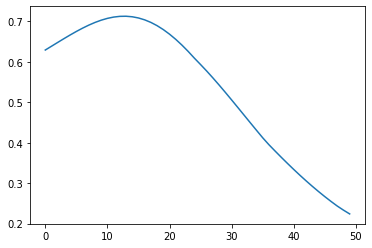

In [58]:
plt.plot(KPD[9])


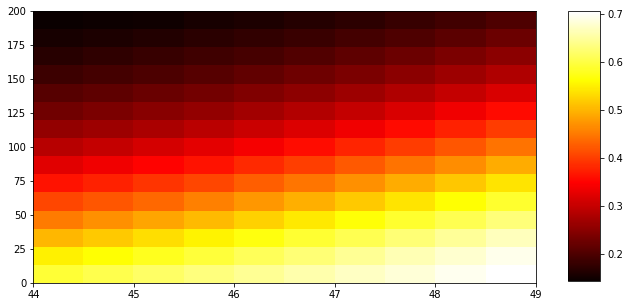

In [64]:
plot_2Dmap(KPD[:, :], [44, 49, 0, 200], isE=True)

In [86]:
df=pd.DataFrame(sum2, columns=np.arange(44, 49, 0.1), index=np.arange(0, 500, 20))
df.to_csv("KPD_full" + ".csv")

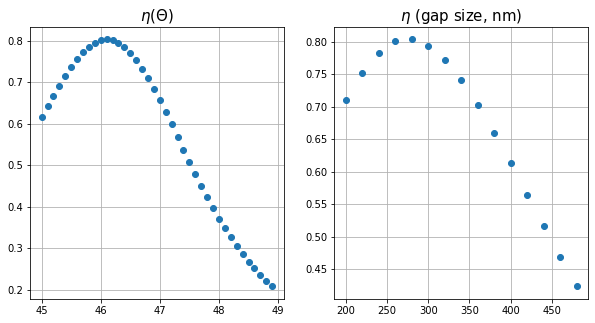

In [60]:
import pandas as pd
import numpy as np

angles_range = np.arange(45, 49, 0.1)
gap_range = np.arange(200, 500, 20)
table = pd.read_csv("KPD_DATA_SHOKK_CONTENT.csv", index_col='Unnamed: 0')
data = np.array(table)
table_shape = np.shape(data)
gap_max_ind = np.argmax(data) // table_shape[1]
angle_max_ind = np.argmax(data) % table_shape[1]  
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].plot(angles_range, data[gap_max_ind], 'o')
ax[0].set_title("$\eta ({\Theta})$", fontsize=15)
ax[1].plot(gap_range, data[:, angle_max_ind], 'o')
ax[1].set_title("$\eta$ (gap size, nm)", fontsize=15)
ax[0].grid()
ax[1].grid()

In [69]:
angles_range = np.arange(45, 49, 0.1)
gap_range = np.arange(200, 500, 20)
table = pd.read_csv("KPD_DATA_SHOKK_CONTENT.csv", index_col='Unnamed: 0')
data = np.array(table)

angles_range1 = np.arange(44, 49, 0.1)
gap_range1 = np.arange(0, 200, 20)
table1 = pd.read_csv("KPD_DATA_SHOKK_CONTENT1.csv", index_col='Unnamed: 0')
data1 = np.array(table1)

sum1 = np.hstack((KPD, data))
sum2 = np.vstack((data1, sum1))

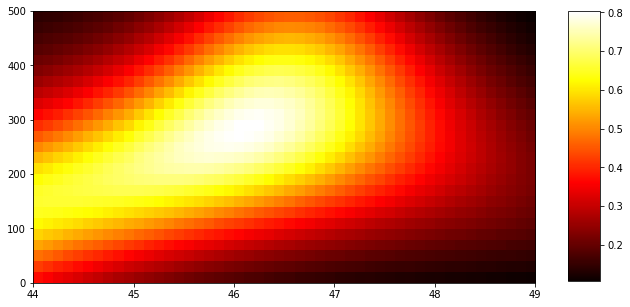

In [71]:
plot_2Dmap(sum2[:, :], [44, 49, 0, 500], isE=True)

In [8]:
wl_Ag=756.
n_Ag=0.03 + 5.242j

plasmon_struct = {
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой',  'n': n_Ag, 'd': 50},
    2: {'name': 'Слой',  'n': 1.41 + 0.00002j, 'd': 100},
    3: {'name': 'Среда', 'n': 1. + 0.j}
                 }


strus = {
    0: {'name': 'Среда', 'n': 1.5 + 0.j},  
    1: {'name': 'ФК', 'N' : 10,
        'n1': 1.45 + 0.00002j, 'd1': 204.,
        'n2': 2.07 + 0.00002j, 'd2': 143.},
    2: {'name': 'Среда', 'n': 1.52 + 0.j }
}

# didic = {
#     0: {'name': 'Среда', 'n': 1.5 + 0.j}, 
#     1: {'name': 'ФК', 'N' : 10,
#         'n1': 2.07+0.00001j,   'd1': 143.,
#         'n2': 1.45 + 0.00002j, 'd2': 204.},
#     2: {'name': 'Среда', 'n': 1. + 0.j}
# }


In [9]:
X_range = np.arange(-5, 30, 1)
# plasmon_struct[1]['d'] = 380
# plasmon_struct[2]['d'] = 60
res = cut_BSW_intesity_1(46.1, X_range, strus, a=5., L=0, polar='TE', wl=780.)#=wl_Ag)
real_res = np.array(res)

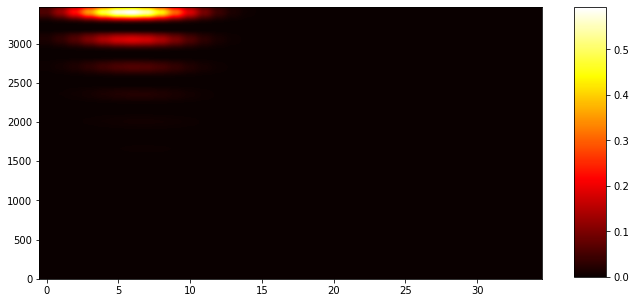

In [10]:
plot_2Dmap(real_res[::-1])

150


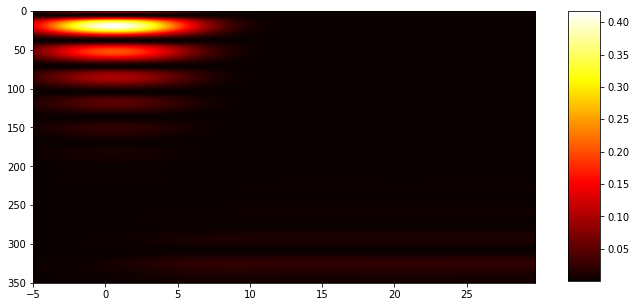

In [143]:


sum_arr = np.array([plasmon_struct[i]['d'] for i in range(1, len(plasmon_struct) - 1)])
print(int(np.sum(sum_arr)))
plot_2Dmap(real_res[::-1], [X_range.min(), X_range.max(), int(np.sum(sum_arr) + 200), 0], isE=True)

#plt.imshow(real_res[::-1], cmap=plt.cm.inferno, origin='lower', aspect='auto')    

776.6129611803977


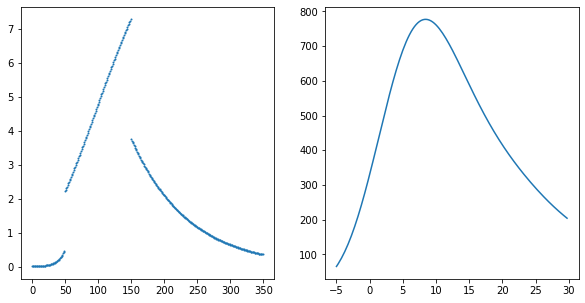

In [125]:
max_arg = np.argmax(real_res[int(plasmon_struct[1]['d'])])

_, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].plot(real_res[:,  max_arg], 'o', markersize=1)
print(np.sum(real_res[:,  max_arg]))

I_x = np.sum(real_res, axis=0)
ax[1].plot(X_range, I_x)

In [185]:
491.497329248 * 1.5 * np.sin(np.pi / 180. * 46.9) / 1000 / 1.254 / 1.5

0.2861824632190903

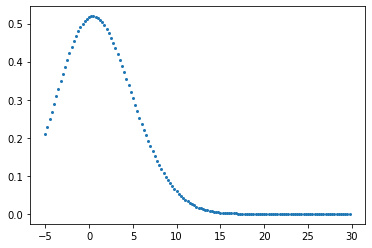

In [180]:
plt.plot(X_range, real_res[max_arg], 'o', markersize=2)

In [13]:
def get_max_angle(E_bsw, return_shift=None, plot_I_a=None, plot_I_x=None):
    I = np.abs(E_bsw) ** 2
    I_max = []
    for line in I:
        I_max.append(np.max(line))
    if plot_I_a != None:
        plt.plot(angles_range, I_max)
        plt.grid()
        plt.xlabel("Inc angle")
        plt.ylabel("Intensity")
    angle_max = angles_range[np.argmax(I_max)]
    if return_shift != None:
        if plot_I_x != None:
            plt.plot(X_range, I[np.argmax(I_max)])
        shift = X_range[np.argmax(I[np.argmax(I_max)])]
        return [angle_max, shift, np.max(I)]
    print("I_max: ", np.max(I_max), "angle_max: ", angles_range[np.argmax(I_max)])
    return [angle_max]

NameError: name 'I_x_a_d' is not defined

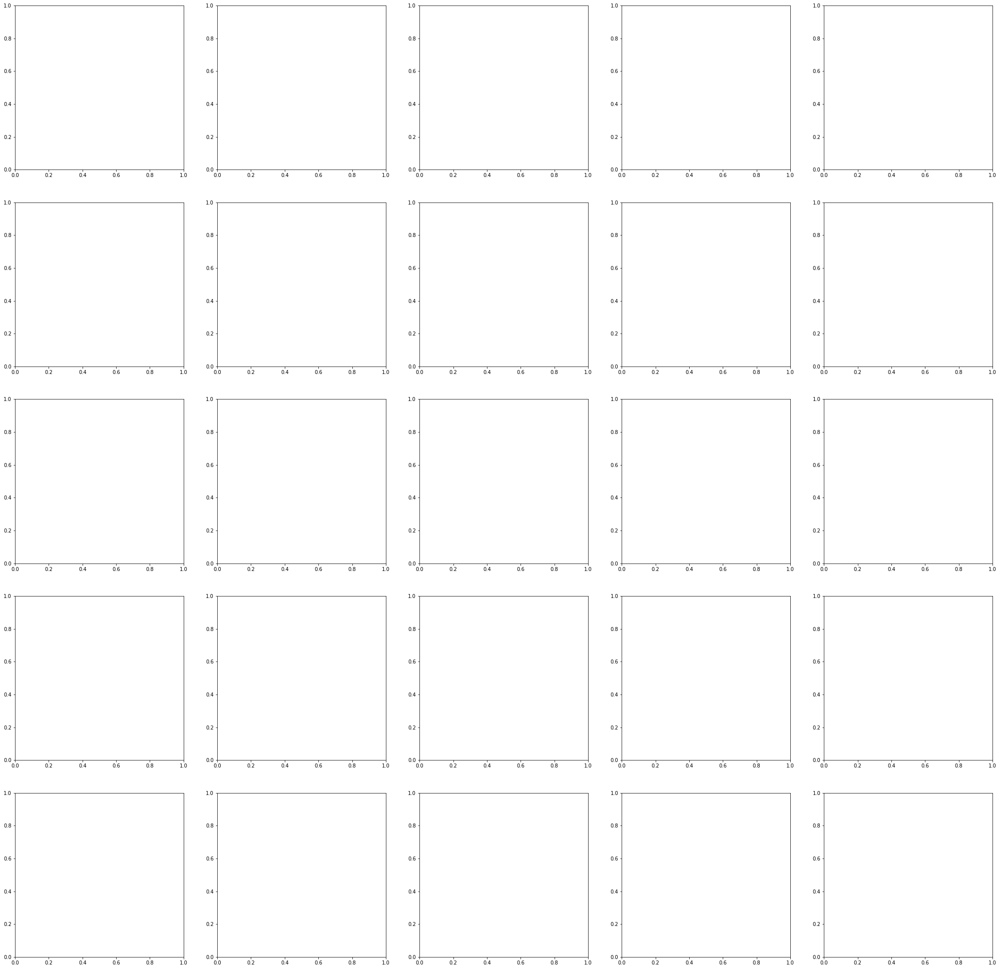

In [17]:
didic = {
    0: {'name': 'Среда', 'n': 1.5 + 0.j},
    1: {'name': 'Слой', 'n': 1. + 0.j, 'd': 700},  
    2: {'name': 'Слой', 'n': n_Au, 'd': 100},
    3: {'name': 'Среда','n': 1.52 + 0.j}
}

angles_range = np.arange(43, 46.1, 0.1)
X_range = np.arange(-10, 30, 1)
gap_range = np.arange(300, 1000, 20)
spots_range = np.arange(4, 15, 0.5)
defocus_range = np.arange(0, 50, 150)
extent_h=[angles_range.min(), angles_range.max(), gap_range.min(), gap_range.max()]
fig, axs = plt.subplots(np.size(spots_range) // 5 + 1, 5, figsize=(7 * 5, 7 * (np.size(spots_range) // 5 + 1)))

for i, spt in enumerate(spots_range):
    data = I_x_a_d(angles_range, gap_range, didic, X_range, spt, 0, "TM", 600.)
    graph, label = get_I_alpha_d(data, angles_range, gap_range)
    label = label + " w: " + str(2 * spt)
    tmp = axs[i // 5, i % 5].imshow(graph, cmap=plt.cm.hot, origin='lower', aspect='auto', extent=extent_h)    
    axs[i // 5, i % 5].set_title(label)
    plt.colorbar(tmp, ax=axs[i // 5, i % 5])
    print(i / np.size(spots_range))
fig.savefig("/home/arkhem/E_dist.png")

In [39]:
import pandas as pd

angles_range = np.arange(45, 49.1, 0.01)
gap_range = np.arange(200, 520, 5)
table = pd.read_csv("w=10.0wide.csv", index_col='Unnamed: 0')
data = table.to_numpy()

spot:  5.0 angle:  47.05999999999959 gap:  200


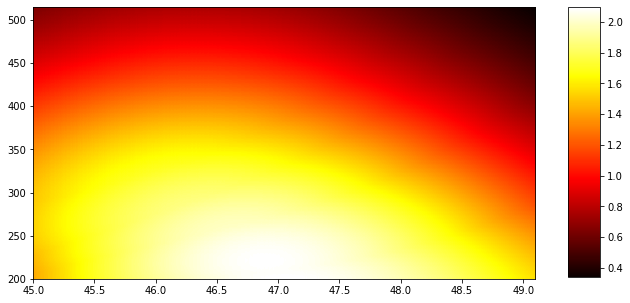

spot:  6.0 angle:  46.729999999999656 gap:  225


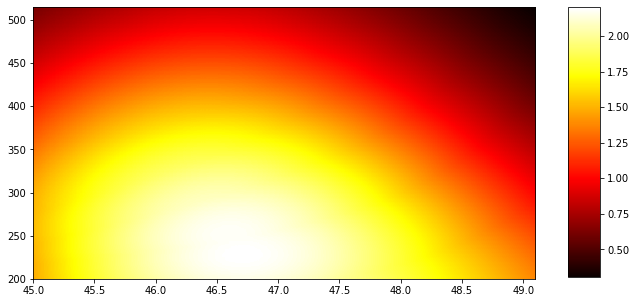

spot:  7.0 angle:  46.5199999999997 gap:  255


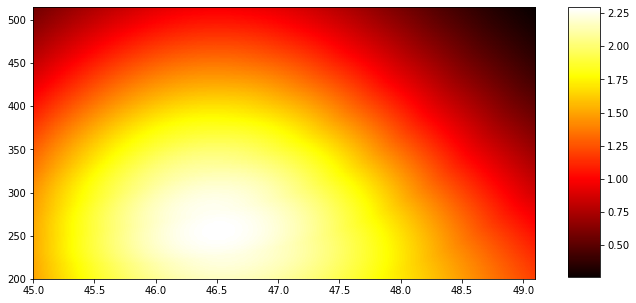

spot:  8.0 angle:  46.41999999999972 gap:  275


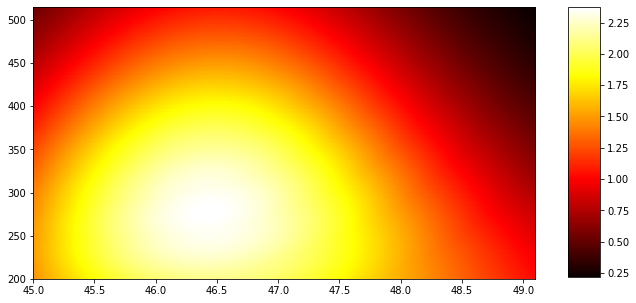

spot:  9.0 angle:  46.35999999999973 gap:  295


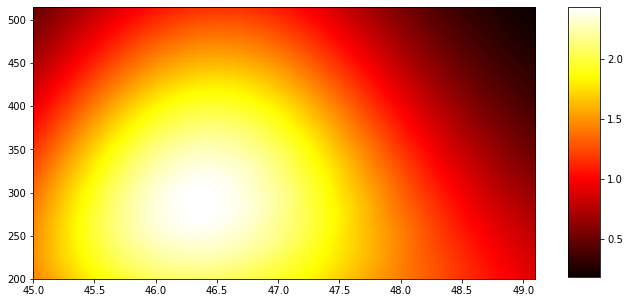

spot:  10.0 angle:  46.329999999999735 gap:  295


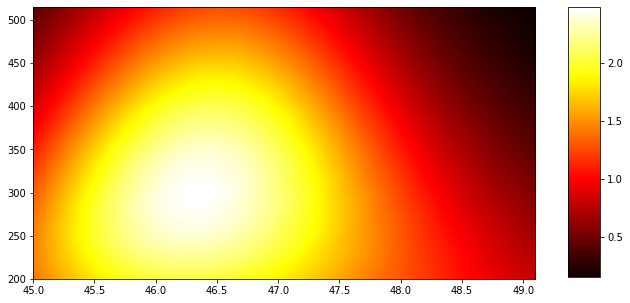

spot:  11.0 angle:  46.31999999999974 gap:  310


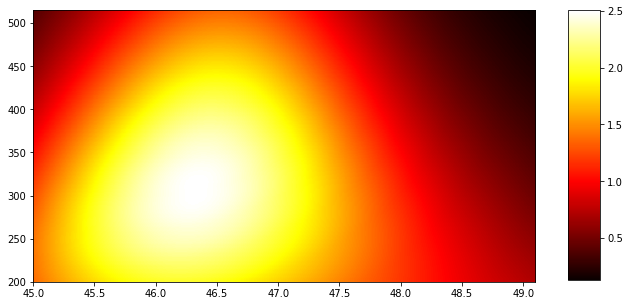

spot:  12.0 angle:  46.329999999999735 gap:  315


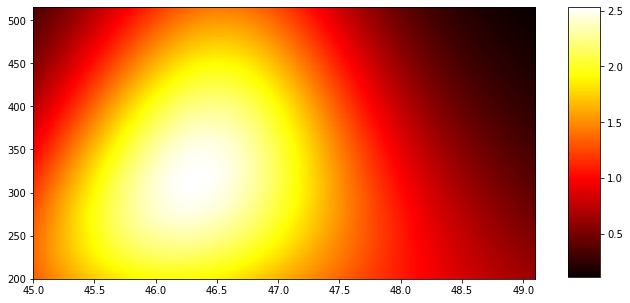

spot:  13.0 angle:  46.33999999999973 gap:  330


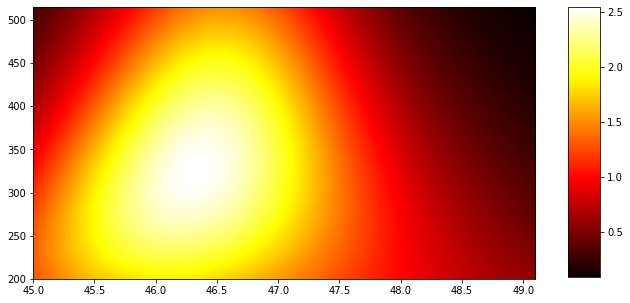

spot:  14.0 angle:  46.33999999999973 gap:  330


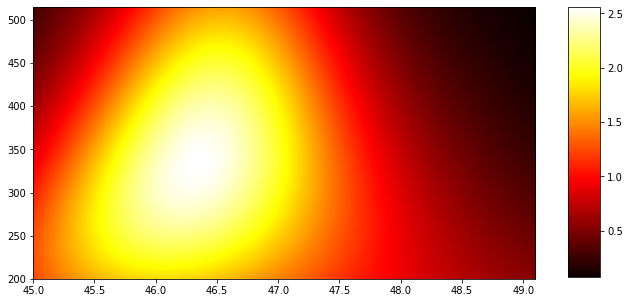

In [109]:
w_range = np.arange(5., 15., 1.)
angles_range = np.arange(45, 49.1, 0.01)
X_range = np.arange(-5, 30, 1)
gap_range = np.arange(200, 520, 5)
extent_h=[angles_range.min(), angles_range.max(), gap_range.min(), gap_range.max()]

np_arrays = np.empty((np.size(w_range), np.size(gap_range), np.size(angles_range)))

for i, w in enumerate(w_range): 
    data = pd.read_csv("w=" + str(w) + "wide.csv", index_col='Unnamed: 0')
    np_arrays[i] = data.to_numpy()
    angle_max = angles_range[np.argmax(np_arrays[i]) % np.size(angles_range)]
    gap_max = gap_range[np.argmax(np_arrays[i]) // np.size(angles_range)]
    print("spot: ", w, "angle: ", angle_max, "gap: ", gap_max)
    plot_2Dmap(np_arrays[i], extent_h, isE=True)
    

#### По старым данным: Зависимость оптимального зазора от угла, Интенсивности от угла падения для зазора с максимальной эффективностью, Интенсивности от зазора при угле с максимальной эффективностью

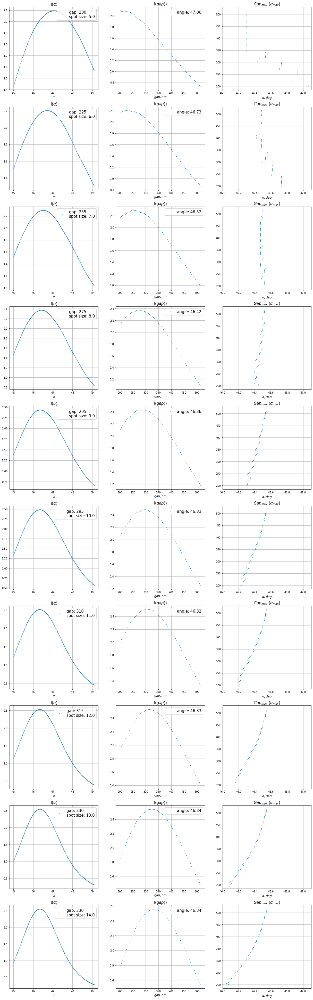

In [113]:
fig, ax = plt.subplots(np.size(w_range), 3, figsize=(21, 7 * np.size(w_range)))
for i, w in enumerate(w_range):
    angle_index = np.argmax(np_arrays[i]) % np.size(angles_range)
    gap_index = np.argmax(np_arrays[i]) // np.size(angles_range)
    #print(np.round(angles_range[angle_index], 2), gap_range[gap_index])
    ax[i, 0].plot(angles_range, np_arrays[i][gap_index], 'o', markersize=1, 
                        label="gap: " + str( gap_range[gap_index]) + "\nspot size: " + str(w))
    ax[i, 0].grid()
    ax[i, 0].set_title("I($\\alpha$)", fontsize=15)
    ax[i, 0].set_xlabel("$\\alpha$", fontsize=12)
    ax[i, 0].legend(fontsize=15, loc='upper right')
    
    ax[i, 1].plot(gap_range, np_arrays[i][:, angle_index], 'o', markersize=1.5, label="angle: " + str(np.round(angles_range[angle_index], 2)))
    ax[i, 1].grid()
    ax[i, 1].set_title("I($gap$))", fontsize=15)
    ax[i, 1].legend(fontsize=15)
    ax[i, 1].set_xlabel("$gap, nm$", fontsize=12)
    
    angle_index_max = np.argmax(np_arrays[i], axis=1)
    ax[i, 2].plot(angles_range[angle_index_max], gap_range, 'o', markersize=1.5)
    ax[i, 2].grid()
    ax[i, 2].set_title("$Gap_{max}$ ($ \\alpha_{max}$)", fontsize=15)
    ax[i, 2].set_xlabel("$ \\alpha, deg$", fontsize=12)
    ax[i, 2].set_xlim(right=47.1, left=46)
    

#### График 5d для теории в нашем случае для ФК (теоретическая кривая в Overleaf из Ульриха?)

Text(0.5, 0, '$gap, nm$')

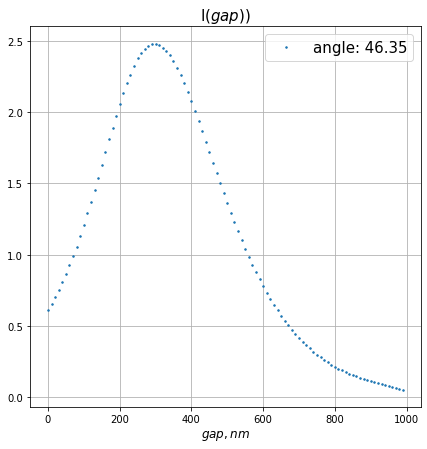

In [107]:
angles_range = np.arange(45, 49.1, 0.05)
X_range = np.arange(-5, 20, 1)
gap_range = np.arange(0, 1000, 10)

fig, ax = plt.subplots(1, 2, figsize=(14, 7))
angle_index = np.argmax(graph) % np.size(angles_range)
ax[0].plot(gap_range, graph[:, angle_index], 'o', markersize=1.5, label="angle: " + str(np.round(angles_range[angle_index], 2)))
ax[0].grid()
ax[0].set_title("I($gap$))", fontsize=15)
ax[0].legend(fontsize=15)
ax[0].set_xlabel("$gap, nm$", fontsize=12)


angle_index_max = np.argmax(np_arrays[i], axis=1)
ax[1].plot(angles_range[angle_index_max], gap_range, 'o', markersize=1.5)
ax[1].grid()
ax[1].set_title("$Gap_{max}$ ($ \\alpha_{max}$)", fontsize=15)
ax[1].set_xlabel("$ \\alpha, deg$", fontsize=12)
ax[1].set_xlim(right=47.1, left=46)

spot:  3.0 angle:  46.149999999999935 gap:  320


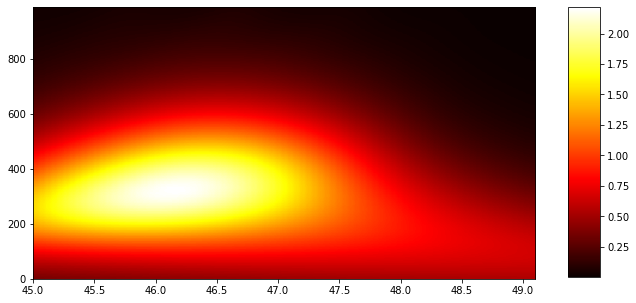

spot:  3.0 angle:  46.19999999999993 gap:  320


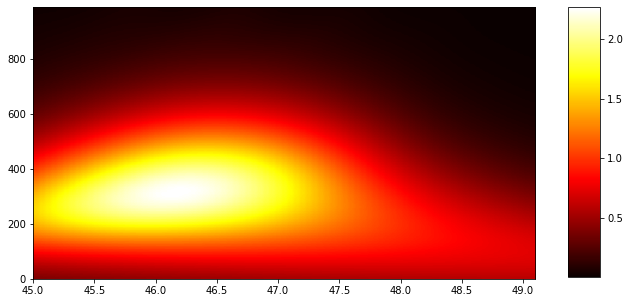

spot:  3.0 angle:  46.19999999999993 gap:  300


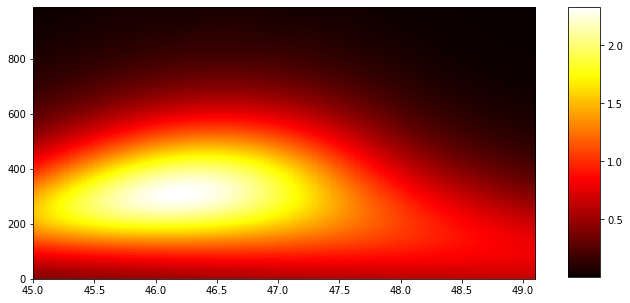

spot:  3.0 angle:  46.24999999999993 gap:  300


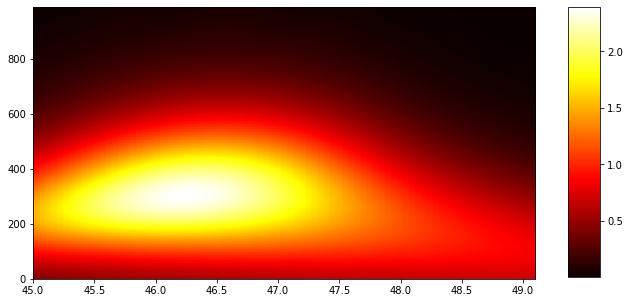

spot:  3.0 angle:  46.299999999999926 gap:  300


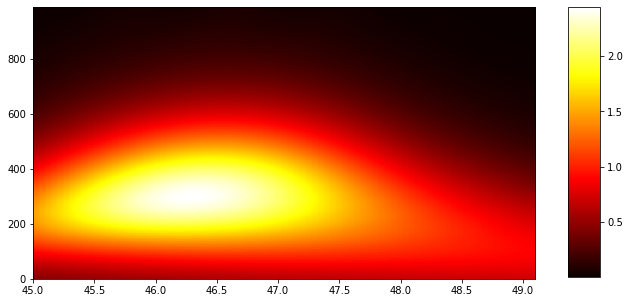

spot:  3.0 angle:  46.34999999999992 gap:  300


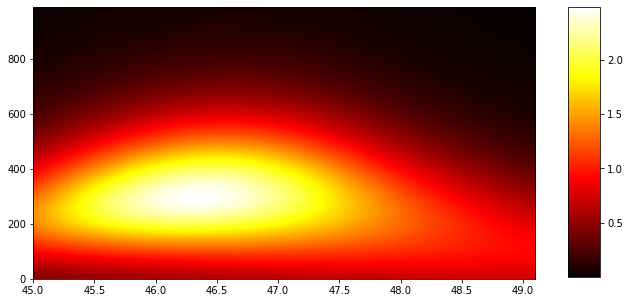

spot:  3.0 angle:  46.39999999999992 gap:  300


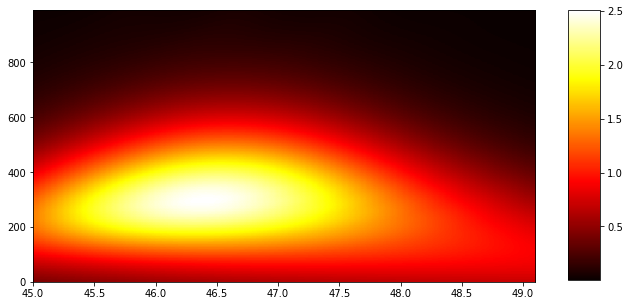

spot:  3.0 angle:  46.44999999999992 gap:  300


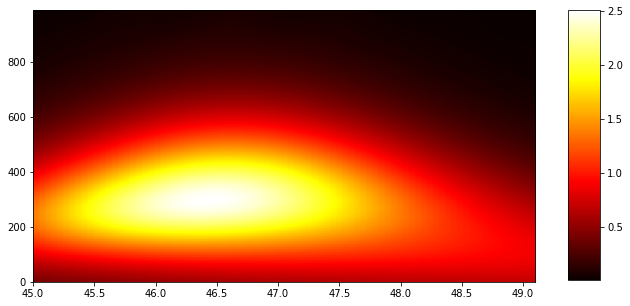

spot:  3.0 angle:  46.499999999999915 gap:  300


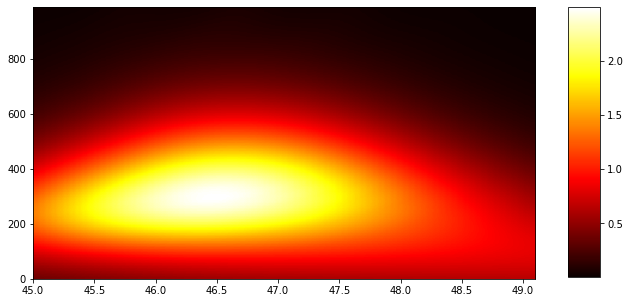

spot:  3.0 angle:  46.499999999999915 gap:  310


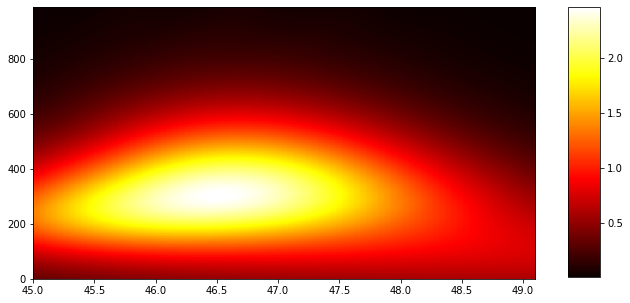

spot:  3.0 angle:  46.499999999999915 gap:  310


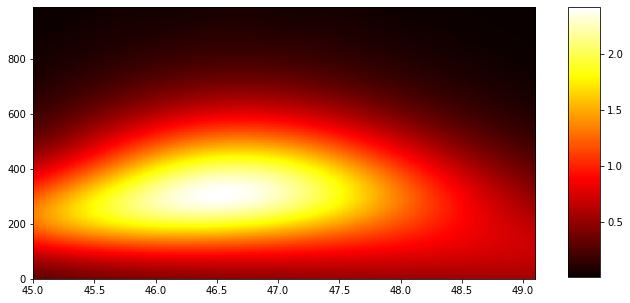

In [35]:
angles_range = np.arange(45, 49.1, 0.05)
X_range = np.arange(-5, 20, 1)
gap_range = np.arange(0, 1000, 10)
spots_range = np.arange(5, 5.1, 0.5)
defocus_range = np.arange(-150, 180, 30)
extent_h=[angles_range.min(), angles_range.max(), gap_range.min(), gap_range.max()]

np_arrays = np.empty((np.size(defocus_range), np.size(gap_range), np.size(angles_range)))

for i, defoc in enumerate(defocus_range): 
    data = pd.read_csv("defoc=" + str(defoc) + "defoc_invest_0_1000gap.csv", index_col='Unnamed: 0')
    np_arrays[i] = data.to_numpy()
    angle_max = angles_range[np.argmax(np_arrays[i]) % np.size(angles_range)]
    gap_max = gap_range[np.argmax(np_arrays[i]) // np.size(angles_range)]
    print("spot: ", w, "angle: ", angle_max, "gap: ", gap_max)
    plot_2Dmap(np_arrays[i], extent_h, isE=True)
    

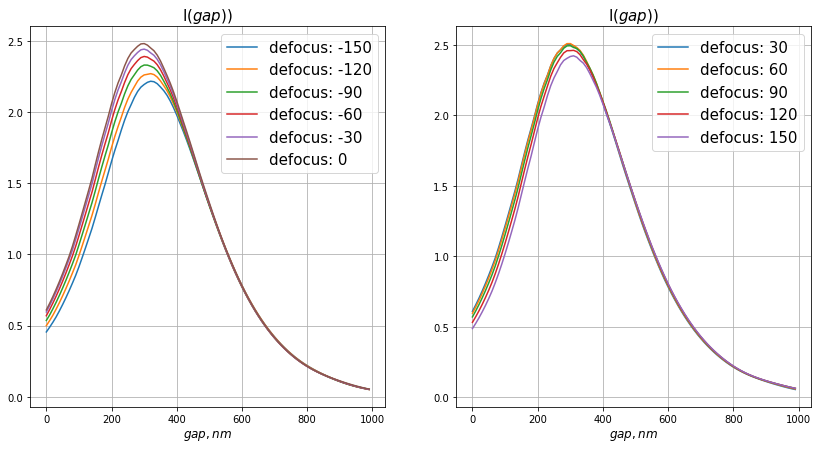

In [47]:
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

ax[0].grid()
for i, graph in enumerate(np_arrays):
    if defocus_range[i] > 0:
        break
    angle_index = np.argmax(graph) % np.size(angles_range)
    ax[0].plot(gap_range, graph[:, angle_index], label="defocus: " + str(defocus_range[i]))
    ax[0].set_title("I($gap$))", fontsize=15)
    ax[0].legend(fontsize=15)
    ax[0].set_xlabel("$gap, nm$", fontsize=12)

for i, graph in enumerate(np_arrays):
    if defocus_range[i] <= 0:
        continue
    angle_index = np.argmax(graph) % np.size(angles_range)
    ax[1].grid()
    ax[1].plot(gap_range, graph[:, angle_index], label="defocus: " + str(defocus_range[i]))
    ax[1].set_title("I($gap$))", fontsize=15)
    ax[1].legend(fontsize=15)
    ax[1].set_xlabel("$gap, nm$", fontsize=12)

In [ ]:
df=pd.DataFrame(graph, columns=angles_range, index=gap_range)
df.to_csv("10mkm_gap_invest" + ".csv")

In [174]:
def decor1(angles, wl, struct, polar):
    return R_func(struct, wl, angles, polar)
vectorize_R = np.vectorize(decor1)
vectorize_N = np.vectorize(N_calculation)

def transfer_matrix_vec(N1, N2, polar='TE', n1=1, n2=1):
    if polar == 'TE':
        t00 = (N2 + N1) / (2. * N2)
        t01 = (N2 - N1) / (2. * N2)
        t10 = (N2 - N1) / (2. * N2)
        t11 = (N2 + N1) / (2. * N2)
    else:
        t00 = (n2 ** 2 * N1 + n1 ** 2 * N2) / (2. * n1 * n2 * N2)
        t01 = (n2 ** 2 * N1 - n1 ** 2 * N2) / (2. * n1 * n2 * N2) 
        t10 = (n2 ** 2 * N1 - n1 ** 2 * N2) / (2. * n1 * n2 * N2) 
        t11 = (n2 ** 2 * N1 + n1 ** 2 * N2) / (2. * n1 * n2 * N2) 
    return np.vstack((t00, t01, t10, t11)).reshape((2, 2, -1)).T

def phase_shift_vec(d, N, k0):
    p00 = np.exp(1.j * d * N * k0)
    p01 = np.zeros(np.shape(p00), dtype=np.complex)
    p10 = np.zeros(np.shape(p00), dtype=np.complex)
    p11 = np.exp(-1.j * d * N * k0)
    return np.vstack((p00, p01, p10, p11)).reshape((2, 2, -1)).T

def generate_TMM(n0, n1, n2, angles, polar):
    N1 = vectorize_N(n0, np.pi / 180 * angles, n1)
    N2 = vectorize_N(n0, np.pi / 180 * angles, n2)
    TMMs = transfer_matrix_vec(N1, N2, polar, n1, n2)
    return TMMs

def get_K_xz_air(k_mkm, k_mkm_gap, angles):
    k_x_b = k_mkm * np.sin(np.pi / 180 * angles, dtype=np.complex)
    k_z_b = np.sqrt(k_mkm_gap ** 2 - k_x_b ** 2, dtype=np.complex)
    k_matrix = np.vstack((k_x_b, k_z_b))
    return k_matrix

def E_air_spectrum(s, R, TMMs_):
    E_air = np.empty((2, np.size(s)), dtype=np.complex)
    E_inc = np.hstack((s, s * R)).T
    for i in range(np.size(s)):
        E_air[:, i] = TMMs_[i] @ E_inc[:, i]
    E_plus = E_air[0].reshape((-1, 1))
    E_minus = E_air[1].reshape((-1, 1))
    return E_plus, E_minus

def cut_BSW_intesity_1(alpha, X, struct, a=5, L=0, polar='TE', wl=780.):
    '''
    set default parameters range
    '''
    k = 2 * np.pi * 1000000000 / wl * struct[0]['n'].real
    k_mkm = k / 1000000.
    k_x = get_k_x(a=a, N_x=401, decr_times=20)
    dk = k_x[1] - k_x[0]
    s = S_k(a, k_x).reshape((-1, 1))
    r_pos = np.empty((1, 2))
    
    angles = 180 / np.pi * np.arcsin(k_x / k_mkm) + alpha
    R = vectorize_R(angles, wl, struct, polar).reshape((-1, 1))
    
    n_arr = [1.5 + 0.0j, 1. + 0.0j]
    d_arr = [295]

    for i in range(10):
        n_arr.append(1.45 + 0.00002j)
        n_arr.append(2.07 + 0.00002j)
        d_arr.append(204)
        d_arr.append(143)
    n_arr.append(1.52 + 0.0j)
    res = []
    for i, n_cur in enumerate(n_arr):
        print("SoS")
        if i == np.size(n_arr) - 2:
            break
        TMMs = generate_TMM(n_arr[0], n_arr[i], n_arr[i + 1], angles, polar)
        if i == 0:
            TMM_res = TMMs
        else:
            TMM_res = TMMs @ tmp
        k_mkm_gap = k_mkm / n_arr[0] * n_arr[i + 1]
        k_xz = get_K_xz_air(k_mkm, k_mkm_gap, angles) #k_mkm_gap - волновой вектор в текущей среде
        defocus_phase = 1. #get_defocus_phase(k_mkm, angles, L)
        E_plus, E_minus = E_air_spectrum(s, R, TMM_res)
        Z_range = np.arange(0, d_arr[i], 1)
        print(i, "/",  np.size(n_arr) - 1, d_arr[i], n_arr[i + 1])
        N_tmp = vectorize_N(n_arr[0], np.pi / 180 * angles, n_arr[i + 1])

        for z_cur in Z_range:
            r_pos[0, 1] = z_cur / 1000.
            E_destr = np.empty(np.shape(X), dtype=np.complex)
            for j, x in enumerate(X):
                r_pos[0, 0] = x
                if i == 0:
                    E_forward = np.exp(1.0j * r_pos @ k_xz, dtype=np.complex) @ (E_plus * defocus_phase) * dk
                    E_backward = np.exp(1.0j * r_pos @ k_xz.conj(), dtype=np.complex) @(E_minus * defocus_phase) * dk
                else:
                    E_forward = np.exp(1.0j * r_pos @ k_xz, dtype=np.complex) @ (E_plus * defocus_phase) * dk
                    r_pos[0, 1] *= -1
                    E_backward = np.exp(1.0j * r_pos @ k_xz, dtype=np.complex) @(E_minus * defocus_phase) * dk
                    r_pos[0, 1] *= -1
                E_destr[j] = E_forward + E_backward
            res.append(abs(E_destr) ** 2)
        tmp = phase_shift_vec(d_arr[i] / 1000., N_tmp, k_mkm / n_arr[0]) @ TMM_res
    return res

In [175]:
opt_struct = {
    0: {
        'name': 'Среда',
        'n': 1.5 + 0.j
    },
    1: {
        'name': 'Слой',
        'n': 1 + 0.j,
        'd': 295
    },  
    2: {
        'name': 'ФК',
        'n1': 1.45 + 0.00002j,
        'd1': 204.,
        'n2': 2.07+0.00002j,  
        'd2': 143.,
        'N' : 10
    },
    3: {
        'name': 'Среда',
        'n': 1.52 + 0.j
    }
}

In [176]:
%%time
X_range = np.arange(-5, 30, 1)
#X_range = np.arange(20, 21, 1)

res = cut_BSW_intesity_1(46.33, X_range, opt_struct, a=5, L=0, polar='TE', wl=780.)

SoS
0 / 22 295 (1+0j)
SoS
1 / 22 204 (1.45+2e-05j)
SoS
2 / 22 143 (2.07+2e-05j)
SoS
3 / 22 204 (1.45+2e-05j)
SoS
4 / 22 143 (2.07+2e-05j)
SoS
5 / 22 204 (1.45+2e-05j)
SoS
6 / 22 143 (2.07+2e-05j)
SoS
7 / 22 204 (1.45+2e-05j)
SoS
8 / 22 143 (2.07+2e-05j)
SoS
9 / 22 204 (1.45+2e-05j)
SoS
10 / 22 143 (2.07+2e-05j)
SoS
11 / 22 204 (1.45+2e-05j)
SoS
12 / 22 143 (2.07+2e-05j)
SoS
13 / 22 204 (1.45+2e-05j)
SoS
14 / 22 143 (2.07+2e-05j)
SoS
15 / 22 204 (1.45+2e-05j)
SoS
16 / 22 143 (2.07+2e-05j)
SoS
17 / 22 204 (1.45+2e-05j)
SoS
18 / 22 143 (2.07+2e-05j)
SoS
19 / 22 204 (1.45+2e-05j)
SoS
20 / 22 143 (2.07+2e-05j)
SoS
CPU times: user 9.87 s, sys: 662 ms, total: 10.5 s
Wall time: 9.53 s


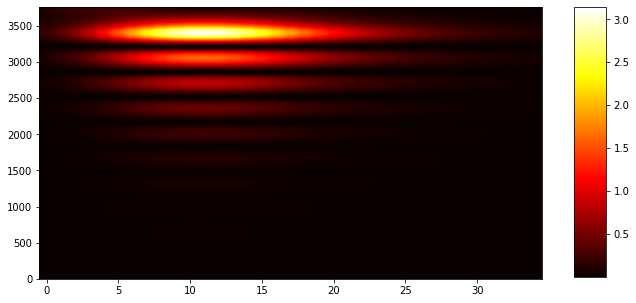

In [177]:
X_range = np.arange(-5, 30, 1)
#X_range = np.arange(20, 21, 1)

res = cut_BSW_intesity_1(46.33, X_range, opt_struct, a=5, L=0, polar='TE', wl=780.)
real_res = np.array(res)
plot_2Dmap(real_res[::-1], isE=True)

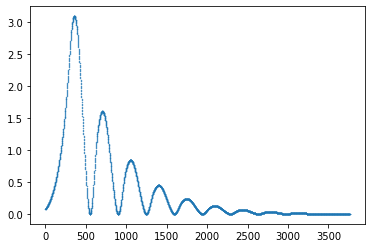

In [180]:
plt.plot(real_res[:,  12], 'o', markersize=0.4)

1.1175490345548673


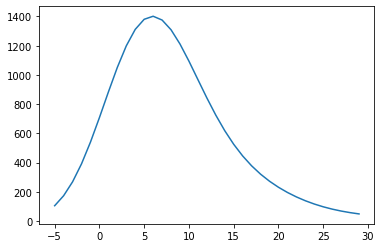

In [181]:
plt.plot(X_range, np.sum(real_res, axis=0))
print(np.max(np.sum(real_res, axis=0)) / 1000 / 1.254)

In [183]:
1.11754903 * 1000 * 1.254 * 1.09 / 1.5 / 1.254 / 1000

0.8120856284666665

In [49]:
n_arr = [1.5 + 0.0j, 1. + 0.0j]
d_arr = [295]

for i in range(10):
    n_arr.append(1.45 + 0.00002j)
    n_arr.append(2.07 + 0.00002j)
    d_arr.append(204)
    d_arr.append(143)
print(n_arr, d_arr)

[(1.5+0j), (1+0j), (1.45+2e-05j), (2.07+2e-05j), (1.45+2e-05j), (2.07+2e-05j), (1.45+2e-05j), (2.07+2e-05j), (1.45+2e-05j), (2.07+2e-05j), (1.45+2e-05j), (2.07+2e-05j), (1.45+2e-05j), (2.07+2e-05j), (1.45+2e-05j), (2.07+2e-05j), (1.45+2e-05j), (2.07+2e-05j), (1.45+2e-05j), (2.07+2e-05j), (1.45+2e-05j), (2.07+2e-05j)] [295, 204, 143, 204, 143, 204, 143, 204, 143, 204, 143, 204, 143, 204, 143, 204, 143, 204, 143, 204, 143]


wavelength 200, n_eff:  (0.960577943015+0.138336288213j)
wavelength 225, n_eff:  (0.988004767893+0.130038408364j)
wavelength 250, n_eff:  (1.0044378355+0.114051794677j)
wavelength 275, n_eff:  (1.01095867126+0.0940173011539j)
wavelength 300, n_eff:  (1.00721978347+0.0860271688806j)
wavelength 325, n_eff:  (1.0079946625+0.0863187769103j)
wavelength 350, n_eff:  (1.00808056952+0.0887499433787j)
wavelength 375, n_eff:  (1.01166107848+0.087111562595j)
wavelength 400, n_eff:  (1.01338615995+0.0849062484606j)
wavelength 425, n_eff:  (1.01421774213+0.0856446047566j)
wavelength 450, n_eff:  (1.01718328168+0.0909178042737j)
wavelength 475, n_eff:  (1.0224626003+0.101316325317j)
wavelength 500, n_eff:  (1.05447993856+0.109901679273j)
wavelength 525, n_eff:  (1.09404473484+0.0691078531358j)
wavelength 550, n_eff:  (1.08298647175+0.0337191875388j)
wavelength 575, n_eff:  (1.06840192064+0.0177522316662j)
wavelength 600, n_eff:  (1.05616663686+0.00995799497851j)
wavelength 625, n_eff:  (1.0470864562

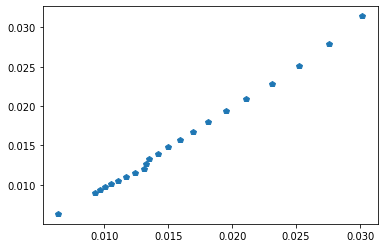

In [18]:
def n_eff_calc(e2, e1=1.0 + 0.j):
    return np.sqrt(e1 * e2 / (e1 + e2), dtype=np.complex)

e1 = 1. + 0.j
e2 = 1. + 0.j


w = 2 * np.pi / l_arr 
res = np.empty(np.size(n_arr), dtype=np.complex)
for i, n_i in enumerate(n_arr):
    res[i]=n_eff_calc(n_i ** 2)
    print("wavelength %d, n_eff: " % l_arr[i], res[i])
plt.plot(w * np.real(res), w, 'p')

In [2]:
data = pd.read_csv("file.txt", sep='\t', header=None)
data1 = pd.read_csv("RII_argentim.txt", sep='\t', header=None)


In [51]:
def plot_dispersion_law(data, threshold=0.56, name="gold", ret_dat=False):
    exp_const = 1.0e16

    fig, ax = plt.subplots(2, 2, figsize=(12, 12))
    wavelength = np.array(data.loc[:, 0]) * 1.0e-6
    n_complex = np.array(data.loc[:, 1] + 1.0j * data.loc[:, 2])
    e_complex = n_complex ** 2
    coef = np.sqrt(e_complex * (1. + 0.j) / (e_complex + 1. + 0.j), dtype= np.complex)
    k_ = 2. * np.pi / wavelength
    omega = 2. * np.pi * 3. * 1.0e8 / wavelength
    X = coef * k_.real

    truth_ = [omega < threshold * exp_const]
    
    ax[0, 0].plot(X.real, omega, 'o', label=name)
    ax[0, 1].plot(coef.real, omega, 'o')
    ax[1, 0].plot(wavelength, coef.real, 'o')
    ax[1, 1].plot(wavelength[truth_], coef[truth_].real, 'o', label='Only plasmon part')

    ax[0, 0].set_title("$\omega(k)$", fontsize=15) 
    ax[0, 1].set_title("$\omega(n_{eff})$", fontsize=15) 
    ax[1, 0].set_title("$\lambda(n_{eff})$", fontsize=15) 
    ax[1, 1].set_title("$Free$", fontsize=15) 
    
    ax[0, 0].grid()
    ax[1, 0].grid()
    ax[1, 1].grid()
    ax[0, 1].grid()
    
    ax[0, 0].legend()
    ax[1, 1].legend()
    if ret_dat == True:
        print("wl: \n", wavelength[truth_] * 1e9)
        print("n: \n", n_complex[truth_])
        
#         [print("wl: %f, n_eff: %f " % (wavelength[truth_][i] * 1e9,coef[truth_][i].real)) for i in range(np.size(wavelength[truth_]))]

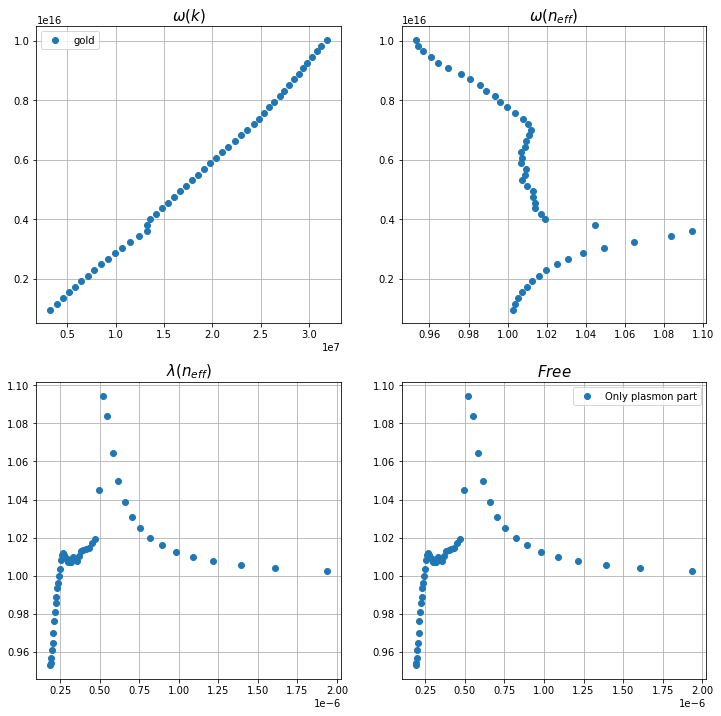

In [52]:
plot_dispersion_law(data, 1e3, 'gold')

wl: 
 [  342.5   354.2   367.9   381.5   397.4   413.3   430.5   450.9   471.4
   495.9   520.9   548.6   582.1   616.8   659.5   704.5   756.    821.1
   892.    984.   1088.   1216.   1393.   1610.   1937. ]
n: 
 [ 0.14 +1.142j  0.10 +1.419j  0.07 +1.657j  0.05 +1.864j  0.05 +2.07j
  0.05 +2.275j  0.04 +2.462j  0.04 +2.657j  0.05 +2.869j  0.05 +3.093j
  0.05 +3.324j  0.06 +3.586j  0.05 +3.858j  0.06 +4.152j  0.05 +4.483j
  0.04 +4.838j  0.03 +5.242j  0.04 +5.727j  0.04 +6.312j  0.04 +6.992j
  0.04 +7.795j  0.09 +8.828j  0.13+10.1j    0.15+11.85j   0.24+14.08j ]


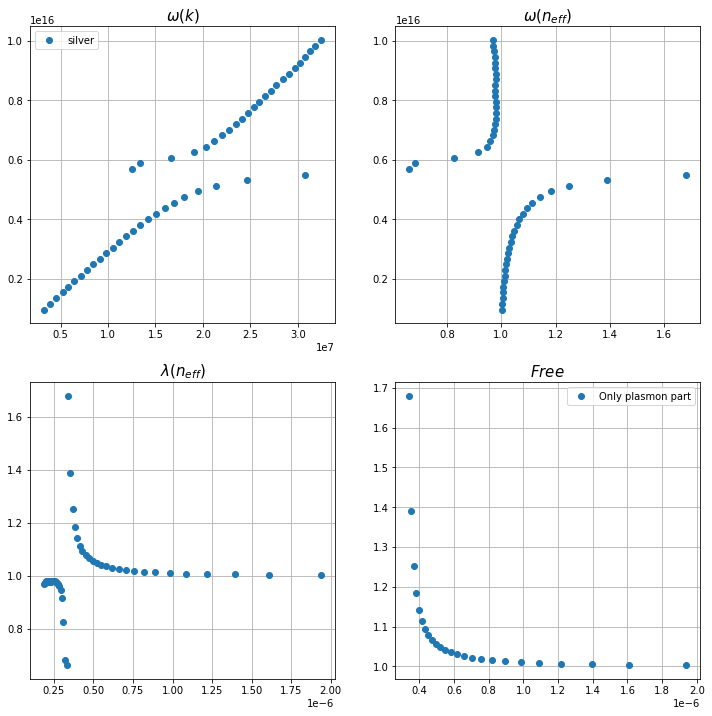

In [53]:
plot_dispersion_law(data1, 0.56, 'silver', True)

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import itertools
from tmm_utils import *
from numba import njit

In [51]:
np.sqrt((0.03 +5.242j) ** 2 * (1.41)**2 / (0.03 +5.242j**2 + (1.41) ** 2))


(1.4648156530806584-0.008383149483483355j)

[50.670670670670674, 50.670670670670674, 50.670670670670674, 46.586586586586584]


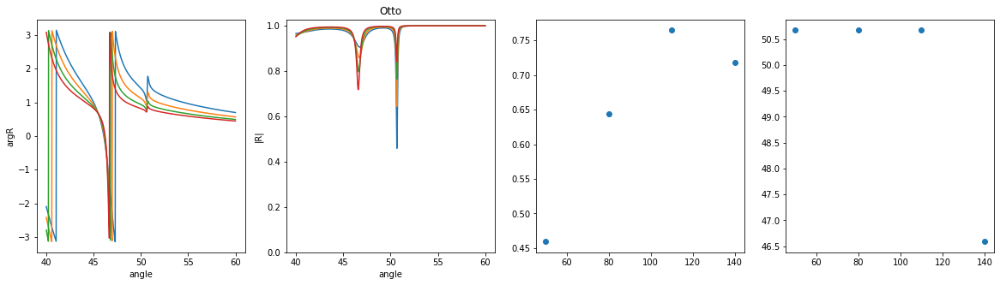

In [71]:
wl_Ag = 1550.0
n_Ag  = 0.55 + 11.5j

# wl_Ag=756
# n_Ag=0.03 +5.242j

plasmon_struct = {
    0: {'name': 'Среда', 'n': 2.},
    1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 700.},
    2: {'name': 'Слой',  'n': 1.535 + 0.00002j, 'd': 2000.},
    3: {'name': 'Слой',  'n': n_Ag, 'd': 100.},
    4: {'name': 'Среда', 'n': 1.6}
       }

# plasmon_struct = {
#     0: {'name': 'Среда', 'n': 1.5},
#     1: {'name': 'Слой',  'n': 1. + 0.j, 'd': 700.},
#     2: {'name': 'Слой',  'n': 1.41 + 0.00002j, 'd': 550.},
#     3: {'name': 'Слой',  'n': n_Ag, 'd': 50.},
#     4: {'name': 'Среда', 'n': 1.52}
#        }

fig, ax1 = plt.subplots(1, 4, figsize=(20, 5))
res_min = []
angl_min = []
gaps_ranges = np.arange(50, 150, 30)
for gap in gaps_ranges:
    angles = np.linspace(40, 60, 1000)
    plasmon_struct[1]['d'] = gap
    res = vectorize_R(angles, wl_Ag, plasmon_struct, "TM")
    ax1[0].plot(angles, np.angle(res))
    minind = np.argmin(abs(res))
#     minl = np.max(abs(res)[:minind]) - (1 - np.min(abs(res))) / np.e
#     print(minl, angles[angles < minl][0])
    ax1[1].plot(angles, abs(res), label=str(gap) + "  " + str(angles[np.argmin(abs(res))]))
    res_min.append(np.min(np.abs(res)))
    angl_min.append(angles[np.argmin(np.abs(res))])
    
ax1[1].set_ylim(bottom=0)
ax1[0].set_xlabel("angle")
ax1[0].set_ylabel("argR")
ax1[1].set_xlabel("angle")
ax1[1].set_ylabel("|R|")
ax1[1].set_title("Otto")
#ax1[1].legend()

ax1[2].plot(gaps_ranges, res_min, 'o')
ax1[3].plot(gaps_ranges, angl_min, 'o')
print(angl_min)

In [70]:
np.sin(49.46946946946947 * np.pi / 180) * 2

1.520119587784567

2110


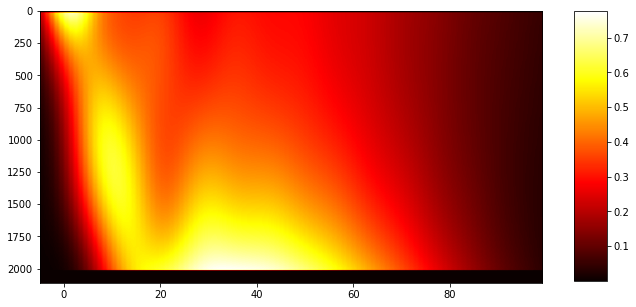

In [73]:
X_range = np.arange(-5, 100, 1)
plasmon_struct[1]['d'] = 10
# plasmon_struct[2]['d'] = 60
res = cut_BSW_intesity_1(50.670670670670674, X_range, plasmon_struct, a=5., L=0, polar='TM', wl=wl_Ag)
real_res = np.array(res)
sum_arr = np.array([plasmon_struct[i]['d'] for i in range(1, len(plasmon_struct) - 1)])
print(int(np.sum(sum_arr)))
plot_2Dmap(real_res[::-1], [X_range.min(), X_range.max(), int(np.sum(sum_arr)), 0], isE=True)

1800


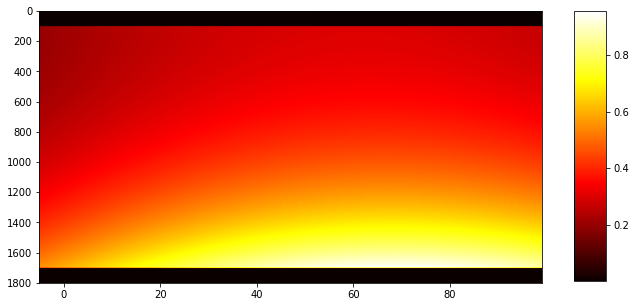

In [267]:
X_range = np.arange(-5, 100, 1)
plasmon_struct[1]['d'] = 100
res = cut_BSW_intesity_1(50.57, X_range, plasmon_struct, a=75., L=0, polar='TM', wl=1550)
real_res = np.array(res)
sum_arr = np.array([plasmon_struct[i]['d'] for i in range(1, len(plasmon_struct) - 1)])
print(int(np.sum(sum_arr)))
plot_2Dmap(real_res[::-1], [X_range.min(), X_range.max(), int(np.sum(sum_arr)), 0], isE=True)

200


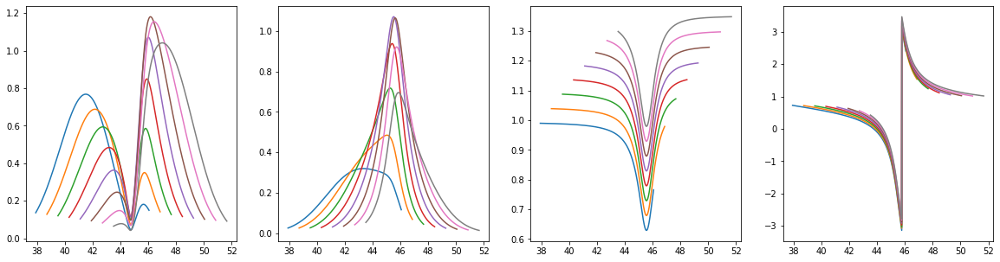

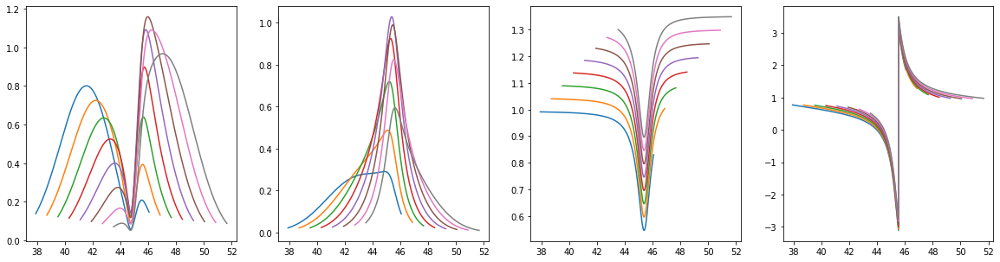

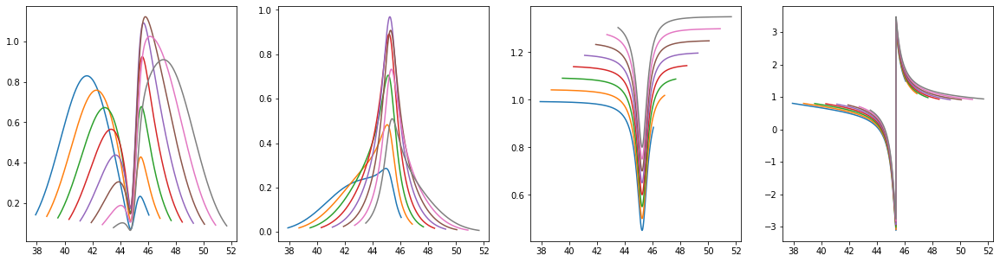

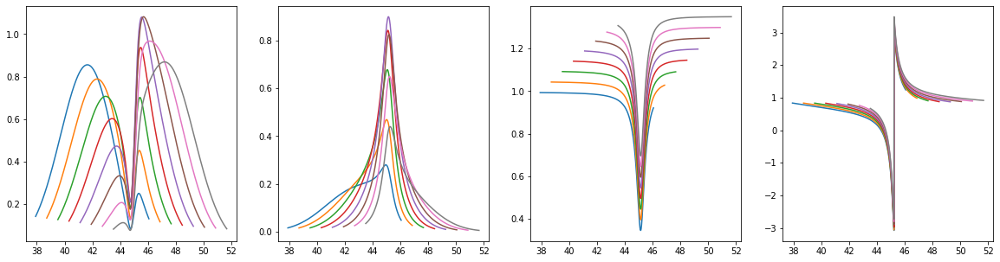

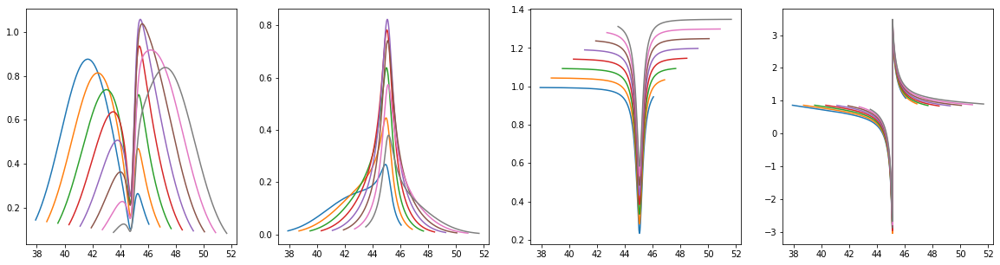

...

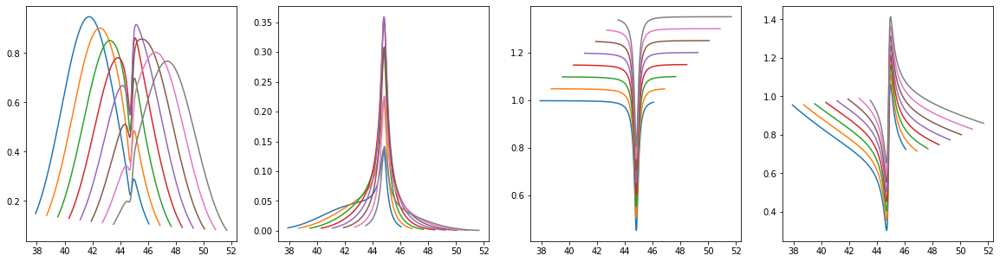

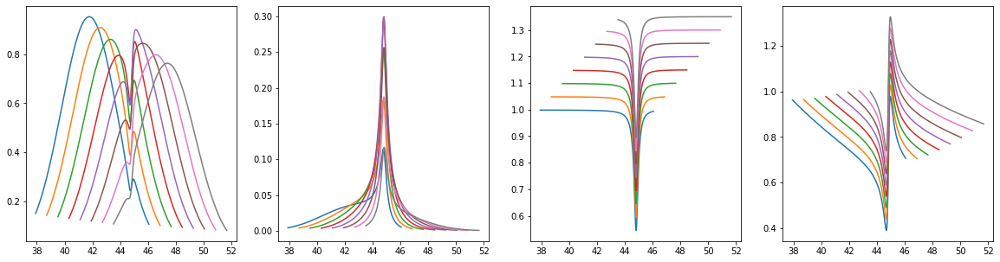

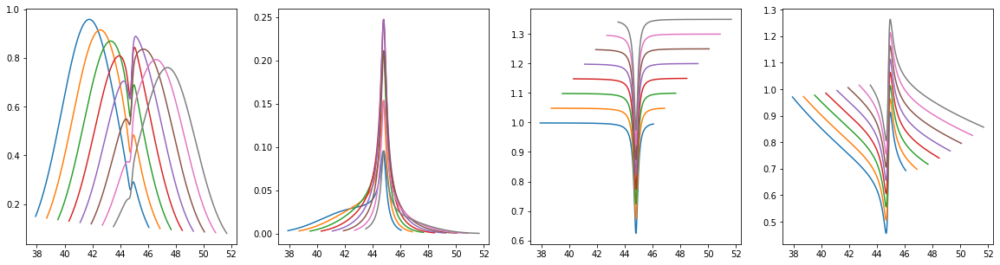

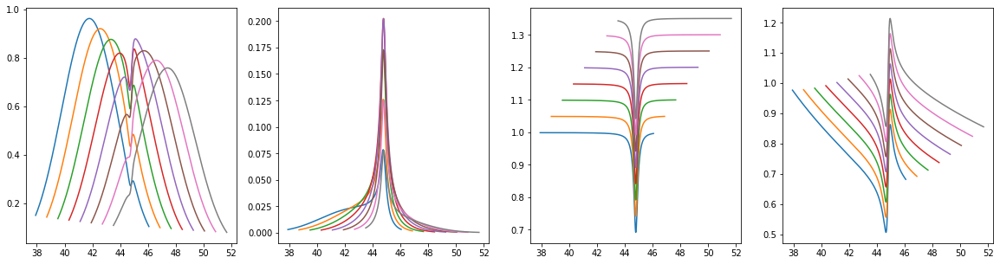

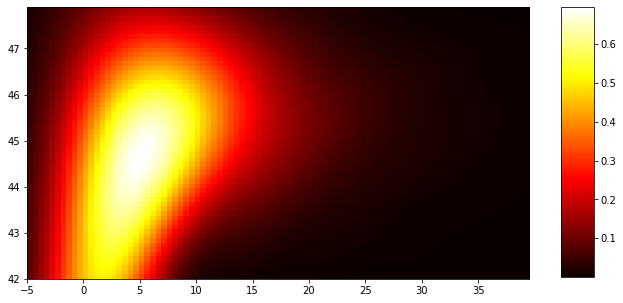

230


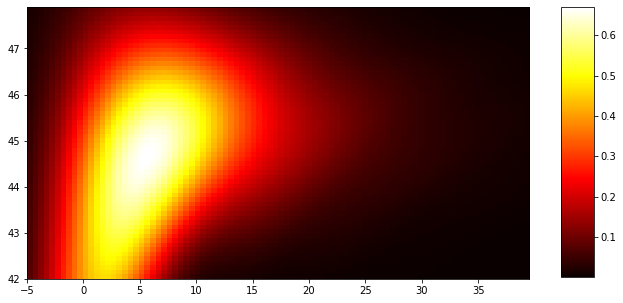

260


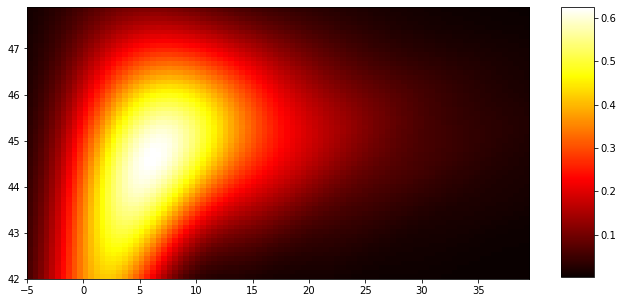

290


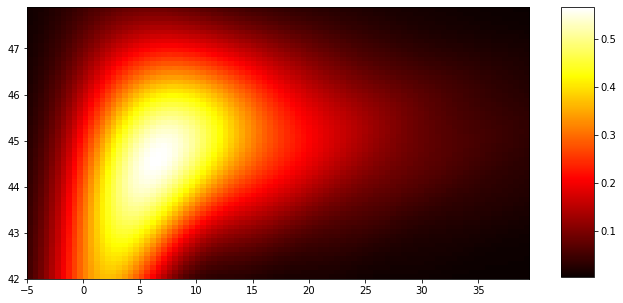

320


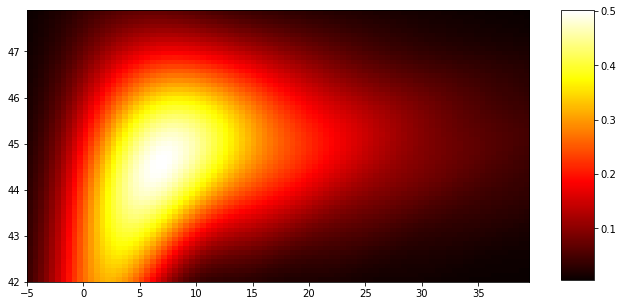

350


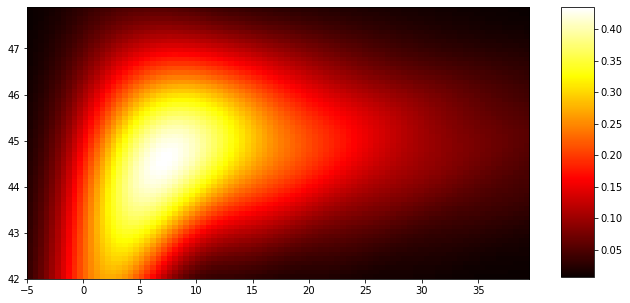

380


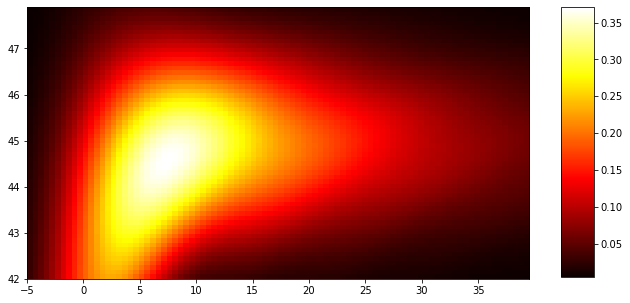

410


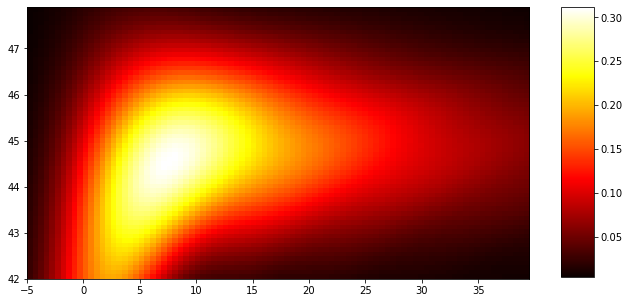

440


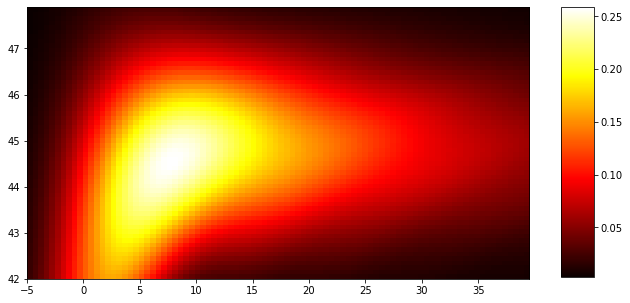

470


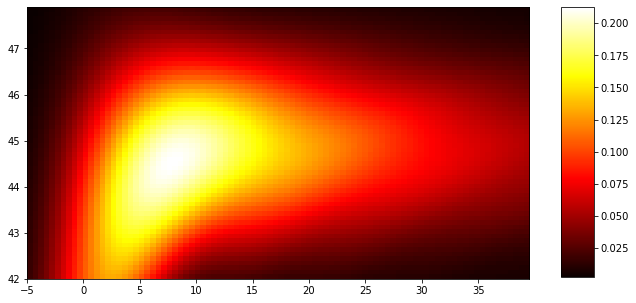

500


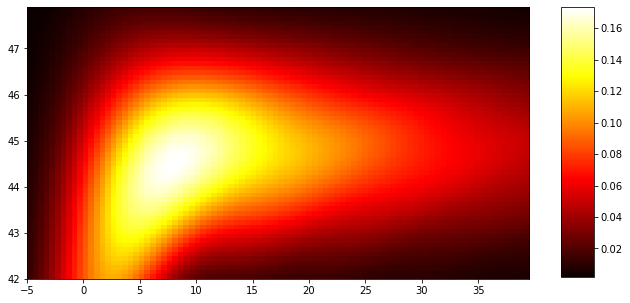

530


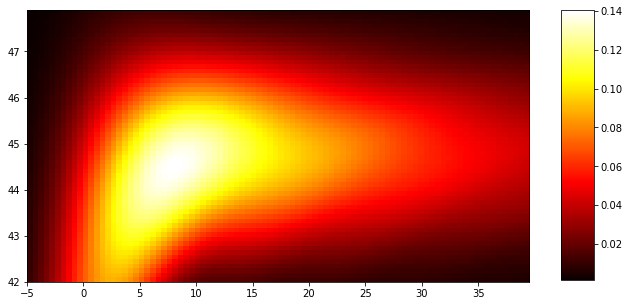

560


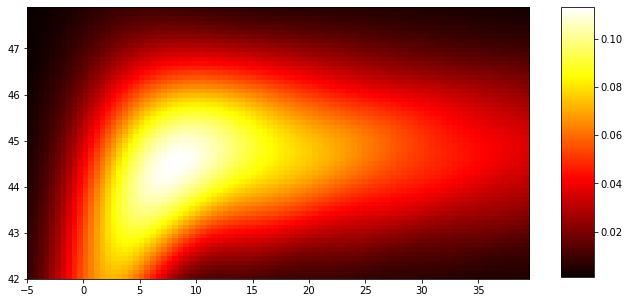

590


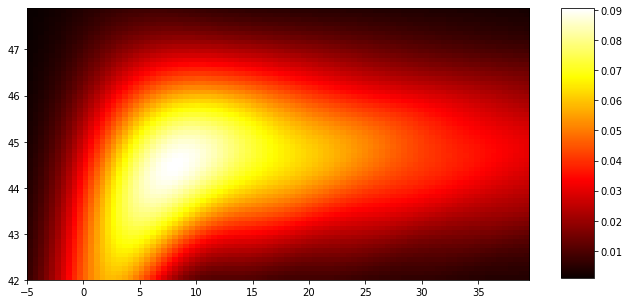

In [7]:
angles_range = np.arange(42, 48., 0.1)
X_range = np.arange(-5, 40, 0.5)
E_slices = []
gap_range = np.arange(200, 600, 30)
for i, gap in enumerate(gap_range):
    plasmon_struct[1]['d'] = gap
    E_slices.append(cut_BSW_intesity(angles_range, X_range, plasmon_struct, 5., 
                                     plasmon_struct[1]['d'] / 1000, 0, polar="TM", wl=wl_Ag, plasmon=False))
for i, E in enumerate(E_slices):
    #max_params = get_max_angle(E, True)
    #print("Spot size: ", 2 * spot_range[i], "angle: ", max_params[0], "shift: ", max_params[1])
    print(gap_range[i])
    plot_2Dmap(E, [X_range.min(), X_range.max(), angles_range.min(), angles_range.max()])